# Indoor Localization

Final project for Data Science bootcamp organized by Sages. 

## Table of contents
1. Abstract
2. Data description
3. Data preparation
4. Model training
    * Classification
    * Regression
5. Visualisation of results
6. Data and model tuning
7. Summary
8. References

# 1. Abstract
The following project would be an attempt to create a model for indoor positioning system using WiFi fingerprint. 

# 2. Data description

The UJIIndoorLoc database covers three buildings of Universitat Jaume I with 4 or more floors and almost 110.000m2. It was created in 2013 by means of more than 20 different users and 25 Android devices. The database consists of 19937 training/reference records (trainingData.csv file) and 1111 validation/test records (validationData.csv file).

The 529 attributes contain the WiFi fingerprint, the coordinates where it was taken, and other useful information.

Each WiFi fingerprint can be characterized by the detected Wireless Access Points (WAPs) and the corresponding Received Signal Strength Intensity (RSSI). The intensity values are represented as negative integer values ranging -104dBm (extremely poor signal) to 0dbM. The positive value 100 is used to denote when a WAP was not detected. During the database creation, 520 different WAPs were detected. Thus, the WiFi fingerprint is composed by 520 intensity values.
Then the coordinates (latitude, longitude, floor) and Building ID are provided as the attributes to be predicted.

# 3. Data preparation

At first basic modules and data need to be imported.

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

In [5]:
train_data = pd.read_csv('./Data/UJIndoorLoc/trainingData.csv')
train_data.head()

,WAP001,WAP002,WAP003,WAP004,WAP005,WAP006,WAP007,WAP008,WAP009,WAP010,...,WAP520,LONGITUDE,LATITUDE,FLOOR,BUILDINGID,SPACEID,RELATIVEPOSITION,USERID,PHONEID,TIMESTAMP
0,100,100,100,100,100,100,100,100,100,100,...,100,-7541.2643,4.864921e+06,2,1,106,2,2,23,1371713733
1,100,100,100,100,100,100,100,100,100,100,...,100,-7536.6212,4.864934e+06,2,1,106,2,2,23,1371713691
2,100,100,100,100,100,100,100,-97,100,100,...,100,-7519.1524,4.864950e+06,2,1,103,2,2,23,1371714095
3,100,100,100,100,100,100,100,100,100,100,...,100,-7524.5704,4.864934e+06,2,1,102,2,2,23,1371713807
4,100,100,100,100,100,100,100,100,100,100,...,100,-7632.1436,4.864982e+06,0,0,122,2,11,13,1369909710


In [6]:
test_data = pd.read_csv('./Data/UJIndoorLoc/validationData.csv')
test_data.head()

,WAP001,WAP002,WAP003,WAP004,WAP005,WAP006,WAP007,WAP008,WAP009,WAP010,...,WAP520,LONGITUDE,LATITUDE,FLOOR,BUILDINGID,SPACEID,RELATIVEPOSITION,USERID,PHONEID,TIMESTAMP
0,100,100,100,100,100,100,100,100,100,100,...,100,-7515.916799,4.864890e+06,1,1,0,0,0,0,1380872703
1,100,100,100,100,100,100,100,100,100,100,...,100,-7383.867221,4.864840e+06,4,2,0,0,0,13,1381155054
2,100,100,100,100,100,100,100,100,100,100,...,100,-7374.302080,4.864847e+06,4,2,0,0,0,13,1381155095
3,100,100,100,100,100,100,100,100,100,100,...,100,-7365.824883,4.864843e+06,4,2,0,0,0,13,1381155138
4,100,100,100,100,100,100,100,100,100,100,...,100,-7641.499303,4.864922e+06,2,0,0,0,0,2,1380877774


Next step is to remove unnecessary colmumns - in that case columns "SPACEID", "RELATIVEPOSITION", "USERID", "PHONEID", "TIMESTAMP" shall be removed.

In [7]:
train_data.drop(['SPACEID','RELATIVEPOSITION','USERID','PHONEID','TIMESTAMP'], axis=1, inplace=True )
train_data.head()

,WAP001,WAP002,WAP003,WAP004,WAP005,WAP006,WAP007,WAP008,WAP009,WAP010,...,WAP515,WAP516,WAP517,WAP518,WAP519,WAP520,LONGITUDE,LATITUDE,FLOOR,BUILDINGID
0,100,100,100,100,100,100,100,100,100,100,...,100,100,100,100,100,100,-7541.2643,4.864921e+06,2,1
1,100,100,100,100,100,100,100,100,100,100,...,100,100,100,100,100,100,-7536.6212,4.864934e+06,2,1
2,100,100,100,100,100,100,100,-97,100,100,...,100,100,100,100,100,100,-7519.1524,4.864950e+06,2,1
3,100,100,100,100,100,100,100,100,100,100,...,100,100,100,100,100,100,-7524.5704,4.864934e+06,2,1
4,100,100,100,100,100,100,100,100,100,100,...,100,100,100,100,100,100,-7632.1436,4.864982e+06,0,0


In [8]:
test_data.drop(['SPACEID','RELATIVEPOSITION','USERID','PHONEID','TIMESTAMP'], axis=1, inplace=True )
test_data.head()

,WAP001,WAP002,WAP003,WAP004,WAP005,WAP006,WAP007,WAP008,WAP009,WAP010,...,WAP515,WAP516,WAP517,WAP518,WAP519,WAP520,LONGITUDE,LATITUDE,FLOOR,BUILDINGID
0,100,100,100,100,100,100,100,100,100,100,...,100,100,100,100,100,100,-7515.916799,4.864890e+06,1,1
1,100,100,100,100,100,100,100,100,100,100,...,100,100,100,100,100,100,-7383.867221,4.864840e+06,4,2
2,100,100,100,100,100,100,100,100,100,100,...,100,100,100,100,100,100,-7374.302080,4.864847e+06,4,2
3,100,100,100,100,100,100,100,100,100,100,...,100,100,100,100,100,100,-7365.824883,4.864843e+06,4,2
4,100,100,100,100,100,100,100,100,100,100,...,100,100,100,100,100,100,-7641.499303,4.864922e+06,2,0


For data visualisation purpose both train and test data shall be joined.

In [9]:
plot_data = pd.concat([train_data, test_data], join='inner', ignore_index=True)

Below the comparison between chart based on dataset and satelite photograph is shown.

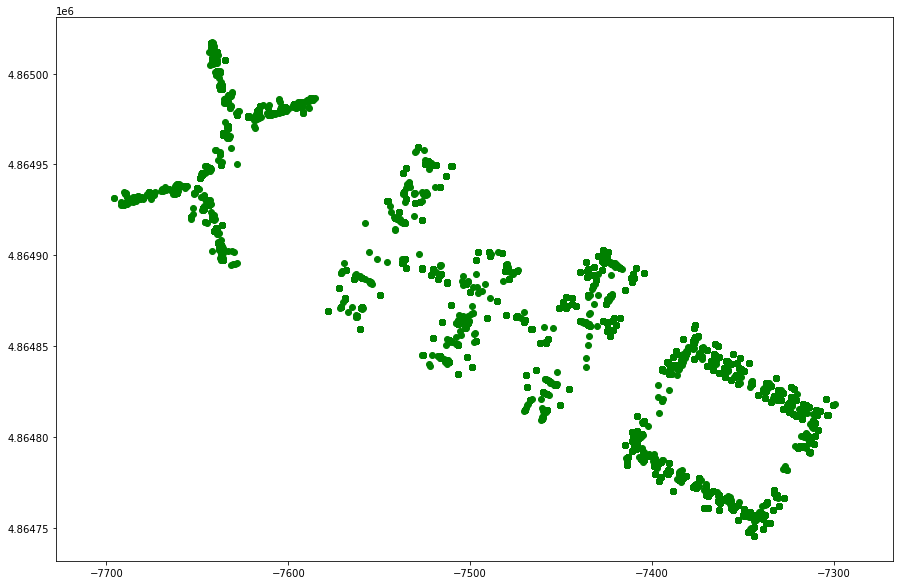

In [10]:
fig = plt.figure(figsize=(15,10))
plt.axis('equal')
plt.scatter(x=plot_data['LONGITUDE'], y=plot_data['LATITUDE'],c='g')
plt.show()

<img src="./Data/Satelite_view.png">

And one more chart showing the distribution of data points between buildings and floors.

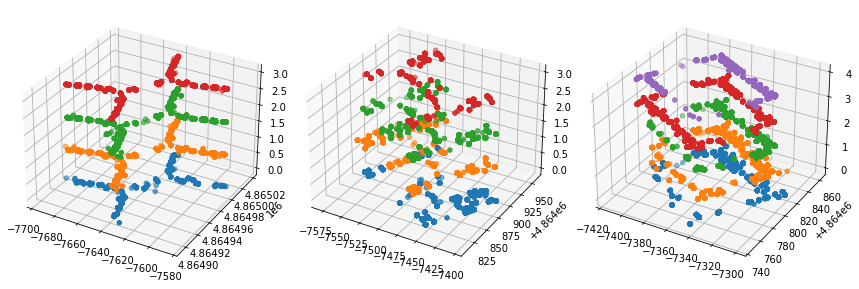

In [11]:
fig = plt.figure(figsize=plt.figaspect(1/3))
for i in range(len(np.unique(plot_data['BUILDINGID']))):
    ax = fig.add_subplot(1,3,(i+1),projection='3d')
    for j in range(len(np.unique(plot_data['FLOOR'][plot_data['BUILDINGID']==i]))):
        ax.scatter(plot_data['LONGITUDE'][plot_data['BUILDINGID']==i][plot_data['FLOOR']==j], 
                   plot_data['LATITUDE'][plot_data['BUILDINGID']==i][plot_data['FLOOR']==j], 
                   plot_data['FLOOR'][plot_data['BUILDINGID']==i][plot_data['FLOOR']==j],)
fig.tight_layout()
plt.show()

Occurence of missing data should be checked.

In [12]:
print('Number of missing values in train data: ',train_data.isnull().sum().sum())
print('Number of missing values in test data: ',test_data.isnull().sum().sum())

Number of missing values in train data:  0
Number of missing values in test data:  0


There aren't any missing data so there is no need to use any missing data handling like SimpleImputer.
Now division on signal data/location data for train data shall be done.

In [13]:
X_train = train_data[[i for i in train_data.columns if 'WAP' in i]]
y_train = train_data[[i for i in train_data.columns if not 'WAP' in i]]
print(X_train.shape, y_train.shape)
print(y_train.columns)

(19937, 520) (19937, 4)
Index(['LONGITUDE', 'LATITUDE', 'FLOOR', 'BUILDINGID'], dtype='object')


Same operation for test data.

In [14]:
X_test = test_data[[i for i in test_data.columns if 'WAP' in i]]
y_test = test_data[[i for i in test_data.columns if not 'WAP' in i]]
print(X_test.shape, y_test.shape)
print(y_test.columns)

(1111, 520) (1111, 4)
Index(['LONGITUDE', 'LATITUDE', 'FLOOR', 'BUILDINGID'], dtype='object')


To give the data 'more continuous manner' the following replacement shall be done: 100 value, which stands for no WAP detection will be changed to -111, so the value would be slightly lower than lowest signal intensity (equal to -104).

In [15]:
X_train = X_train.replace(to_replace=100,value=-111)
X_test = X_test.replace(to_replace=100,value=-111)

To standardize features by removing the mean and scaling to unit variance the StandardScaler algorithm will be used.

In [14]:
from sklearn.preprocessing import MinMaxScaler
_ = MinMaxScaler()
X_train_show = pd.DataFrame(_.fit_transform(X_train))
X_train_show.head()

,0,1,2,3,4,5,6,7,8,9,...,510,511,512,513,514,515,516,517,518,519
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.28,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


To speed up learing process feature selection shall be used. VarianceThreshold selector will eliminate features with low variance (in that case with zero variance).

In [15]:
from sklearn.feature_selection import VarianceThreshold
_ = VarianceThreshold()
X_train_show = pd.DataFrame(_.fit_transform(X_train_show))
X_train_show.head()

,0,1,2,3,4,5,6,7,8,9,...,455,456,457,458,459,460,461,462,463,464
0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.28,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


To further improve model speed performance dimension reduction PCA algorithm could be useful since still there are a lot of features (465).

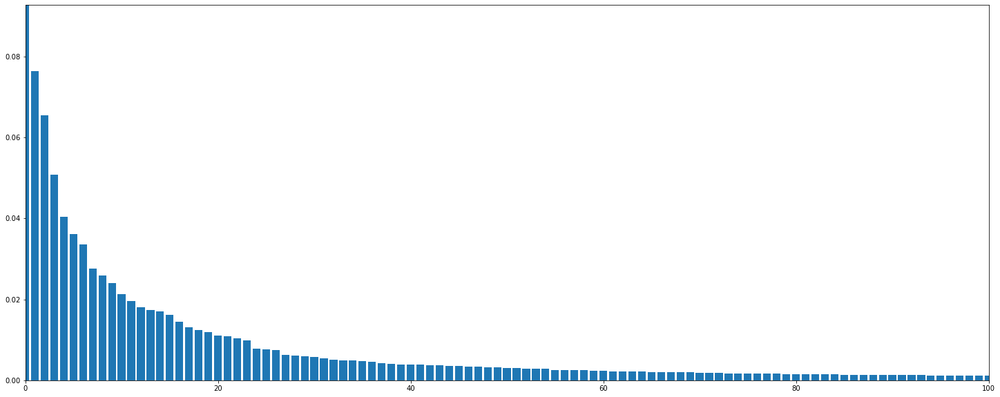

In [16]:
from sklearn.decomposition import PCA
_ = PCA()
_.fit(X_train_show)
fig = plt.figure(figsize=(25,10))
plt.bar(range(_.n_components_),_.explained_variance_ratio_)
plt.xlim(0,100)
plt.ylim(0,max(_.explained_variance_ratio_))
plt.show()

Checking how many components shall be taken into consideration to get 85% of variance explained.

In [17]:
exp_var_percentage=0
counter=0
while exp_var_percentage<0.85:
    exp_var_percentage+=_.explained_variance_ratio_[counter]
    counter+=1
print(counter)

71


In [18]:
X_train_show = pd.DataFrame(_.transform(X_train_show)[:,:counter])
X_train_show.head()

,0,1,2,3,4,5,6,7,8,9,...,61,62,63,64,65,66,67,68,69,70
0,0.194243,0.082613,0.213733,-0.813391,0.532590,-0.101100,-1.367909,-0.322478,-0.025442,-0.425457,...,0.026222,0.001488,0.021202,0.028985,-0.005787,-0.002484,0.038383,-0.004163,-0.002937,-0.016317
1,0.183861,0.078874,0.197059,-0.755497,0.495436,-0.086880,-1.222826,-0.291246,0.061478,-0.307453,...,0.043121,0.098540,0.135948,0.017984,-0.105805,-0.052712,0.085346,-0.086122,-0.016115,0.085293
2,0.105887,0.048186,0.224835,-0.659491,0.300856,-0.156380,-1.118716,-0.209435,-0.294557,-0.310426,...,0.036862,0.015159,0.072926,0.028253,-0.044859,-0.020608,0.017618,-0.001214,-0.008178,0.023585
3,0.203272,0.082838,0.257415,-0.793455,0.422135,-0.057169,-1.297964,-0.210593,-0.248045,-0.612657,...,-0.068931,-0.065218,-0.141176,-0.021531,0.118846,0.054749,-0.058830,0.013864,0.018191,-0.074506
4,0.092538,0.035936,0.049692,-0.168647,0.030843,-0.002108,-0.039711,0.061856,0.108095,0.016411,...,0.005092,-0.017296,0.016312,0.044334,-0.023853,-0.015777,-0.033199,0.059891,-0.000520,-0.013212


The usage of MinMaxScaler, VarianceThreshold and PCA methods would be incorporated into models through preprocessing pipeline. Above the explanation of those methods was shown.

# 4. Model training

In this project model based on following algorithm families shall be compared:
   * Random Forest
   * K-nearest Neighbours
   * Support Vector Machine

For each algorithm GridSearchCV method shall be used for appropiate of parameters. Below appropiate modules are being imported.

In [16]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import VarianceThreshold
from sklearn.decomposition import PCA

from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV, KFold, StratifiedKFold
from sklearn import metrics
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.neighbors import KNeighborsRegressor, KNeighborsClassifier
from sklearn.svm import SVR, SVC
from sklearn import metrics

## Classification

Below StratifiedKFold would be implemented. It provides train/test indices to split data in train/test sets. This cross-validation object is a variation of KFold that returns stratified folds. The folds are made by preserving the percentage of samples for each class.

In [17]:
skfold = StratifiedKFold(n_splits=5, random_state=77, shuffle=True)

### Random Forest Classification

In [23]:
preprocessing_pipeline_rfc_alt = Pipeline([
    ('data_scaling', MinMaxScaler()),
    ('feature_selection_1', VarianceThreshold()),
    ('dimension_reduction', PCA(0.85)),
    ('model', RandomForestClassifier())
    ])
param_grid_rfc_alt = {
    'model__max_depth': [10],
    'model__n_estimators': [i for i in range(100,600,100)],
    'model__min_samples_leaf': [i for i in range(2,7,1)]
    }
clf_model_rfc_alt = GridSearchCV(estimator=preprocessing_pipeline_rfc_alt, 
                                 param_grid=param_grid_rfc_alt, 
                                 cv=skfold, 
                                 return_train_score=True,
                                 verbose=3)
clf_model_rfc_alt.fit(X_train, y_train['FLOOR'])
clf_model_rfc_alt.best_params_

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=100; total time=   8.1s
[CV 2/5] END model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=100; total time=   7.9s
[CV 3/5] END model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=100; total time=   7.8s
[CV 4/5] END model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=100; total time=   7.7s
[CV 5/5] END model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=100; total time=   7.8s
[CV 1/5] END model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=200; total time=  14.8s
[CV 2/5] END model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=200; total time=  14.7s
[CV 3/5] END model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=200; total time=  14.8s
[CV 4/5] END model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=200; total time= 

[CV 4/5] END model__max_depth=10, model__min_samples_leaf=5, model__n_estimators=100; total time=  20.6s
[CV 5/5] END model__max_depth=10, model__min_samples_leaf=5, model__n_estimators=100; total time=  11.6s
[CV 1/5] END model__max_depth=10, model__min_samples_leaf=5, model__n_estimators=200; total time=  18.8s
[CV 2/5] END model__max_depth=10, model__min_samples_leaf=5, model__n_estimators=200; total time=  18.4s
[CV 3/5] END model__max_depth=10, model__min_samples_leaf=5, model__n_estimators=200; total time=  17.1s
[CV 4/5] END model__max_depth=10, model__min_samples_leaf=5, model__n_estimators=200; total time=  18.3s
[CV 5/5] END model__max_depth=10, model__min_samples_leaf=5, model__n_estimators=200; total time=  17.6s
[CV 1/5] END model__max_depth=10, model__min_samples_leaf=5, model__n_estimators=300; total time=  27.3s
[CV 2/5] END model__max_depth=10, model__min_samples_leaf=5, model__n_estimators=300; total time=  25.0s
[CV 3/5] END model__max_depth=10, model__min_samples_le

{'model__max_depth': 10,
 'model__min_samples_leaf': 2,
 'model__n_estimators': 500}

In [24]:
preprocessing_pipeline_rfc_bld = Pipeline([
    ('data_scaling', MinMaxScaler()),
    ('feature_selection_1', VarianceThreshold()),
    ('dimension_reduction', PCA(0.85)),
    ('model', RandomForestClassifier())
    ])
param_grid_rfc_bld = {
    'model__max_depth': [10],
    'model__n_estimators': [i for i in range(100,600,100)],
    'model__min_samples_leaf': [i for i in range(2,7,1)]
    }
clf_model_rfc_bld = GridSearchCV(estimator=preprocessing_pipeline_rfc_bld, 
                                 param_grid=param_grid_rfc_bld, 
                                 cv=skfold, 
                                 return_train_score=True,
                                 verbose=3)
clf_model_rfc_bld.fit(X_train, y_train['BUILDINGID'])
clf_model_rfc_bld.best_params_

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=100; total time=   6.0s
[CV 2/5] END model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=100; total time=   6.1s
[CV 3/5] END model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=100; total time=   6.1s
[CV 4/5] END model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=100; total time=   6.1s
[CV 5/5] END model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=100; total time=   5.9s
[CV 1/5] END model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=200; total time=  11.5s
[CV 2/5] END model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=200; total time=  11.6s
[CV 3/5] END model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=200; total time=  11.6s
[CV 4/5] END model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=200; total time= 

[CV 4/5] END model__max_depth=10, model__min_samples_leaf=5, model__n_estimators=100; total time=   6.0s
[CV 5/5] END model__max_depth=10, model__min_samples_leaf=5, model__n_estimators=100; total time=   6.0s
[CV 1/5] END model__max_depth=10, model__min_samples_leaf=5, model__n_estimators=200; total time=  11.3s
[CV 2/5] END model__max_depth=10, model__min_samples_leaf=5, model__n_estimators=200; total time=  11.5s
[CV 3/5] END model__max_depth=10, model__min_samples_leaf=5, model__n_estimators=200; total time=  11.6s
[CV 4/5] END model__max_depth=10, model__min_samples_leaf=5, model__n_estimators=200; total time=  10.9s
[CV 5/5] END model__max_depth=10, model__min_samples_leaf=5, model__n_estimators=200; total time=  11.5s
[CV 1/5] END model__max_depth=10, model__min_samples_leaf=5, model__n_estimators=300; total time=  17.2s
[CV 2/5] END model__max_depth=10, model__min_samples_leaf=5, model__n_estimators=300; total time=  16.9s
[CV 3/5] END model__max_depth=10, model__min_samples_le

{'model__max_depth': 10,
 'model__min_samples_leaf': 2,
 'model__n_estimators': 500}

### K-Nearest Neighbours Classification

In [25]:
preprocessing_pipeline_knc_alt = Pipeline([
    ('data_scaling', MinMaxScaler()),
    ('feature_selection_1', VarianceThreshold()),
    ('dimension_reduction', PCA(0.85)),
    ('model', KNeighborsClassifier())
    ])
param_grid_knc_alt = {
    'model__n_neighbors': [i for i in range(2,7,1)],
    'model__leaf_size': [i for i in range(5,55,10)]
    }
clf_model_knc_alt = GridSearchCV(estimator=preprocessing_pipeline_knc_alt, 
                                 param_grid=param_grid_knc_alt, 
                                 cv=skfold, 
                                 return_train_score=True,
                                 verbose=3)
clf_model_knc_alt.fit(X_train, y_train['FLOOR'])
clf_model_knc_alt.best_params_

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END .......model__leaf_size=5, model__n_neighbors=2; total time=   1.6s
[CV 2/5] END .......model__leaf_size=5, model__n_neighbors=2; total time=   1.5s
[CV 3/5] END .......model__leaf_size=5, model__n_neighbors=2; total time=   1.5s
[CV 4/5] END .......model__leaf_size=5, model__n_neighbors=2; total time=   1.6s
[CV 5/5] END .......model__leaf_size=5, model__n_neighbors=2; total time=   1.5s
[CV 1/5] END .......model__leaf_size=5, model__n_neighbors=3; total time=   1.6s
[CV 2/5] END .......model__leaf_size=5, model__n_neighbors=3; total time=   1.6s
[CV 3/5] END .......model__leaf_size=5, model__n_neighbors=3; total time=   1.6s
[CV 4/5] END .......model__leaf_size=5, model__n_neighbors=3; total time=   1.6s
[CV 5/5] END .......model__leaf_size=5, model__n_neighbors=3; total time=   1.6s
[CV 1/5] END .......model__leaf_size=5, model__n_neighbors=4; total time=   1.8s
[CV 2/5] END .......model__leaf_size=5, model__

[CV 2/5] END ......model__leaf_size=45, model__n_neighbors=2; total time=   1.5s
[CV 3/5] END ......model__leaf_size=45, model__n_neighbors=2; total time=   1.5s
[CV 4/5] END ......model__leaf_size=45, model__n_neighbors=2; total time=   1.5s
[CV 5/5] END ......model__leaf_size=45, model__n_neighbors=2; total time=   1.5s
[CV 1/5] END ......model__leaf_size=45, model__n_neighbors=3; total time=   1.6s
[CV 2/5] END ......model__leaf_size=45, model__n_neighbors=3; total time=   1.6s
[CV 3/5] END ......model__leaf_size=45, model__n_neighbors=3; total time=   1.6s
[CV 4/5] END ......model__leaf_size=45, model__n_neighbors=3; total time=   1.6s
[CV 5/5] END ......model__leaf_size=45, model__n_neighbors=3; total time=   1.6s
[CV 1/5] END ......model__leaf_size=45, model__n_neighbors=4; total time=   1.8s
[CV 2/5] END ......model__leaf_size=45, model__n_neighbors=4; total time=   1.8s
[CV 3/5] END ......model__leaf_size=45, model__n_neighbors=4; total time=   1.8s
[CV 4/5] END ......model__le

{'model__leaf_size': 5, 'model__n_neighbors': 3}

In [28]:
preprocessing_pipeline_knc_bld = Pipeline([
    ('data_scaling', MinMaxScaler()),
    ('feature_selection_1', VarianceThreshold()),
    ('dimension_reduction', PCA(0.85)),
    ('model', KNeighborsClassifier())
    ])
param_grid_knc_bld = {
    'model__n_neighbors': [i for i in range(2,7,1)],
    'model__leaf_size': [i for i in range(5,55,10)]
    }
clf_model_knc_bld = GridSearchCV(estimator=preprocessing_pipeline_knc_bld, 
                               param_grid=param_grid_knc_bld, 
                               cv=skfold, 
                               return_train_score=True,
                               verbose=3)
clf_model_knc_bld.fit(X_train, y_train['BUILDINGID'])
clf_model_knc_bld.best_params_

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END .......model__leaf_size=5, model__n_neighbors=2; total time=   1.6s
[CV 2/5] END .......model__leaf_size=5, model__n_neighbors=2; total time=   1.5s
[CV 3/5] END .......model__leaf_size=5, model__n_neighbors=2; total time=   1.5s
[CV 4/5] END .......model__leaf_size=5, model__n_neighbors=2; total time=   1.5s
[CV 5/5] END .......model__leaf_size=5, model__n_neighbors=2; total time=   1.5s
[CV 1/5] END .......model__leaf_size=5, model__n_neighbors=3; total time=   1.6s
[CV 2/5] END .......model__leaf_size=5, model__n_neighbors=3; total time=   1.7s
[CV 3/5] END .......model__leaf_size=5, model__n_neighbors=3; total time=   1.6s
[CV 4/5] END .......model__leaf_size=5, model__n_neighbors=3; total time=   1.6s
[CV 5/5] END .......model__leaf_size=5, model__n_neighbors=3; total time=   1.6s
[CV 1/5] END .......model__leaf_size=5, model__n_neighbors=4; total time=   1.7s
[CV 2/5] END .......model__leaf_size=5, model__

[CV 2/5] END ......model__leaf_size=45, model__n_neighbors=2; total time=   1.5s
[CV 3/5] END ......model__leaf_size=45, model__n_neighbors=2; total time=   1.5s
[CV 4/5] END ......model__leaf_size=45, model__n_neighbors=2; total time=   1.5s
[CV 5/5] END ......model__leaf_size=45, model__n_neighbors=2; total time=   1.5s
[CV 1/5] END ......model__leaf_size=45, model__n_neighbors=3; total time=   1.6s
[CV 2/5] END ......model__leaf_size=45, model__n_neighbors=3; total time=   1.6s
[CV 3/5] END ......model__leaf_size=45, model__n_neighbors=3; total time=   1.5s
[CV 4/5] END ......model__leaf_size=45, model__n_neighbors=3; total time=   1.6s
[CV 5/5] END ......model__leaf_size=45, model__n_neighbors=3; total time=   1.6s
[CV 1/5] END ......model__leaf_size=45, model__n_neighbors=4; total time=   1.7s
[CV 2/5] END ......model__leaf_size=45, model__n_neighbors=4; total time=   1.9s
[CV 3/5] END ......model__leaf_size=45, model__n_neighbors=4; total time=   1.8s
[CV 4/5] END ......model__le

{'model__leaf_size': 5, 'model__n_neighbors': 4}

### Support Vector Classification

In [29]:
preprocessing_pipeline_svc_alt = Pipeline([
    ('data_scaling', MinMaxScaler()),
    ('feature_selection_1', VarianceThreshold()),
    ('dimension_reduction', PCA(0.85)),
    ('model', SVC())
    ])
param_grid_svc_alt = {
    'model__C': [10**i for i in range(-2,3,1)],
    'model__gamma': [10**i for i in range(-5,0,1)]
    }
clf_model_svc_alt = GridSearchCV(estimator=preprocessing_pipeline_svc_alt, 
                                 param_grid=param_grid_svc_alt, 
                                 cv=skfold, 
                                 return_train_score=True,
                                 verbose=3)
clf_model_svc_alt.fit(X_train, y_train['FLOOR'])
clf_model_svc_alt.best_params_

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END ..............model__C=0.01, model__gamma=1e-05; total time=  33.9s
[CV 2/5] END ..............model__C=0.01, model__gamma=1e-05; total time=  34.1s
[CV 3/5] END ..............model__C=0.01, model__gamma=1e-05; total time=  33.8s
[CV 4/5] END ..............model__C=0.01, model__gamma=1e-05; total time=  34.2s
[CV 5/5] END ..............model__C=0.01, model__gamma=1e-05; total time=  32.9s
[CV 1/5] END .............model__C=0.01, model__gamma=0.0001; total time=  33.7s
[CV 2/5] END .............model__C=0.01, model__gamma=0.0001; total time=  34.1s
[CV 3/5] END .............model__C=0.01, model__gamma=0.0001; total time=  33.7s
[CV 4/5] END .............model__C=0.01, model__gamma=0.0001; total time=  34.0s
[CV 5/5] END .............model__C=0.01, model__gamma=0.0001; total time=  34.1s
[CV 1/5] END ..............model__C=0.01, model__gamma=0.001; total time=  33.8s
[CV 2/5] END ..............model__C=0.01, model

[CV 2/5] END ...............model__C=100, model__gamma=1e-05; total time=  28.4s
[CV 3/5] END ...............model__C=100, model__gamma=1e-05; total time=  28.0s
[CV 4/5] END ...............model__C=100, model__gamma=1e-05; total time=  28.5s
[CV 5/5] END ...............model__C=100, model__gamma=1e-05; total time=  27.6s
[CV 1/5] END ..............model__C=100, model__gamma=0.0001; total time=  11.8s
[CV 2/5] END ..............model__C=100, model__gamma=0.0001; total time=  12.4s
[CV 3/5] END ..............model__C=100, model__gamma=0.0001; total time=  12.1s
[CV 4/5] END ..............model__C=100, model__gamma=0.0001; total time=  12.3s
[CV 5/5] END ..............model__C=100, model__gamma=0.0001; total time=  11.9s
[CV 1/5] END ...............model__C=100, model__gamma=0.001; total time=   4.9s
[CV 2/5] END ...............model__C=100, model__gamma=0.001; total time=   5.0s
[CV 3/5] END ...............model__C=100, model__gamma=0.001; total time=   5.0s
[CV 4/5] END ...............

{'model__C': 100, 'model__gamma': 0.1}

In [30]:
preprocessing_pipeline_svc_bld = Pipeline([
    ('data_scaling', MinMaxScaler()),
    ('feature_selection_1', VarianceThreshold()),
    ('dimension_reduction', PCA(0.85)),
    ('model', SVC())
    ])
param_grid_svc_bld = {
    'model__C': [10**i for i in range(-2,3,1)],
    'model__gamma': [10**i for i in range(-5,0,1)]
    }
clf_model_svc_bld = GridSearchCV(estimator=preprocessing_pipeline_svc_bld, 
                                 param_grid=param_grid_svc_bld, 
                                 cv=skfold, 
                                 return_train_score=True,
                                 verbose=3)
clf_model_svc_bld.fit(X_train, y_train['BUILDINGID'])
clf_model_svc_bld.best_params_

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END ..............model__C=0.01, model__gamma=1e-05; total time=  26.5s
[CV 2/5] END ..............model__C=0.01, model__gamma=1e-05; total time=  26.1s
[CV 3/5] END ..............model__C=0.01, model__gamma=1e-05; total time=  26.2s
[CV 4/5] END ..............model__C=0.01, model__gamma=1e-05; total time=  26.4s
[CV 5/5] END ..............model__C=0.01, model__gamma=1e-05; total time=  26.3s
[CV 1/5] END .............model__C=0.01, model__gamma=0.0001; total time=  27.3s
[CV 2/5] END .............model__C=0.01, model__gamma=0.0001; total time=  27.0s
[CV 3/5] END .............model__C=0.01, model__gamma=0.0001; total time=  26.9s
[CV 4/5] END .............model__C=0.01, model__gamma=0.0001; total time=  26.7s
[CV 5/5] END .............model__C=0.01, model__gamma=0.0001; total time=  26.9s
[CV 1/5] END ..............model__C=0.01, model__gamma=0.001; total time=  27.2s
[CV 2/5] END ..............model__C=0.01, model

[CV 2/5] END ...............model__C=100, model__gamma=1e-05; total time=   9.9s
[CV 3/5] END ...............model__C=100, model__gamma=1e-05; total time=   9.8s
[CV 4/5] END ...............model__C=100, model__gamma=1e-05; total time=  10.0s
[CV 5/5] END ...............model__C=100, model__gamma=1e-05; total time=   9.6s
[CV 1/5] END ..............model__C=100, model__gamma=0.0001; total time=   2.9s
[CV 2/5] END ..............model__C=100, model__gamma=0.0001; total time=   3.0s
[CV 3/5] END ..............model__C=100, model__gamma=0.0001; total time=   2.8s
[CV 4/5] END ..............model__C=100, model__gamma=0.0001; total time=   2.9s
[CV 5/5] END ..............model__C=100, model__gamma=0.0001; total time=   2.9s
[CV 1/5] END ...............model__C=100, model__gamma=0.001; total time=   1.3s
[CV 2/5] END ...............model__C=100, model__gamma=0.001; total time=   1.3s
[CV 3/5] END ...............model__C=100, model__gamma=0.001; total time=   1.3s
[CV 4/5] END ...............

{'model__C': 10, 'model__gamma': 0.001}

## Regression

Below KFold would be implemented. It provides train/test indices to split data in train/test sets. Split dataset into k consecutive folds (without shuffling by default). Each fold is then used once as a validation while the k - 1 remaining folds form the training set.

In [31]:
kfold = KFold(n_splits=5, random_state=77, shuffle=True)

### Random Forest Regression

In [32]:
preprocessing_pipeline_rfr_lon = Pipeline([
    ('data_scaling', MinMaxScaler()),
    ('feature_selection_1', VarianceThreshold()),
    ('dimension_reduction', PCA(0.85)),
    ('model', RandomForestRegressor())
    ])
param_grid_rfr_lon = {
    'model__max_depth': [10],
    'model__n_estimators': [i for i in range(100,600,100)],
    'model__min_samples_leaf': [i for i in range(2,7,1)]
    }
reg_model_rfr_lon = GridSearchCV(estimator=preprocessing_pipeline_rfr_lon, 
                                 param_grid=param_grid_rfr_lon, 
                                 cv=kfold, 
                                 return_train_score=True,
                                 verbose=3)
reg_model_rfr_lon.fit(X_train, y_train['LONGITUDE'])
reg_model_rfr_lon.best_params_

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=100; total time=  49.0s
[CV 2/5] END model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=100; total time=  49.6s
[CV 3/5] END model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=100; total time=  49.3s
[CV 4/5] END model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=100; total time=  49.7s
[CV 5/5] END model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=100; total time=  49.6s
[CV 1/5] END model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=200; total time= 1.6min
[CV 2/5] END model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=200; total time= 1.6min
[CV 3/5] END model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=200; total time= 1.6min
[CV 4/5] END model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=200; total time= 

[CV 4/5] END model__max_depth=10, model__min_samples_leaf=5, model__n_estimators=100; total time=  48.9s
[CV 5/5] END model__max_depth=10, model__min_samples_leaf=5, model__n_estimators=100; total time=  49.1s
[CV 1/5] END model__max_depth=10, model__min_samples_leaf=5, model__n_estimators=200; total time= 1.6min
[CV 2/5] END model__max_depth=10, model__min_samples_leaf=5, model__n_estimators=200; total time= 1.6min
[CV 3/5] END model__max_depth=10, model__min_samples_leaf=5, model__n_estimators=200; total time= 1.6min
[CV 4/5] END model__max_depth=10, model__min_samples_leaf=5, model__n_estimators=200; total time= 1.6min
[CV 5/5] END model__max_depth=10, model__min_samples_leaf=5, model__n_estimators=200; total time= 1.6min
[CV 1/5] END model__max_depth=10, model__min_samples_leaf=5, model__n_estimators=300; total time= 2.4min
[CV 2/5] END model__max_depth=10, model__min_samples_leaf=5, model__n_estimators=300; total time= 2.4min
[CV 3/5] END model__max_depth=10, model__min_samples_le

{'model__max_depth': 10,
 'model__min_samples_leaf': 2,
 'model__n_estimators': 400}

In [34]:
preprocessing_pipeline_rfr_lat = Pipeline([
    ('data_scaling', MinMaxScaler()),
    ('feature_selection_1', VarianceThreshold()),
    ('dimension_reduction', PCA(0.85)),
    ('model', RandomForestRegressor())
    ])
param_grid_rfr_lat = {
    'model__max_depth': [10],
    'model__n_estimators': [i for i in range(100,600,100)],
    'model__min_samples_leaf': [i for i in range(2,7,1)]
    }
reg_model_rfr_lat = GridSearchCV(estimator=preprocessing_pipeline_rfr_lat, 
                                 param_grid=param_grid_rfr_lat, 
                                 cv=kfold, 
                                 return_train_score=True, 
                                 verbose=3)
reg_model_rfr_lat.fit(X_train, y_train['LATITUDE'])
reg_model_rfr_lat.best_params_

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=100; total time=  51.9s
[CV 2/5] END model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=100; total time=  50.6s
[CV 3/5] END model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=100; total time=  50.2s
[CV 4/5] END model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=100; total time=  50.0s
[CV 5/5] END model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=100; total time=  50.7s
[CV 1/5] END model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=200; total time= 1.6min
[CV 2/5] END model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=200; total time= 1.7min
[CV 3/5] END model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=200; total time= 1.7min
[CV 4/5] END model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=200; total time= 

[CV 4/5] END model__max_depth=10, model__min_samples_leaf=5, model__n_estimators=100; total time=  49.5s
[CV 5/5] END model__max_depth=10, model__min_samples_leaf=5, model__n_estimators=100; total time=  49.9s
[CV 1/5] END model__max_depth=10, model__min_samples_leaf=5, model__n_estimators=200; total time= 1.6min
[CV 2/5] END model__max_depth=10, model__min_samples_leaf=5, model__n_estimators=200; total time= 1.6min
[CV 3/5] END model__max_depth=10, model__min_samples_leaf=5, model__n_estimators=200; total time= 1.6min
[CV 4/5] END model__max_depth=10, model__min_samples_leaf=5, model__n_estimators=200; total time= 1.6min
[CV 5/5] END model__max_depth=10, model__min_samples_leaf=5, model__n_estimators=200; total time= 1.6min
[CV 1/5] END model__max_depth=10, model__min_samples_leaf=5, model__n_estimators=300; total time= 2.4min
[CV 2/5] END model__max_depth=10, model__min_samples_leaf=5, model__n_estimators=300; total time= 2.5min
[CV 3/5] END model__max_depth=10, model__min_samples_le

{'model__max_depth': 10,
 'model__min_samples_leaf': 2,
 'model__n_estimators': 400}

### K-Neighbours Regression

In [35]:
preprocessing_pipeline_knr_lon = Pipeline([
    ('data_scaling', MinMaxScaler()),
    ('feature_selection_1', VarianceThreshold()),
    ('dimension_reduction', PCA(0.85)),
    ('model', KNeighborsRegressor())
    ])
param_grid_knr_lon = {
    'model__n_neighbors': [i for i in range(2,7,1)],
    'model__leaf_size': [i for i in range(5,55,10)]
    }
reg_model_knr_lon = GridSearchCV(estimator=preprocessing_pipeline_knr_lon, 
                                 param_grid=param_grid_knr_lon, 
                                 cv=kfold, 
                                 return_train_score=True,
                                 verbose=3)
reg_model_knr_lon.fit(X_train, y_train['LONGITUDE'])
reg_model_knr_lon.best_params_

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END .......model__leaf_size=5, model__n_neighbors=2; total time=   1.4s
[CV 2/5] END .......model__leaf_size=5, model__n_neighbors=2; total time=   1.4s
[CV 3/5] END .......model__leaf_size=5, model__n_neighbors=2; total time=   1.4s
[CV 4/5] END .......model__leaf_size=5, model__n_neighbors=2; total time=   1.4s
[CV 5/5] END .......model__leaf_size=5, model__n_neighbors=2; total time=   1.3s
[CV 1/5] END .......model__leaf_size=5, model__n_neighbors=3; total time=   1.5s
[CV 2/5] END .......model__leaf_size=5, model__n_neighbors=3; total time=   1.5s
[CV 3/5] END .......model__leaf_size=5, model__n_neighbors=3; total time=   1.5s
[CV 4/5] END .......model__leaf_size=5, model__n_neighbors=3; total time=   1.5s
[CV 5/5] END .......model__leaf_size=5, model__n_neighbors=3; total time=   1.5s
[CV 1/5] END .......model__leaf_size=5, model__n_neighbors=4; total time=   1.8s
[CV 2/5] END .......model__leaf_size=5, model__

[CV 2/5] END ......model__leaf_size=45, model__n_neighbors=2; total time=   1.4s
[CV 3/5] END ......model__leaf_size=45, model__n_neighbors=2; total time=   1.4s
[CV 4/5] END ......model__leaf_size=45, model__n_neighbors=2; total time=   1.4s
[CV 5/5] END ......model__leaf_size=45, model__n_neighbors=2; total time=   1.4s
[CV 1/5] END ......model__leaf_size=45, model__n_neighbors=3; total time=   1.5s
[CV 2/5] END ......model__leaf_size=45, model__n_neighbors=3; total time=   1.4s
[CV 3/5] END ......model__leaf_size=45, model__n_neighbors=3; total time=   1.5s
[CV 4/5] END ......model__leaf_size=45, model__n_neighbors=3; total time=   1.5s
[CV 5/5] END ......model__leaf_size=45, model__n_neighbors=3; total time=   1.6s
[CV 1/5] END ......model__leaf_size=45, model__n_neighbors=4; total time=   1.7s
[CV 2/5] END ......model__leaf_size=45, model__n_neighbors=4; total time=   1.8s
[CV 3/5] END ......model__leaf_size=45, model__n_neighbors=4; total time=   1.7s
[CV 4/5] END ......model__le

{'model__leaf_size': 5, 'model__n_neighbors': 5}

In [36]:
preprocessing_pipeline_knr_lat = Pipeline([
    ('data_scaling', MinMaxScaler()),
    ('feature_selection_1', VarianceThreshold()),
    ('dimension_reduction', PCA(0.85)),
    ('model', KNeighborsRegressor())
    ])
param_grid_knr_lat = {
    'model__n_neighbors': [i for i in range(2,7,1)],
    'model__leaf_size': [i for i in range(5,55,10)]
    }
reg_model_knr_lat = GridSearchCV(estimator=preprocessing_pipeline_knr_lat, 
                                 param_grid=param_grid_knr_lat, 
                                 cv=kfold, 
                                 return_train_score=True, 
                                 verbose=3)
reg_model_knr_lat.fit(X_train, y_train['LATITUDE'])
reg_model_knr_lat.best_params_

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END .......model__leaf_size=5, model__n_neighbors=2; total time=   1.5s
[CV 2/5] END .......model__leaf_size=5, model__n_neighbors=2; total time=   1.4s
[CV 3/5] END .......model__leaf_size=5, model__n_neighbors=2; total time=   1.4s
[CV 4/5] END .......model__leaf_size=5, model__n_neighbors=2; total time=   1.4s
[CV 5/5] END .......model__leaf_size=5, model__n_neighbors=2; total time=   1.4s
[CV 1/5] END .......model__leaf_size=5, model__n_neighbors=3; total time=   1.6s
[CV 2/5] END .......model__leaf_size=5, model__n_neighbors=3; total time=   1.5s
[CV 3/5] END .......model__leaf_size=5, model__n_neighbors=3; total time=   1.5s
[CV 4/5] END .......model__leaf_size=5, model__n_neighbors=3; total time=   1.4s
[CV 5/5] END .......model__leaf_size=5, model__n_neighbors=3; total time=   1.5s
[CV 1/5] END .......model__leaf_size=5, model__n_neighbors=4; total time=   1.7s
[CV 2/5] END .......model__leaf_size=5, model__

[CV 2/5] END ......model__leaf_size=45, model__n_neighbors=2; total time=   1.4s
[CV 3/5] END ......model__leaf_size=45, model__n_neighbors=2; total time=   1.4s
[CV 4/5] END ......model__leaf_size=45, model__n_neighbors=2; total time=   1.5s
[CV 5/5] END ......model__leaf_size=45, model__n_neighbors=2; total time=   1.4s
[CV 1/5] END ......model__leaf_size=45, model__n_neighbors=3; total time=   1.4s
[CV 2/5] END ......model__leaf_size=45, model__n_neighbors=3; total time=   1.5s
[CV 3/5] END ......model__leaf_size=45, model__n_neighbors=3; total time=   1.4s
[CV 4/5] END ......model__leaf_size=45, model__n_neighbors=3; total time=   1.5s
[CV 5/5] END ......model__leaf_size=45, model__n_neighbors=3; total time=   1.4s
[CV 1/5] END ......model__leaf_size=45, model__n_neighbors=4; total time=   1.8s
[CV 2/5] END ......model__leaf_size=45, model__n_neighbors=4; total time=   1.6s
[CV 3/5] END ......model__leaf_size=45, model__n_neighbors=4; total time=   1.6s
[CV 4/5] END ......model__le

{'model__leaf_size': 5, 'model__n_neighbors': 5}

### Support Vector Regression

In [37]:
preprocessing_pipeline_svr_lon= Pipeline([
    ('data_scaling', MinMaxScaler()),
    ('feature_selection_1', VarianceThreshold()),
    ('dimension_reduction', PCA(0.85)),
    ('model', SVR())
    ])
param_grid_svr_lon = {
    'model__C': [10**i for i in range(-2,3,1)],
    'model__gamma': [10**i for i in range(-5,0,1)]
    }
reg_model_svr_lon = GridSearchCV(estimator=preprocessing_pipeline_svr_lon, 
                                 param_grid=param_grid_svr_lon, 
                                 cv=kfold, 
                                 return_train_score=True,
                                 verbose=3)
reg_model_svr_lon.fit(X_train, y_train['LONGITUDE'])
reg_model_svr_lon.best_params_

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END ..............model__C=0.01, model__gamma=1e-05; total time=  28.2s
[CV 2/5] END ..............model__C=0.01, model__gamma=1e-05; total time=  28.1s
[CV 3/5] END ..............model__C=0.01, model__gamma=1e-05; total time=  28.7s
[CV 4/5] END ..............model__C=0.01, model__gamma=1e-05; total time=  28.2s
[CV 5/5] END ..............model__C=0.01, model__gamma=1e-05; total time=  28.8s
[CV 1/5] END .............model__C=0.01, model__gamma=0.0001; total time=  27.9s
[CV 2/5] END .............model__C=0.01, model__gamma=0.0001; total time=  28.3s
[CV 3/5] END .............model__C=0.01, model__gamma=0.0001; total time=  28.5s
[CV 4/5] END .............model__C=0.01, model__gamma=0.0001; total time=  28.2s
[CV 5/5] END .............model__C=0.01, model__gamma=0.0001; total time=  28.2s
[CV 1/5] END ..............model__C=0.01, model__gamma=0.001; total time=  28.2s
[CV 2/5] END ..............model__C=0.01, model

[CV 2/5] END ...............model__C=100, model__gamma=1e-05; total time=  28.3s
[CV 3/5] END ...............model__C=100, model__gamma=1e-05; total time=  28.6s
[CV 4/5] END ...............model__C=100, model__gamma=1e-05; total time=  28.2s
[CV 5/5] END ...............model__C=100, model__gamma=1e-05; total time=  28.5s
[CV 1/5] END ..............model__C=100, model__gamma=0.0001; total time=  28.1s
[CV 2/5] END ..............model__C=100, model__gamma=0.0001; total time=  29.3s
[CV 3/5] END ..............model__C=100, model__gamma=0.0001; total time=  28.8s
[CV 4/5] END ..............model__C=100, model__gamma=0.0001; total time=  28.8s
[CV 5/5] END ..............model__C=100, model__gamma=0.0001; total time=  28.8s
[CV 1/5] END ...............model__C=100, model__gamma=0.001; total time=  28.6s
[CV 2/5] END ...............model__C=100, model__gamma=0.001; total time=  29.2s
[CV 3/5] END ...............model__C=100, model__gamma=0.001; total time=  29.1s
[CV 4/5] END ...............

{'model__C': 100, 'model__gamma': 0.1}

In [38]:
preprocessing_pipeline_svr_lat = Pipeline([
    ('data_scaling', MinMaxScaler()),
    ('feature_selection_1', VarianceThreshold()),
    ('dimension_reduction', PCA(0.85)),
    ('model', SVR())
    ])
param_grid_svr_lat = {
    'model__C': [10**i for i in range(-2,3,1)],
    'model__gamma': [10**i for i in range(-5,0,1)]
    }
reg_model_svr_lat = GridSearchCV(estimator=preprocessing_pipeline_svr_lat, 
                                 param_grid=param_grid_svr_lat, 
                                 cv=kfold, 
                                 return_train_score=True, 
                                 verbose=3)
reg_model_svr_lat.fit(X_train, y_train['LATITUDE'])
reg_model_svr_lat.best_params_

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END ..............model__C=0.01, model__gamma=1e-05; total time=  28.3s
[CV 2/5] END ..............model__C=0.01, model__gamma=1e-05; total time=  28.5s
[CV 3/5] END ..............model__C=0.01, model__gamma=1e-05; total time=  28.6s
[CV 4/5] END ..............model__C=0.01, model__gamma=1e-05; total time=  28.4s
[CV 5/5] END ..............model__C=0.01, model__gamma=1e-05; total time=  28.7s
[CV 1/5] END .............model__C=0.01, model__gamma=0.0001; total time=  28.0s
[CV 2/5] END .............model__C=0.01, model__gamma=0.0001; total time=  28.6s
[CV 3/5] END .............model__C=0.01, model__gamma=0.0001; total time=  28.7s
[CV 4/5] END .............model__C=0.01, model__gamma=0.0001; total time=  28.9s
[CV 5/5] END .............model__C=0.01, model__gamma=0.0001; total time=  28.5s
[CV 1/5] END ..............model__C=0.01, model__gamma=0.001; total time=  28.5s
[CV 2/5] END ..............model__C=0.01, model

[CV 2/5] END ...............model__C=100, model__gamma=1e-05; total time=  28.3s
[CV 3/5] END ...............model__C=100, model__gamma=1e-05; total time=  28.6s
[CV 4/5] END ...............model__C=100, model__gamma=1e-05; total time=  28.4s
[CV 5/5] END ...............model__C=100, model__gamma=1e-05; total time=  29.0s
[CV 1/5] END ..............model__C=100, model__gamma=0.0001; total time=  28.1s
[CV 2/5] END ..............model__C=100, model__gamma=0.0001; total time=  28.9s
[CV 3/5] END ..............model__C=100, model__gamma=0.0001; total time=  28.6s
[CV 4/5] END ..............model__C=100, model__gamma=0.0001; total time=  28.6s
[CV 5/5] END ..............model__C=100, model__gamma=0.0001; total time=  28.5s
[CV 1/5] END ...............model__C=100, model__gamma=0.001; total time=  28.7s
[CV 2/5] END ...............model__C=100, model__gamma=0.001; total time=  29.1s
[CV 3/5] END ...............model__C=100, model__gamma=0.001; total time=  29.0s
[CV 4/5] END ...............

{'model__C': 100, 'model__gamma': 0.1}

# 5. Visualisation of results

In [39]:
import random
test_points = [random.randint(0,len(X_test)) for i in range(20)]
test_points

[322,
 78,
 67,
 932,
 481,
 256,
 88,
 103,
 947,
 507,
 4,
 852,
 942,
 1066,
 67,
 158,
 707,
 314,
 762,
 521]

In [42]:


def print_scores(alt_model, bld_model, lon_model, lat_model, X_train, y_train, X_test, y_test):
    print('Longitude prediction train r2 score: ', 
          metrics.r2_score(y_train['LONGITUDE'], lon_model.best_estimator_.predict(X_train)))
    print('Longitude prediction test r2 score: ', 
          metrics.r2_score(y_test['LONGITUDE'], lon_model.best_estimator_.predict(X_test)))
    print('Latitude prediction train r2 score: ', 
          metrics.r2_score(y_train['LATITUDE'], lat_model.best_estimator_.predict(X_train)))
    print('Latitude prediction test r2 score: ', 
          metrics.r2_score(y_test['LATITUDE'], lat_model.best_estimator_.predict(X_test)))
    print('Floor prediction train accuracy score: ', 
          metrics.accuracy_score(y_train['FLOOR'], alt_model.best_estimator_.predict(X_train)))
    print('Floor prediction test accuracy score: ', 
          metrics.accuracy_score(y_test['FLOOR'], alt_model.best_estimator_.predict(X_test)))
    print('Building prediction train accuracy score: ',
          metrics.accuracy_score(y_train['BUILDINGID'], bld_model.best_estimator_.predict(X_train)))
    print('Building prediction test accuracy score: ', 
          metrics.accuracy_score(y_test['BUILDINGID'], bld_model.best_estimator_.predict(X_test)))

def plot_result(alt_model, bld_model, lon_model, lat_model, real_points, plot_data, X_test, y_test):
    for rp in real_points:
        real_alt = y_test['FLOOR'][rp]
        real_bld = y_test['BUILDINGID'][rp]
        real_lon = y_test['LONGITUDE'][rp]
        real_lat = y_test['LATITUDE'][rp]
        pred_alt = alt_model.best_estimator_.predict(X_test[rp:rp+1])[0]
        pred_bld = bld_model.best_estimator_.predict(X_test[rp:rp+1])[0]
        pred_lon = lon_model.best_estimator_.predict(X_test[rp:rp+1])[0]
        pred_lat = lat_model.best_estimator_.predict(X_test[rp:rp+1])[0]
        
        fig = plt.figure(figsize=plt.figaspect(1/3))
        for i in range(len(np.unique(plot_data['BUILDINGID']))):
            ax = fig.add_subplot(1,3,(i+1),projection='3d')
            # 'core' points
            for j in range(len(np.unique(plot_data['FLOOR'][plot_data['BUILDINGID']==i]))):
                ax.scatter(plot_data['LONGITUDE'][plot_data['BUILDINGID']==i][plot_data['FLOOR']==j], 
                           plot_data['LATITUDE'][plot_data['BUILDINGID']==i][plot_data['FLOOR']==j], 
                           plot_data['FLOOR'][plot_data['BUILDINGID']==i][plot_data['FLOOR']==j],
                           alpha =0.01)
            if real_bld==i:
                # actual location
                ax.scatter(real_lon, real_lat, real_alt, s=100, c="black")
            if pred_bld==i:
                # predicted location
                ax.scatter(pred_lon, pred_lat, pred_alt, s=100, c="red")
        fig.tight_layout()
        print('Real point coordinates: lon:', real_lon, 
              'lat:', real_lat, 
              'floor:', real_alt, 
              'building:', real_bld)
        print('Predicted point coordinates: lon:', pred_lon, 
              'lat:', pred_lat, 
              'floor:', pred_alt, 
              'building:', pred_bld)
        plt.show()
        
        # 'core' points
        fig2 = plt.figure(figsize=(15,10))
        plt.axis('equal')
        plt.scatter(plot_data['LONGITUDE'][plot_data['BUILDINGID']==real_bld], 
                    plot_data['LATITUDE'][plot_data['BUILDINGID']==real_bld],
                    alpha =0.01)
        # actual location
        plt.scatter(real_lon, real_lat, s=100, c="black")
        # predicted location
        plt.scatter(pred_lon, pred_lat, s=100, c="red")
        plt.show()
        

## Random Forest

In [43]:
print_scores(clf_model_rfc_alt, 
             clf_model_rfc_bld, 
             reg_model_rfr_lon, 
             reg_model_rfr_lat, 
             X_train, y_train, X_test, y_test)

Longitude prediction train r2 score:  0.9958902860378004
Longitude prediction test r2 score:  0.9908834233539446
Latitude prediction train r2 score:  0.9930023694544654
Latitude prediction test r2 score:  0.9823050304245737
Floor prediction train accuracy score:  0.9937804082861013
Floor prediction test accuracy score:  0.873987398739874
Building prediction train accuracy score:  0.9980939960876761
Building prediction test accuracy score:  0.9990999099909991


Real point coordinates: lon: -7616.20041917674 lat: 4864978.720577933 floor: 1 building: 0
Predicted point coordinates: lon: -7626.670669828882 lat: 4864981.598690426 floor: 1 building: 0


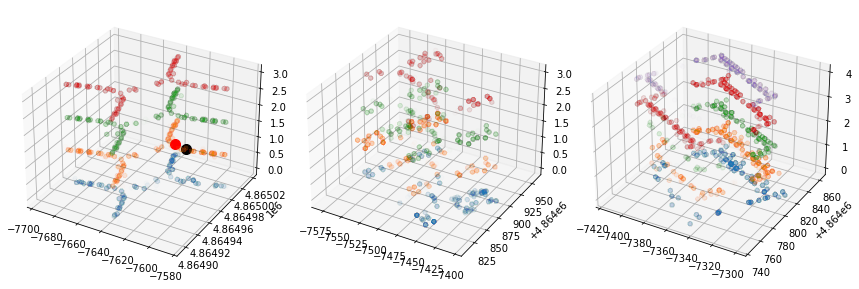

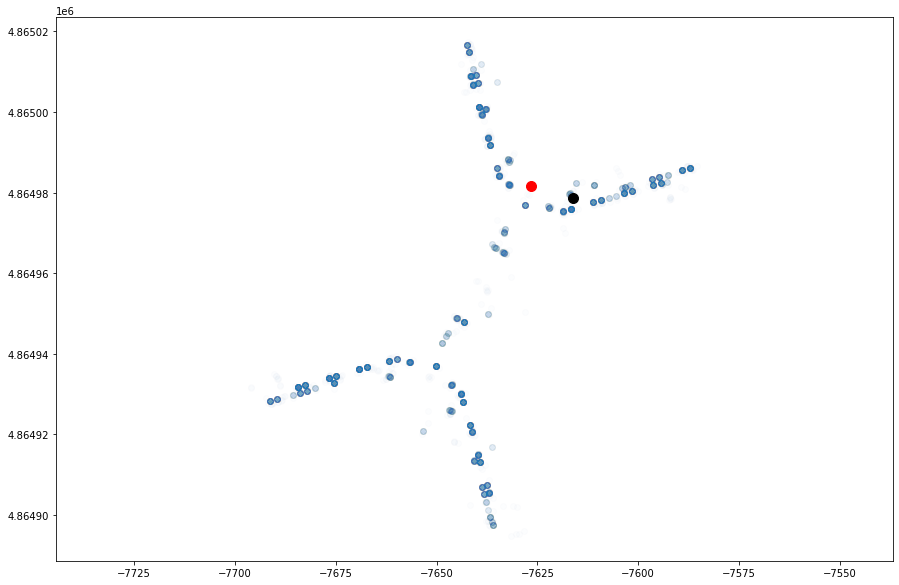

Real point coordinates: lon: -7638.022660439882 lat: 4864903.078029073 floor: 0 building: 0
Predicted point coordinates: lon: -7637.6726893633195 lat: 4864905.173952668 floor: 0 building: 0


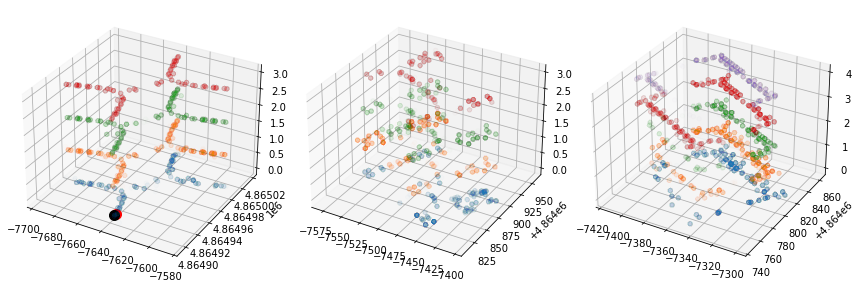

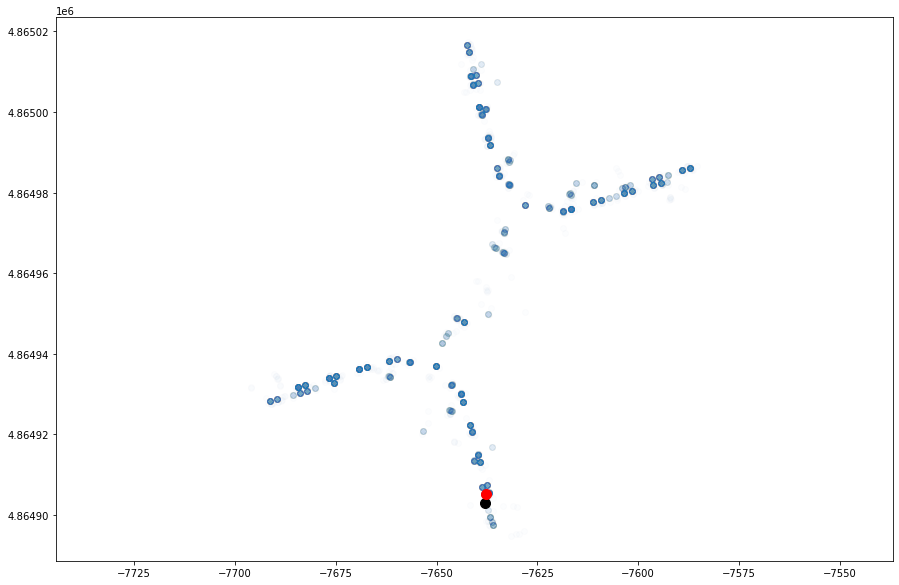

Real point coordinates: lon: -7644.30384668973 lat: 4864948.781008802 floor: 1 building: 0
Predicted point coordinates: lon: -7638.046544662627 lat: 4864947.652550284 floor: 1 building: 0


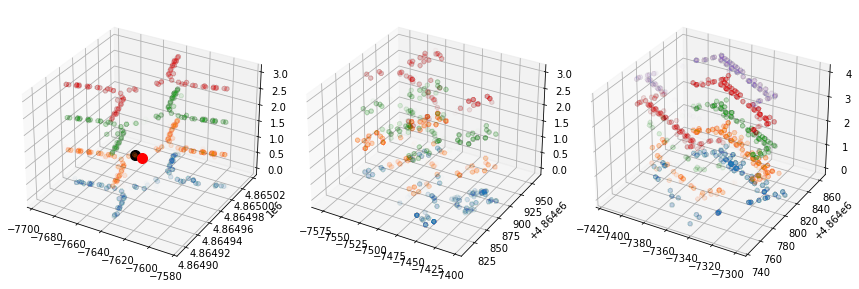

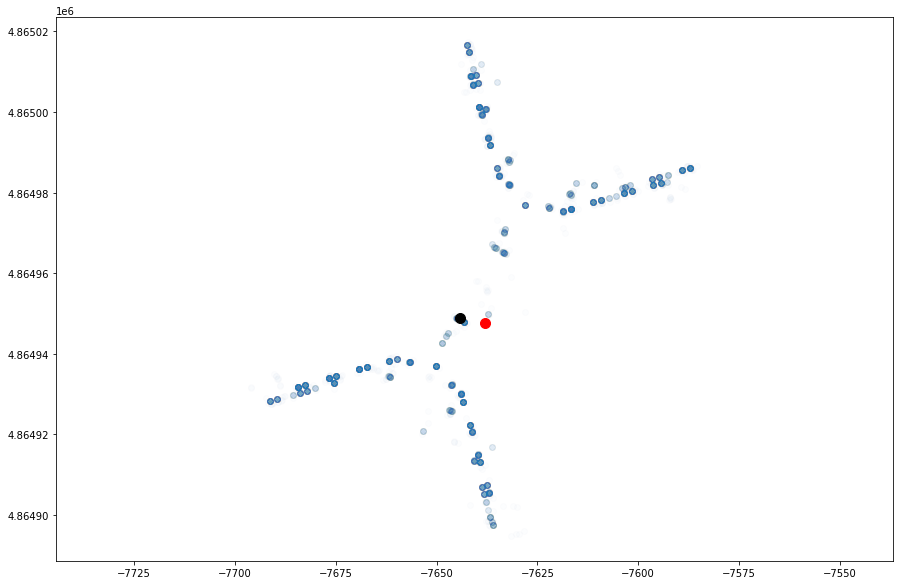

Real point coordinates: lon: -7434.310499999672 lat: 4864861.2802 floor: 1 building: 1
Predicted point coordinates: lon: -7418.933694407694 lat: 4864881.680547499 floor: 1 building: 1


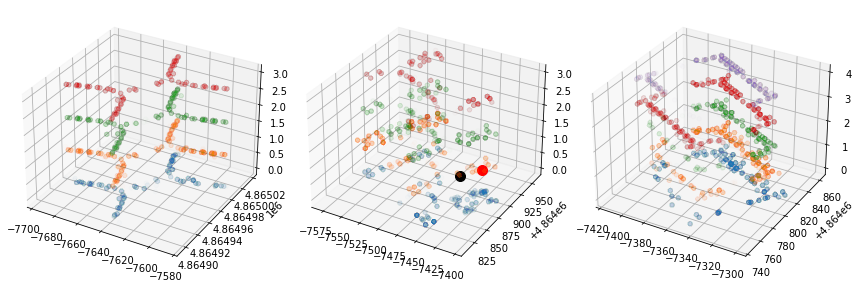

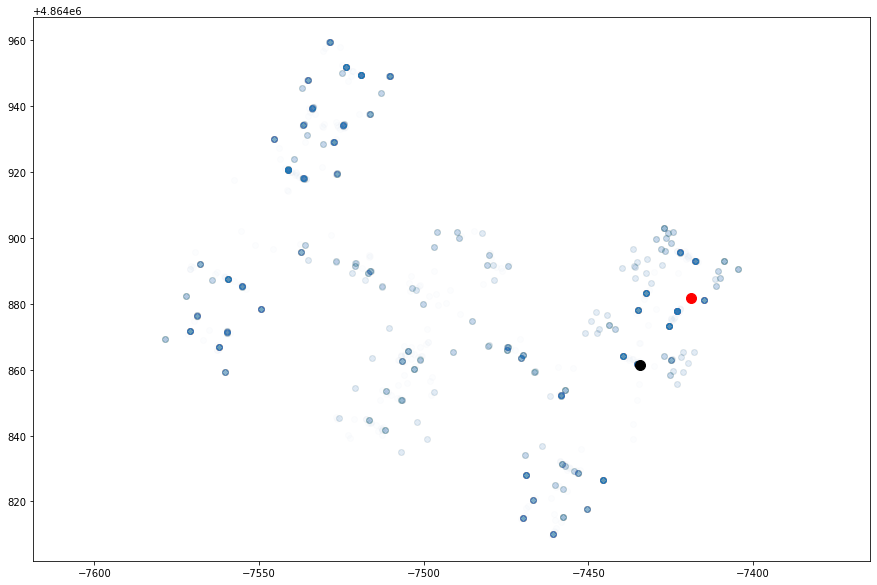

Real point coordinates: lon: -7660.742554721545 lat: 4864935.182176652 floor: 1 building: 0
Predicted point coordinates: lon: -7659.685840553312 lat: 4864935.098467395 floor: 1 building: 0


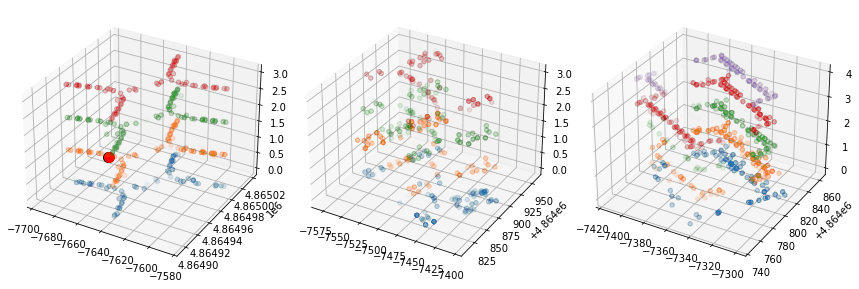

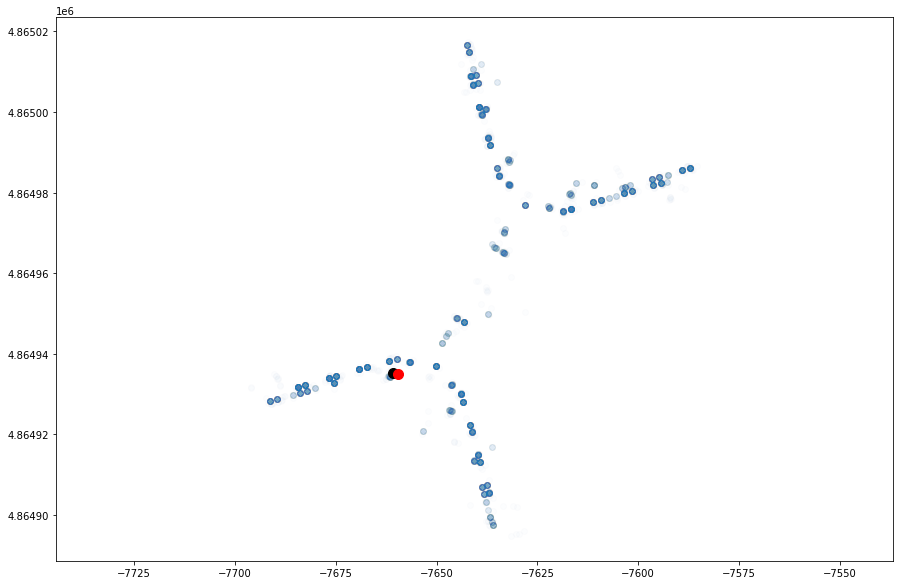

Real point coordinates: lon: -7652.152865217898 lat: 4864925.906269594 floor: 2 building: 0
Predicted point coordinates: lon: -7644.894933820009 lat: 4864926.636502675 floor: 2 building: 0


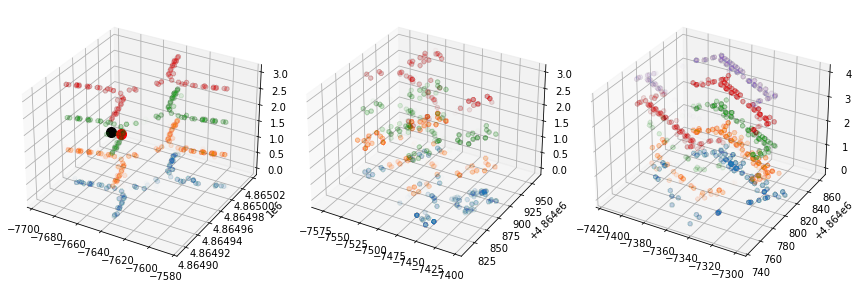

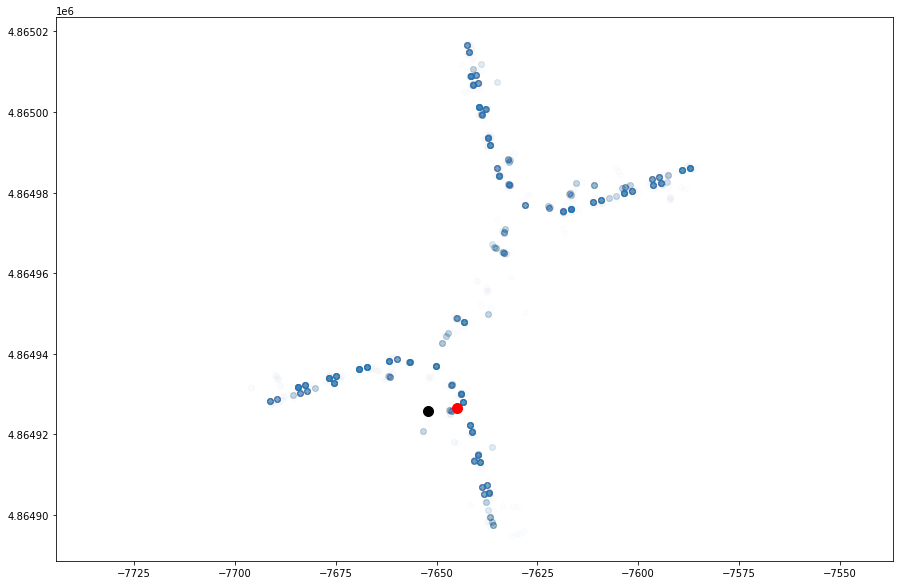

Real point coordinates: lon: -7616.572262020362 lat: 4864979.559708579 floor: 1 building: 0
Predicted point coordinates: lon: -7623.306062713335 lat: 4864980.924491237 floor: 1 building: 0


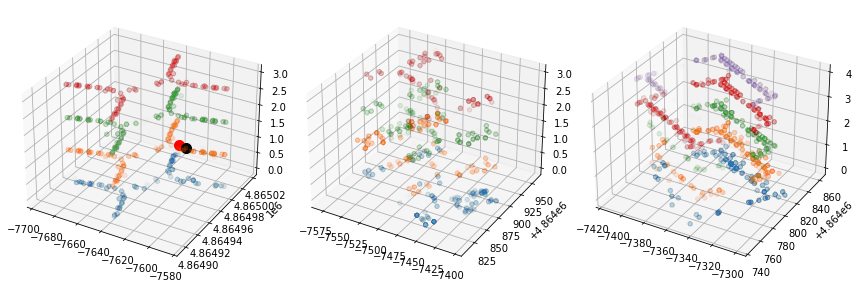

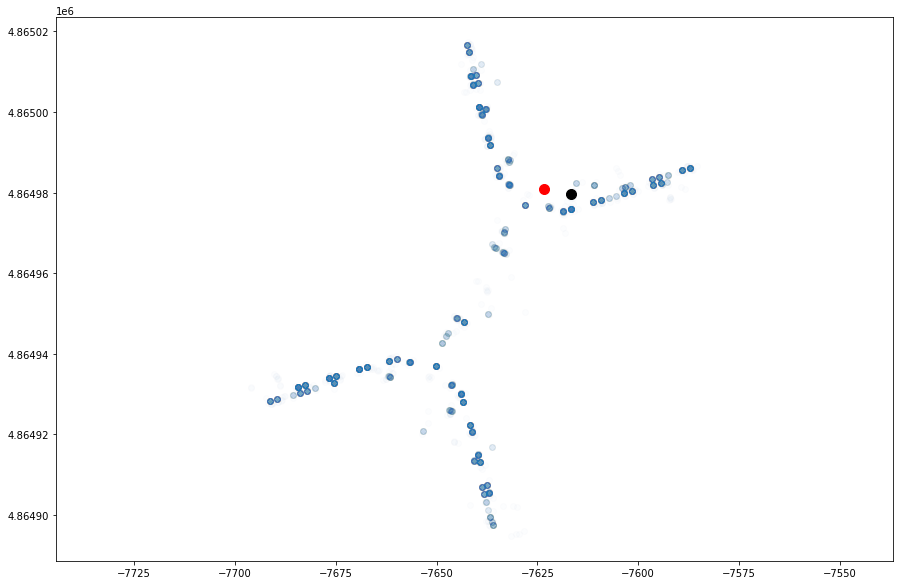

Real point coordinates: lon: -7636.895626662628 lat: 4864905.422739687 floor: 0 building: 0
Predicted point coordinates: lon: -7638.161559802926 lat: 4864910.282773772 floor: 0 building: 0


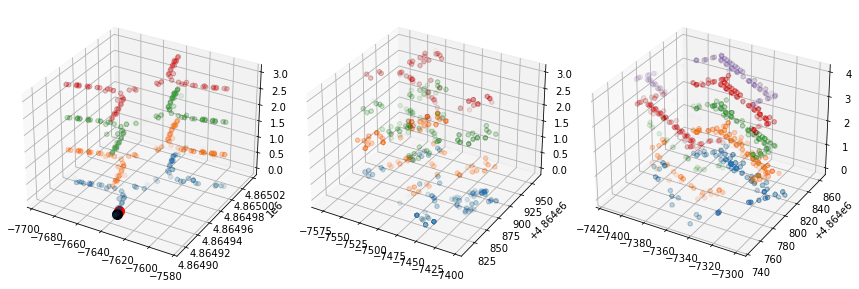

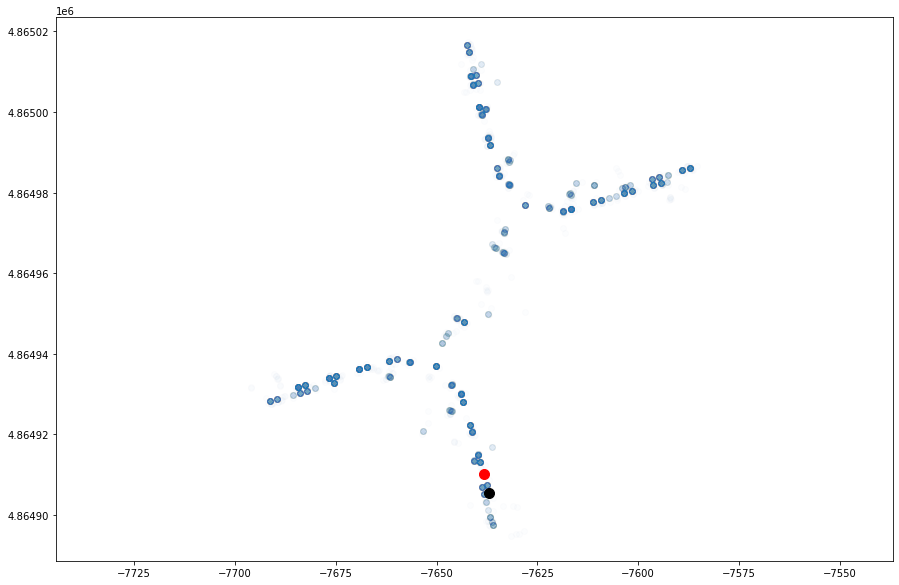

Real point coordinates: lon: -7535.763000000268 lat: 4864917.735200001 floor: 1 building: 1
Predicted point coordinates: lon: -7498.407259147497 lat: 4864923.142663937 floor: 1 building: 1


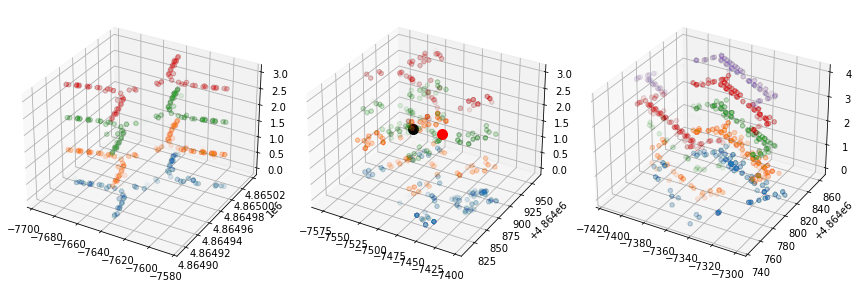

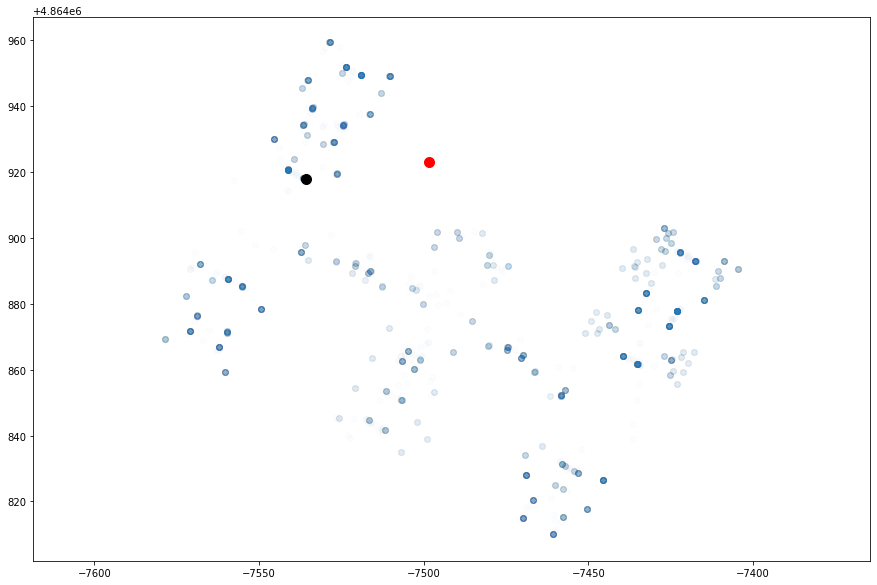

Real point coordinates: lon: -7629.573514667455 lat: 4864895.308918692 floor: 0 building: 0
Predicted point coordinates: lon: -7637.244012705528 lat: 4864902.599030607 floor: 1 building: 0


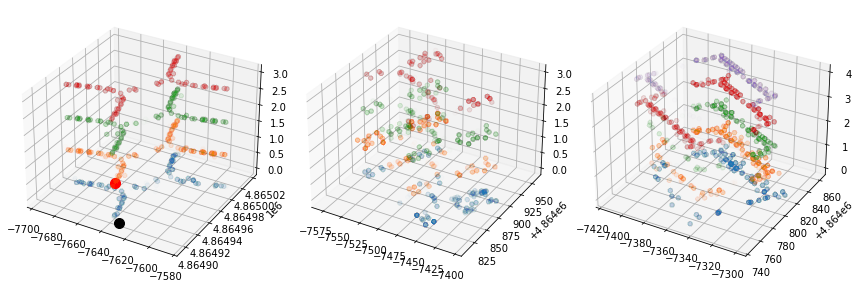

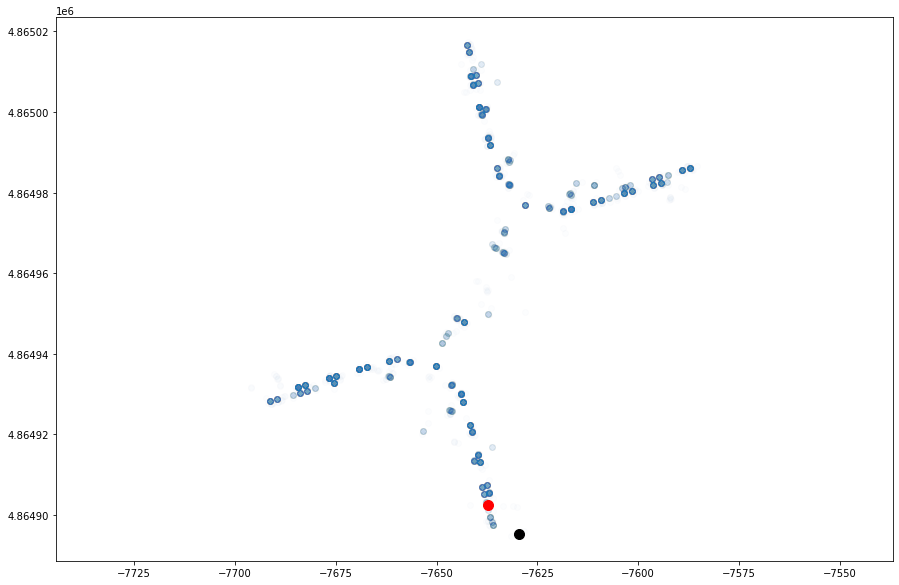

Real point coordinates: lon: -7641.499303368108 lat: 4864922.399177807 floor: 2 building: 0
Predicted point coordinates: lon: -7645.180246411798 lat: 4864920.4267673455 floor: 2 building: 0


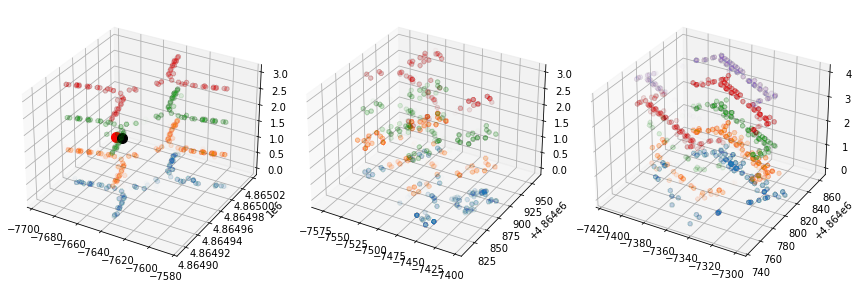

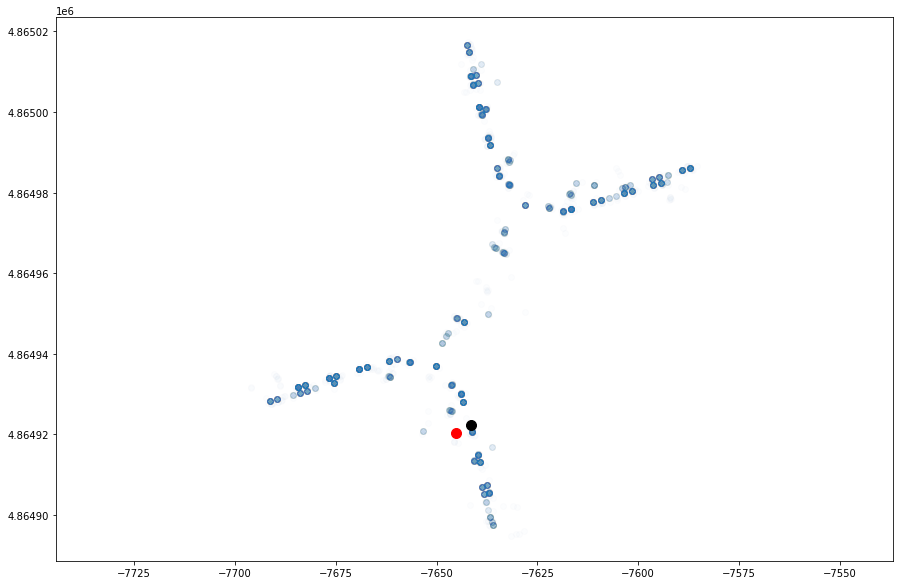

Real point coordinates: lon: -7351.046286474267 lat: 4864833.2908134805 floor: 1 building: 2
Predicted point coordinates: lon: -7351.508928842777 lat: 4864836.200839435 floor: 1 building: 2


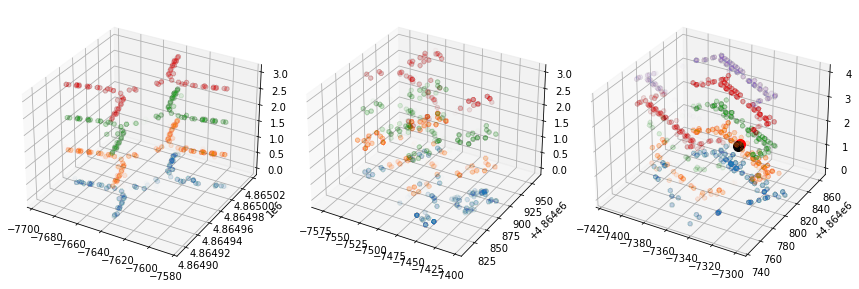

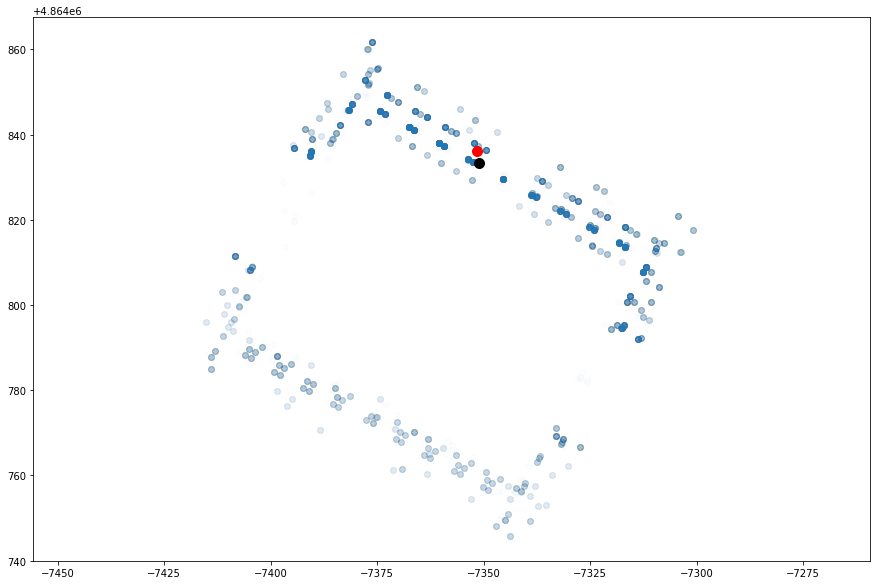

Real point coordinates: lon: -7316.472082156774 lat: 4864800.75959904 floor: 3 building: 2
Predicted point coordinates: lon: -7322.062059562653 lat: 4864810.929095695 floor: 3 building: 2


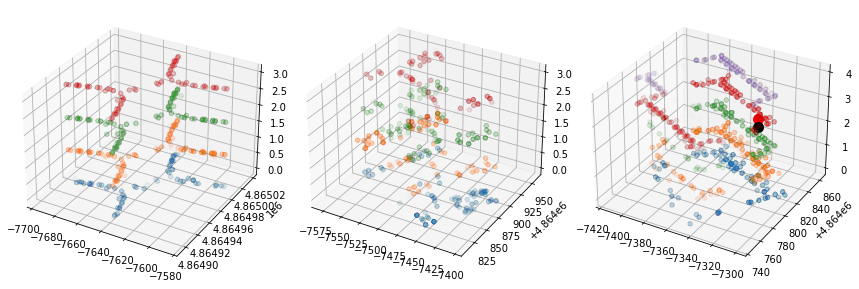

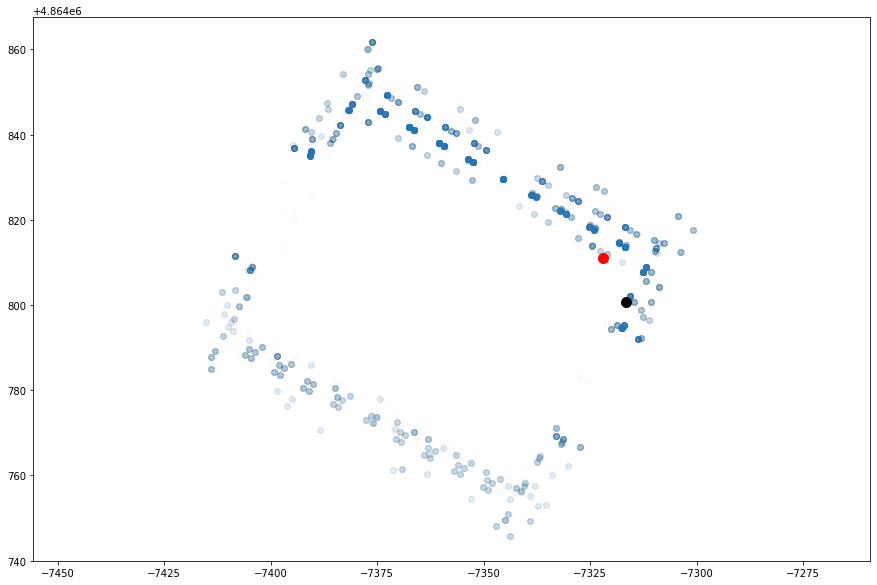

Real point coordinates: lon: -7436.896273802904 lat: 4864863.196136937 floor: 3 building: 1
Predicted point coordinates: lon: -7432.173742915181 lat: 4864870.448038952 floor: 3 building: 1


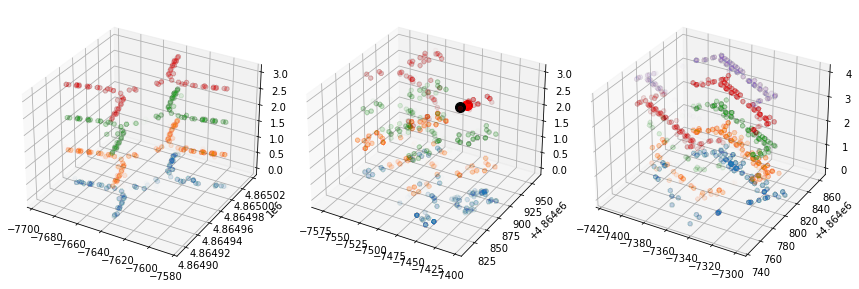

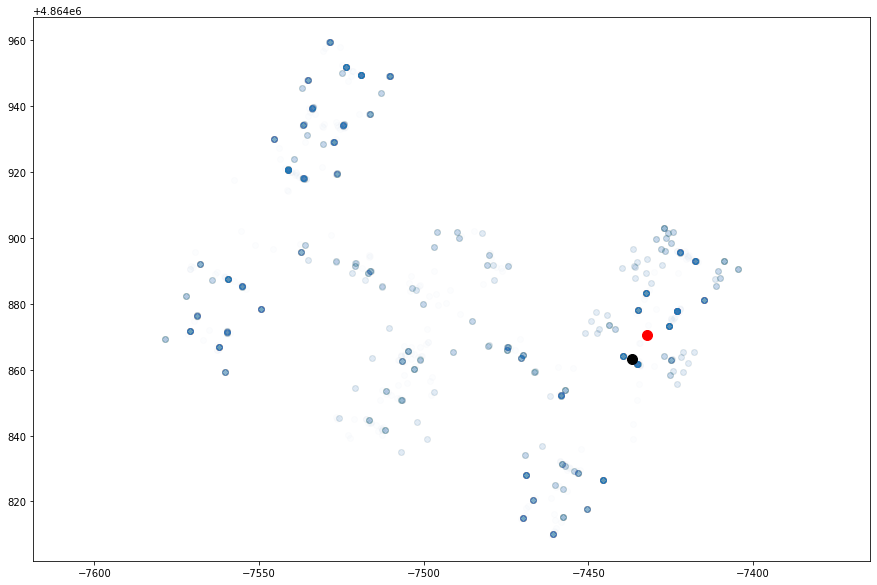

Real point coordinates: lon: -7644.30384668973 lat: 4864948.781008802 floor: 1 building: 0
Predicted point coordinates: lon: -7638.046544662627 lat: 4864947.652550284 floor: 1 building: 0


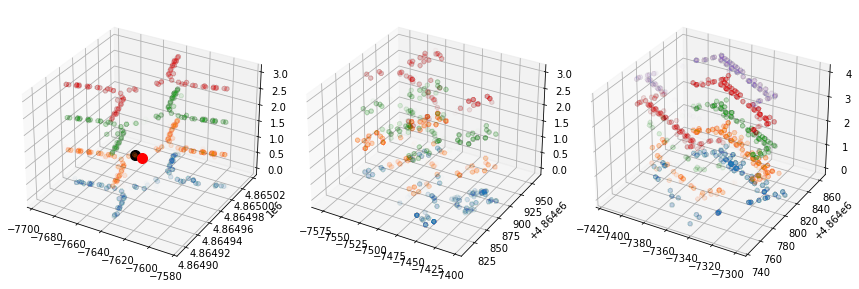

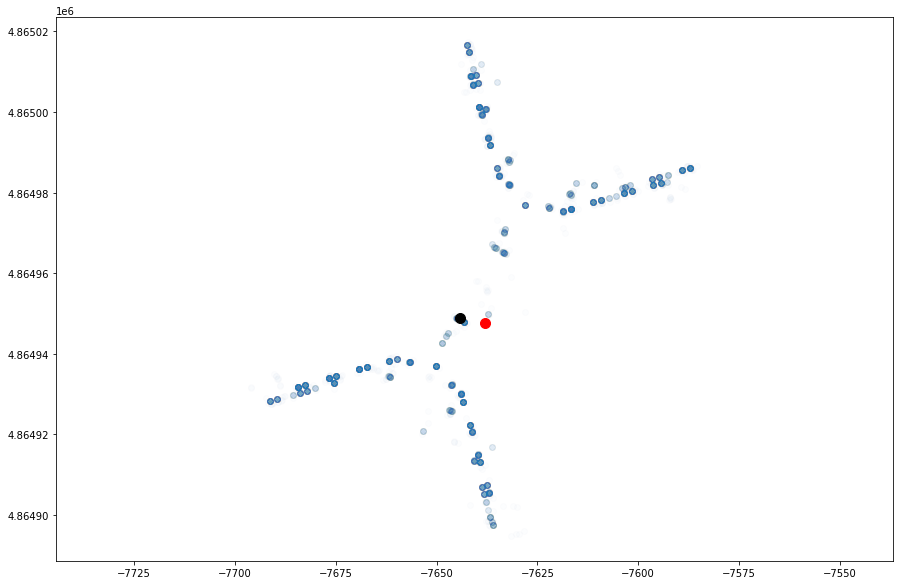

Real point coordinates: lon: -7609.152702315092 lat: 4864978.040423037 floor: 2 building: 0
Predicted point coordinates: lon: -7604.681170992366 lat: 4864981.717065113 floor: 2 building: 0


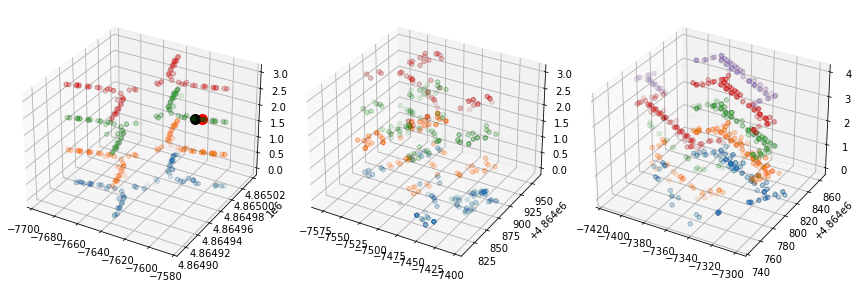

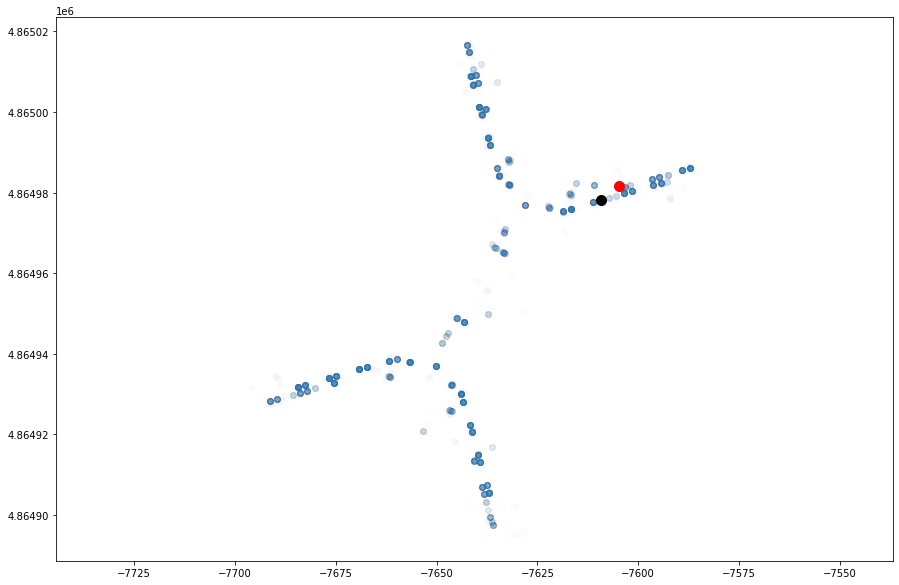

Real point coordinates: lon: -7455.725834169706 lat: 4864830.198260543 floor: 0 building: 1
Predicted point coordinates: lon: -7459.107097920821 lat: 4864827.324165146 floor: 0 building: 1


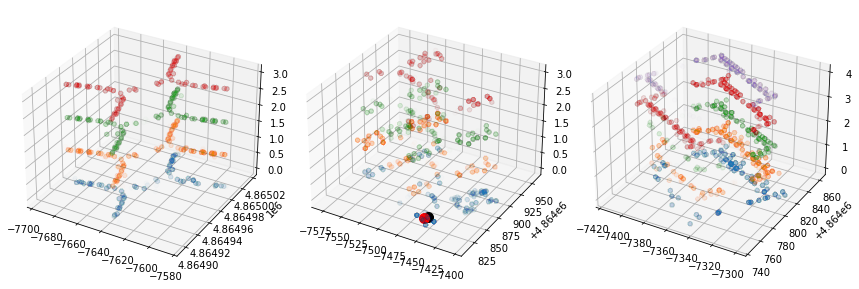

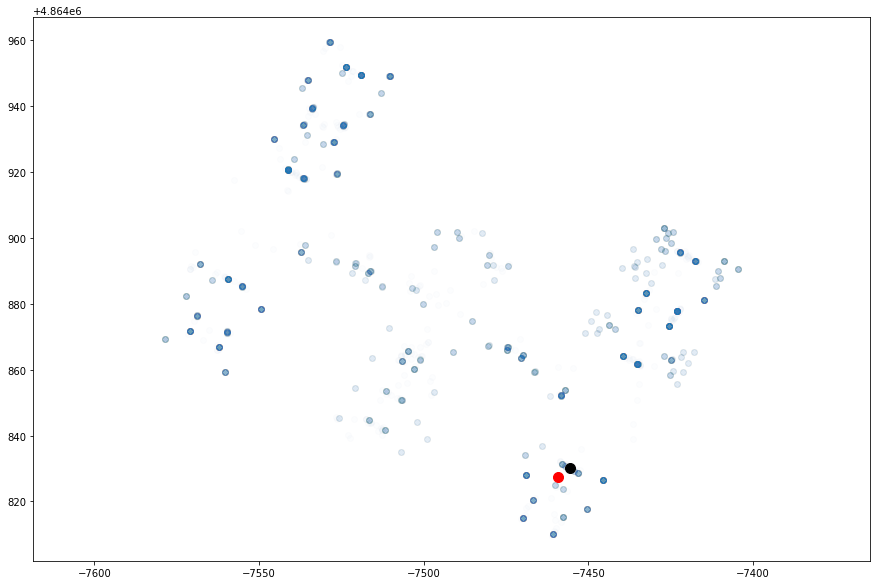

Real point coordinates: lon: -7601.58873392738 lat: 4864980.273296214 floor: 1 building: 0
Predicted point coordinates: lon: -7599.577785798789 lat: 4864981.027470656 floor: 1 building: 0


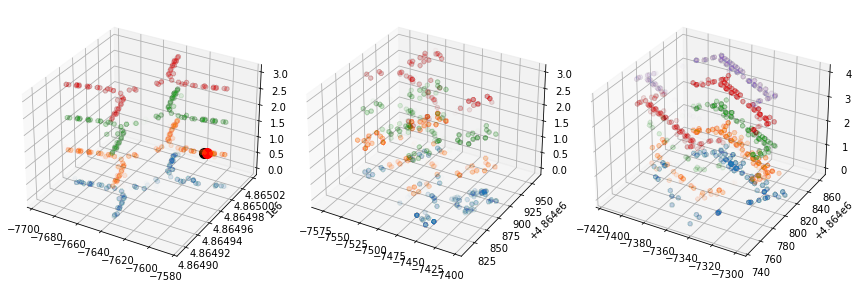

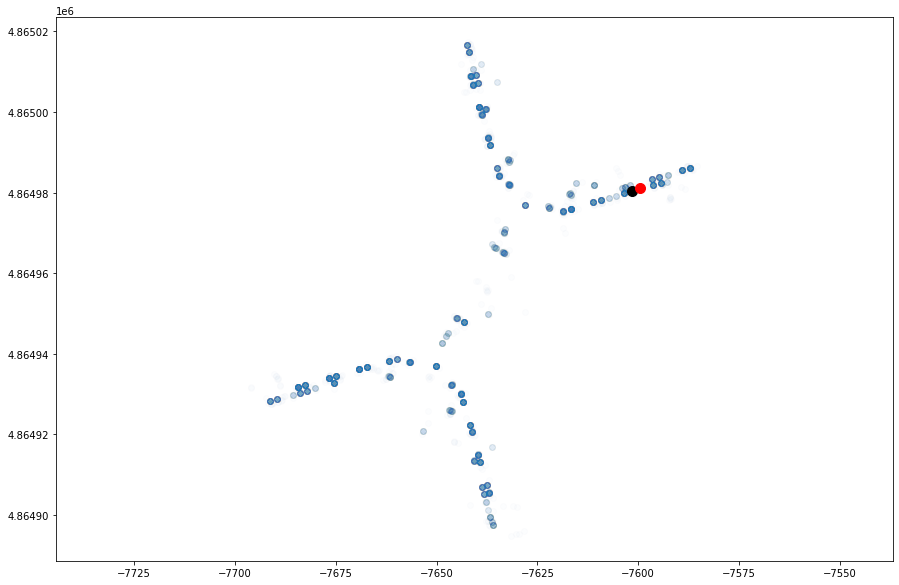

Real point coordinates: lon: -7500.891911364528 lat: 4864864.152655221 floor: 1 building: 1
Predicted point coordinates: lon: -7497.754117793324 lat: 4864851.4932513675 floor: 2 building: 1


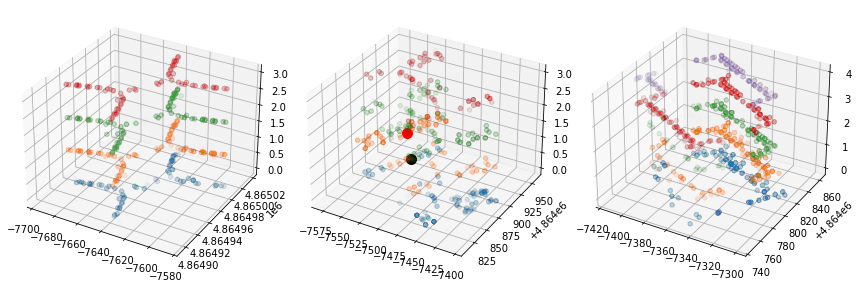

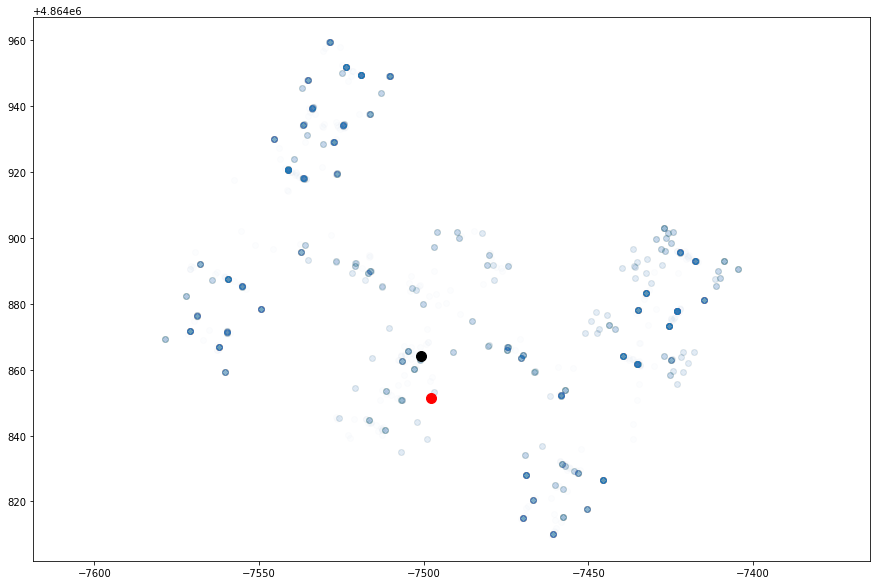

Real point coordinates: lon: -7638.1730634137475 lat: 4864906.766256714 floor: 1 building: 0
Predicted point coordinates: lon: -7639.358998078551 lat: 4864903.624613508 floor: 1 building: 0


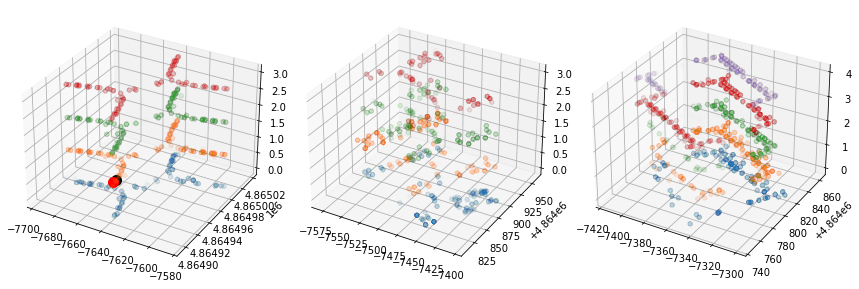

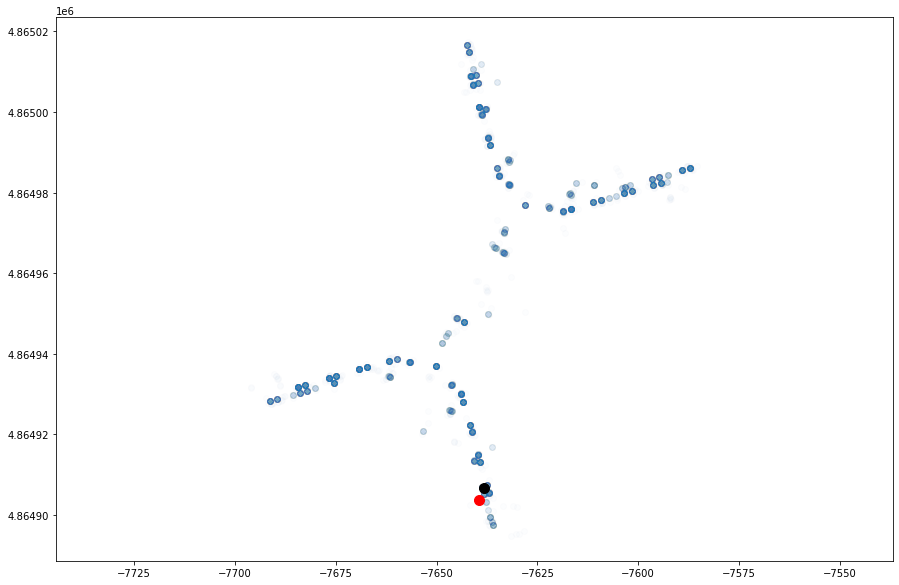

In [44]:
plot_result(clf_model_rfc_alt, 
            clf_model_rfc_bld, 
            reg_model_rfr_lon, 
            reg_model_rfr_lat, 
            test_points, plot_data, X_test, y_test)

## K-Nearest Neighbours

In [45]:
print_scores(clf_model_knc_alt, 
             clf_model_knc_bld, 
             reg_model_knr_lon, 
             reg_model_knr_lat, 
             X_train, y_train, X_test, y_test)

Longitude prediction train r2 score:  0.9970600601357387
Longitude prediction test r2 score:  0.9885695448372361
Latitude prediction train r2 score:  0.9944816291379881
Latitude prediction test r2 score:  0.9756913923430951
Floor prediction train accuracy score:  0.9966895721522797
Floor prediction test accuracy score:  0.8883888388838884
Building prediction train accuracy score:  0.9979936800922907
Building prediction test accuracy score:  0.9972997299729973


Real point coordinates: lon: -7616.20041917674 lat: 4864978.720577933 floor: 1 building: 0
Predicted point coordinates: lon: -7623.357639999687 lat: 4864980.281200001 floor: 1 building: 0


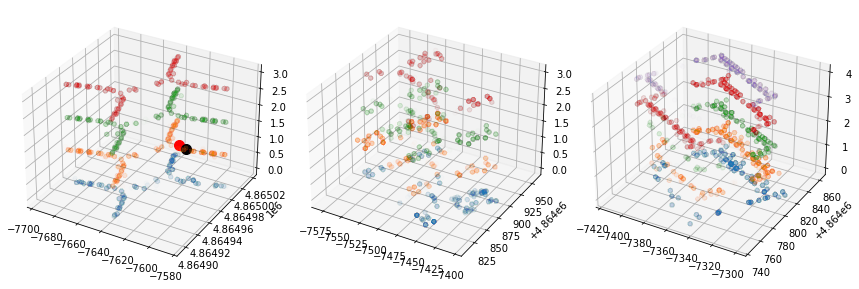

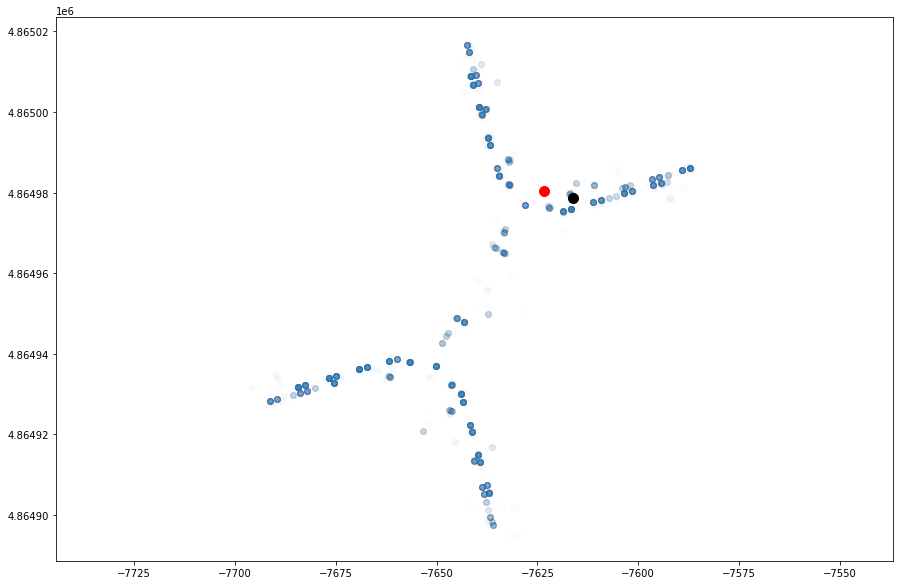

Real point coordinates: lon: -7638.022660439882 lat: 4864903.078029073 floor: 0 building: 0
Predicted point coordinates: lon: -7638.170180000365 lat: 4864905.754479999 floor: 0 building: 0


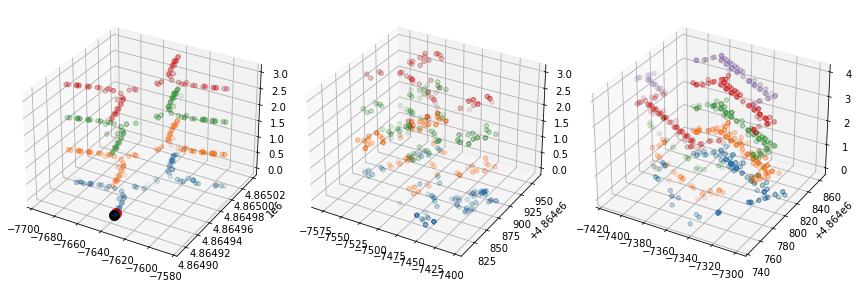

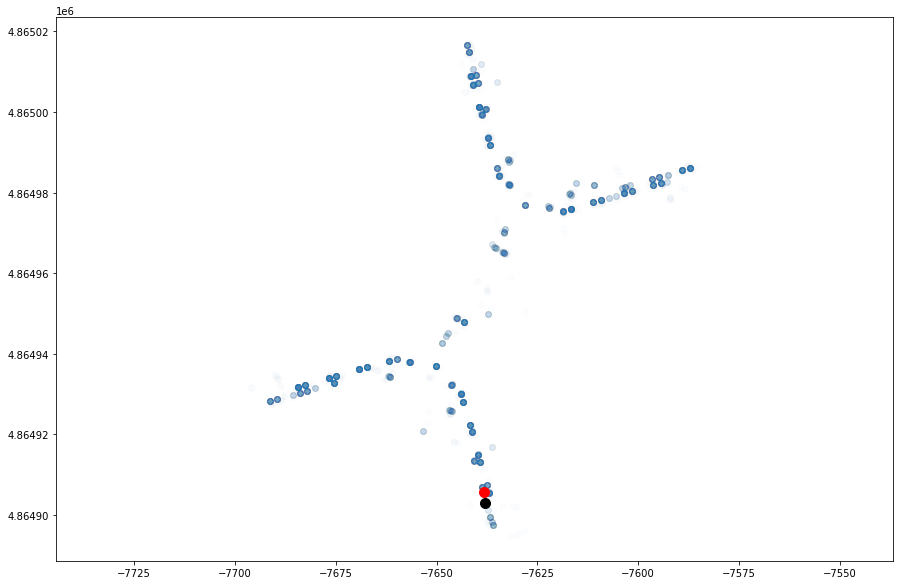

Real point coordinates: lon: -7644.30384668973 lat: 4864948.781008802 floor: 1 building: 0
Predicted point coordinates: lon: -7644.652000001073 lat: 4864948.697159998 floor: 1 building: 0


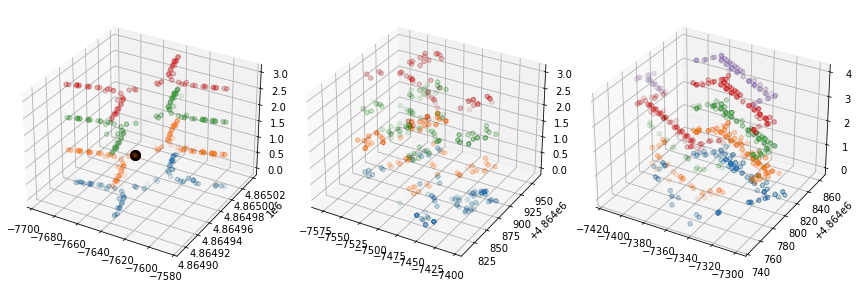

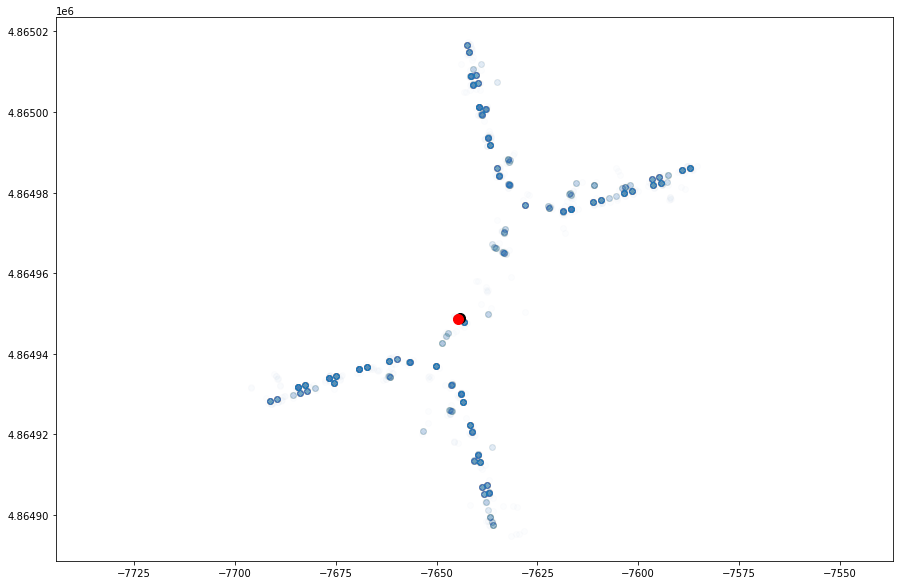

Real point coordinates: lon: -7434.310499999672 lat: 4864861.2802 floor: 1 building: 1
Predicted point coordinates: lon: -7415.434012822807 lat: 4864883.6265285285 floor: 1 building: 1


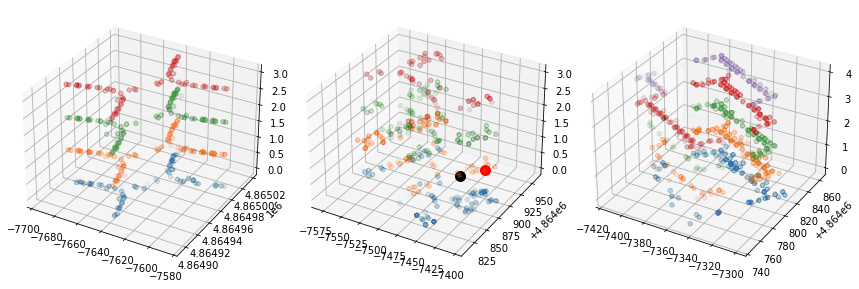

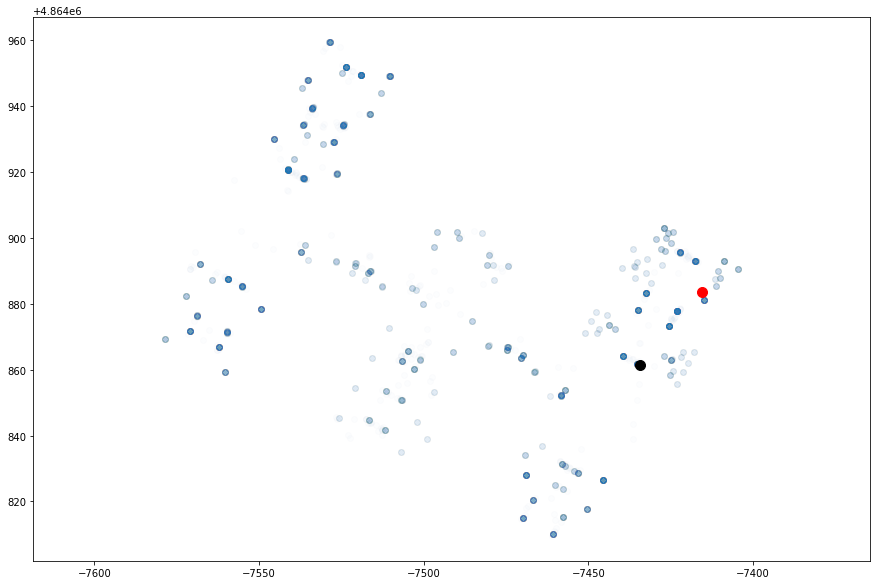

Real point coordinates: lon: -7660.742554721545 lat: 4864935.182176652 floor: 1 building: 0
Predicted point coordinates: lon: -7666.8509800001975 lat: 4864936.18124 floor: 1 building: 0


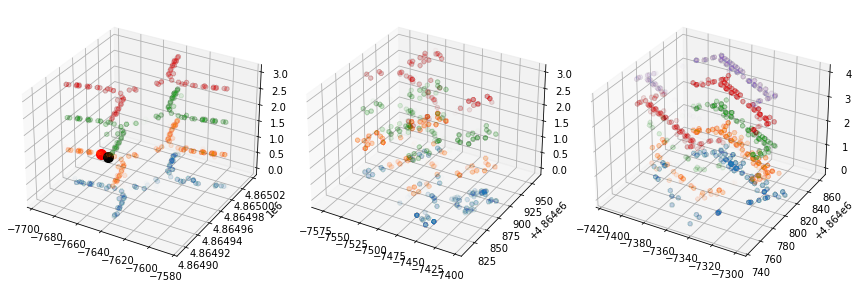

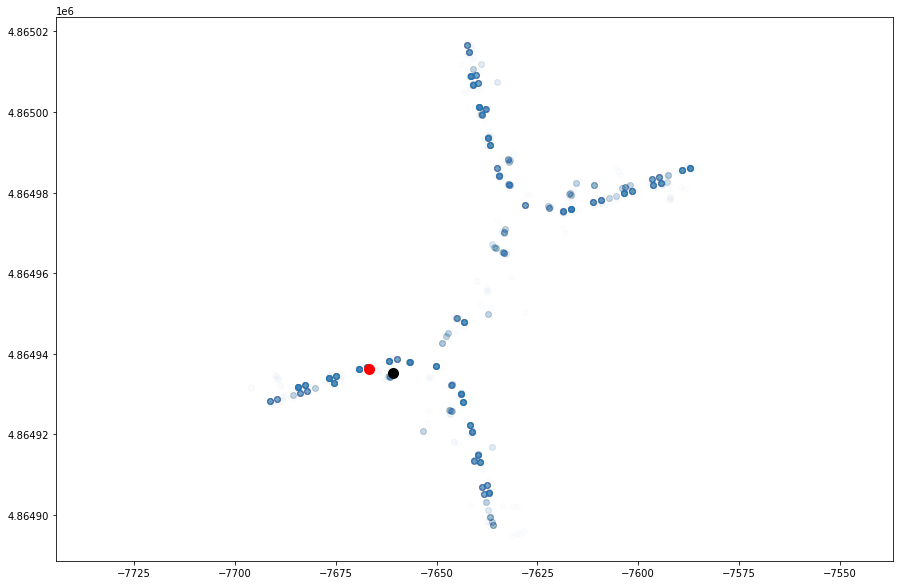

Real point coordinates: lon: -7652.152865217898 lat: 4864925.906269594 floor: 2 building: 0
Predicted point coordinates: lon: -7649.61994086653 lat: 4864924.604670895 floor: 2 building: 0


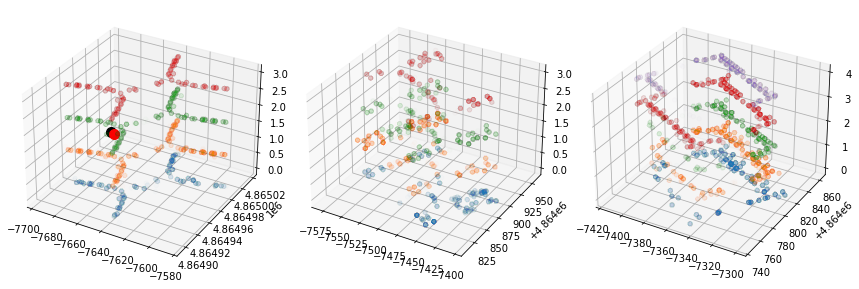

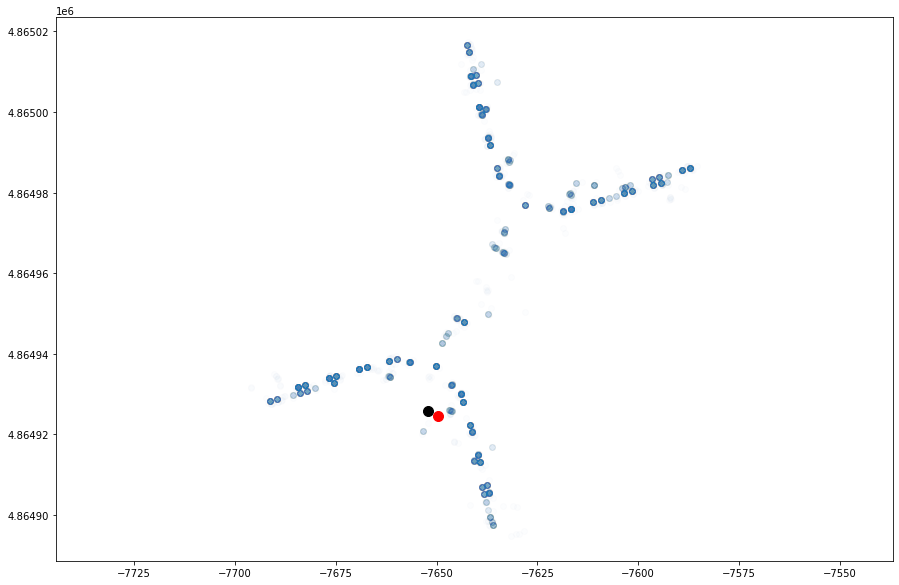

Real point coordinates: lon: -7616.572262020362 lat: 4864979.559708579 floor: 1 building: 0
Predicted point coordinates: lon: -7619.795340000093 lat: 4864978.62298 floor: 1 building: 0


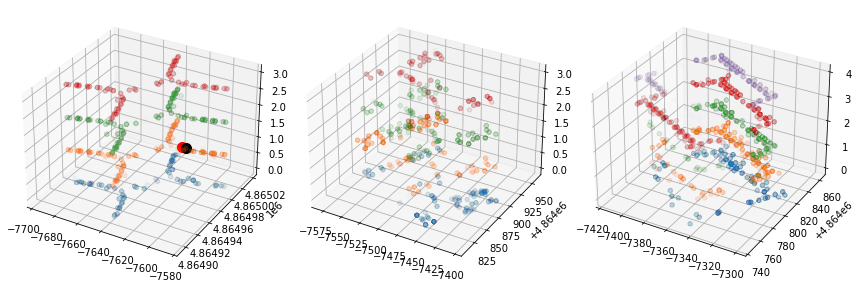

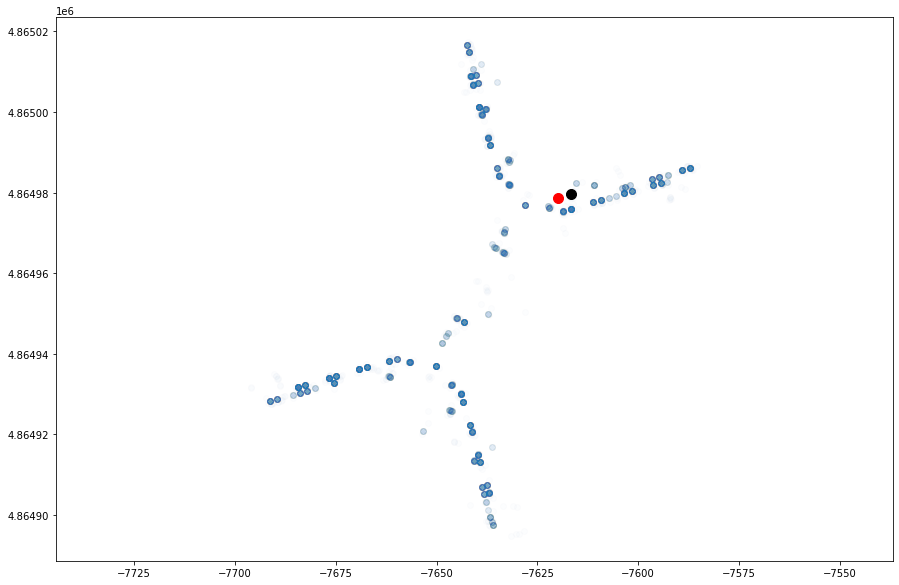

Real point coordinates: lon: -7636.895626662628 lat: 4864905.422739687 floor: 0 building: 0
Predicted point coordinates: lon: -7637.575160000473 lat: 4864903.678659998 floor: 0 building: 0


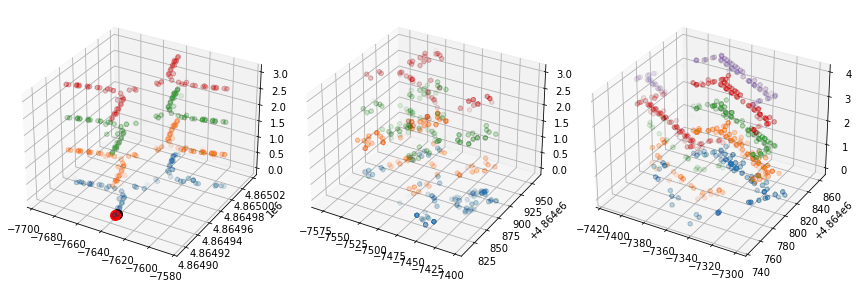

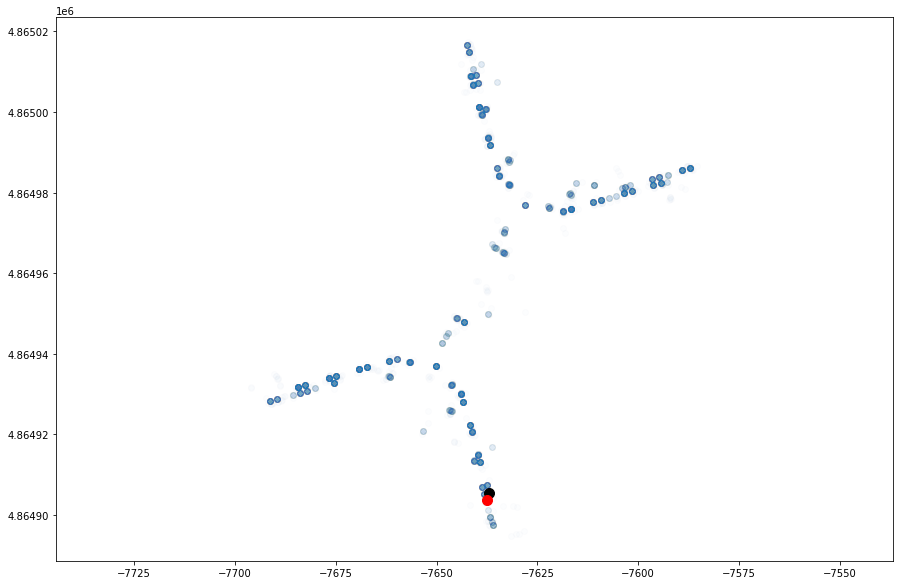

Real point coordinates: lon: -7535.763000000268 lat: 4864917.735200001 floor: 1 building: 1
Predicted point coordinates: lon: -7533.120063080639 lat: 4864938.347282362 floor: 1 building: 1


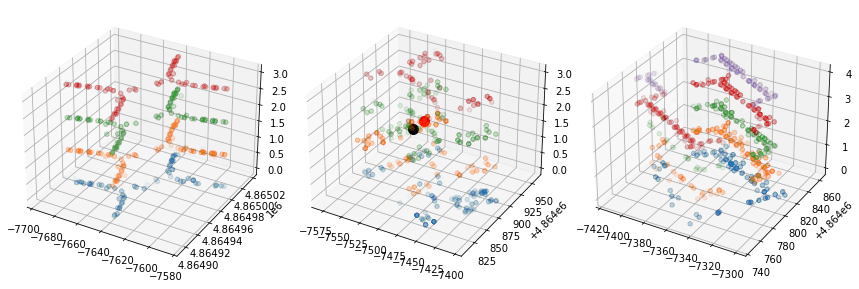

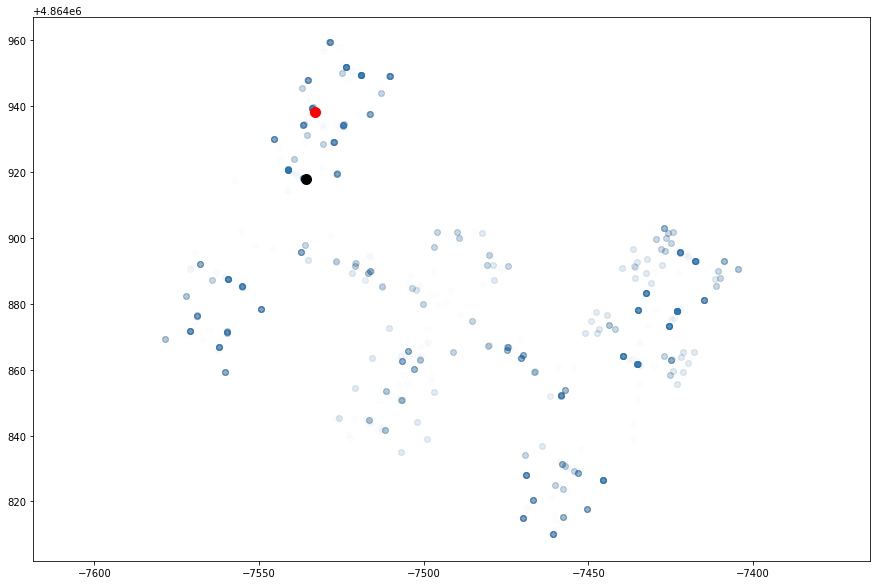

Real point coordinates: lon: -7629.573514667455 lat: 4864895.308918692 floor: 0 building: 0
Predicted point coordinates: lon: -7636.30656664446 lat: 4864901.992401903 floor: 1 building: 0


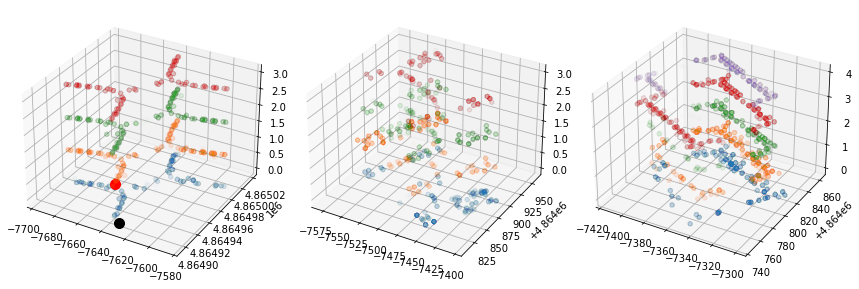

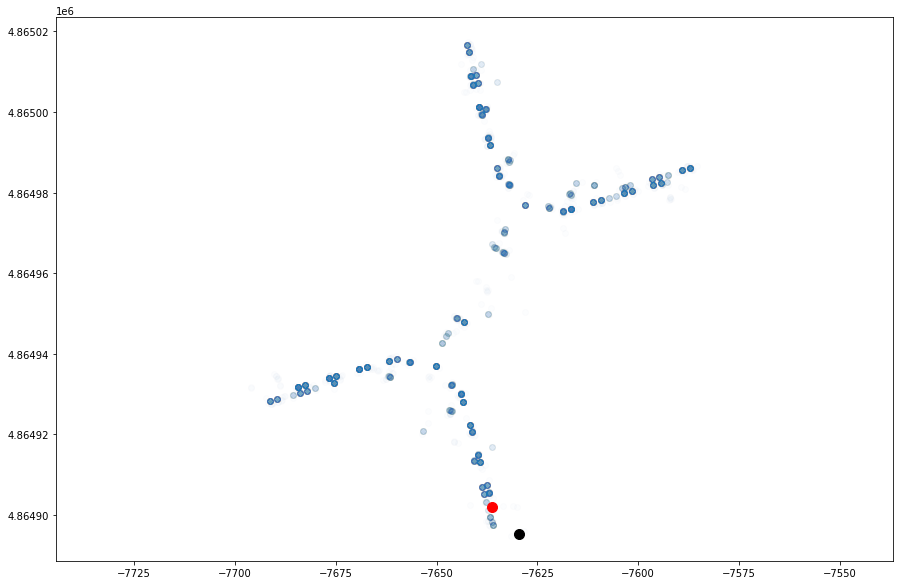

Real point coordinates: lon: -7641.499303368108 lat: 4864922.399177807 floor: 2 building: 0
Predicted point coordinates: lon: -7649.529200866818 lat: 4864923.1735708965 floor: 2 building: 0


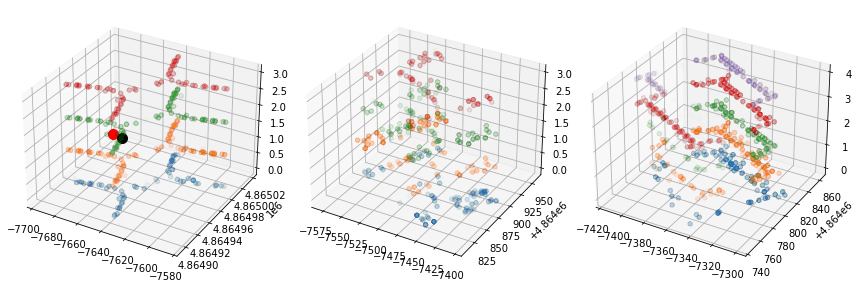

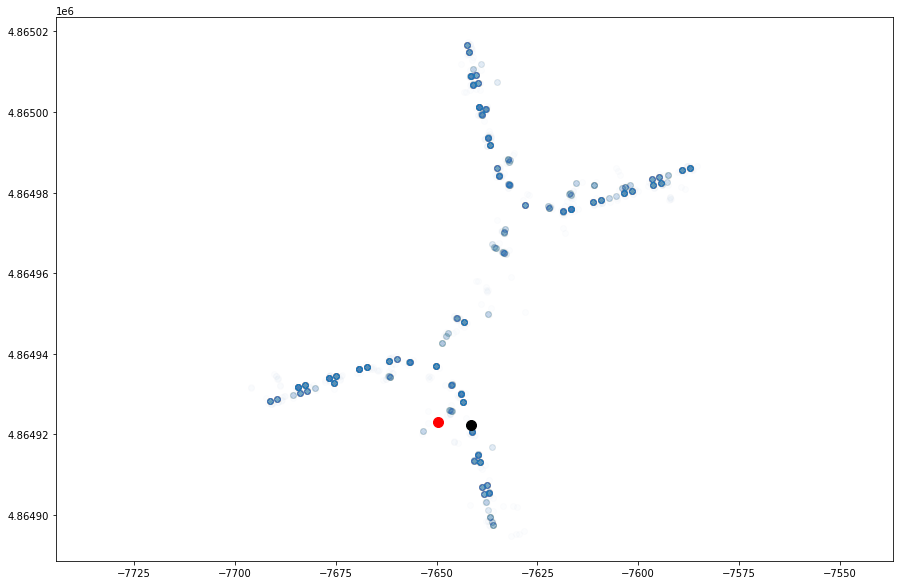

Real point coordinates: lon: -7351.046286474267 lat: 4864833.2908134805 floor: 1 building: 2
Predicted point coordinates: lon: -7354.742024994642 lat: 4864837.504408432 floor: 1 building: 2


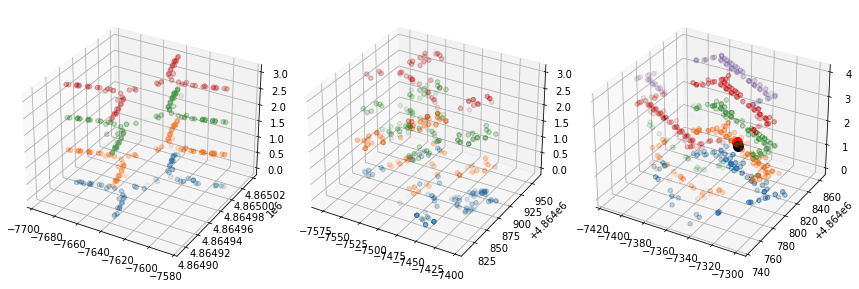

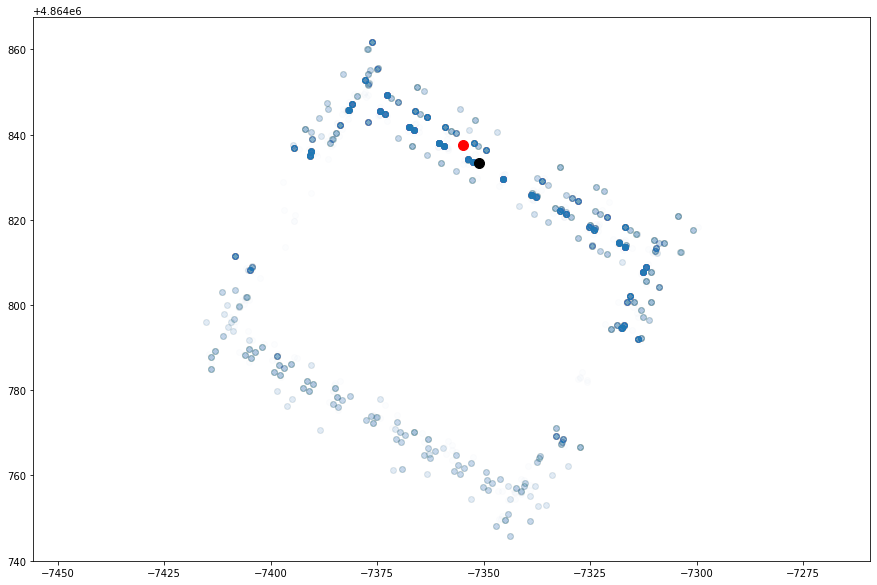

Real point coordinates: lon: -7316.472082156774 lat: 4864800.75959904 floor: 3 building: 2
Predicted point coordinates: lon: -7322.7994599998 lat: 4864814.891459999 floor: 4 building: 2


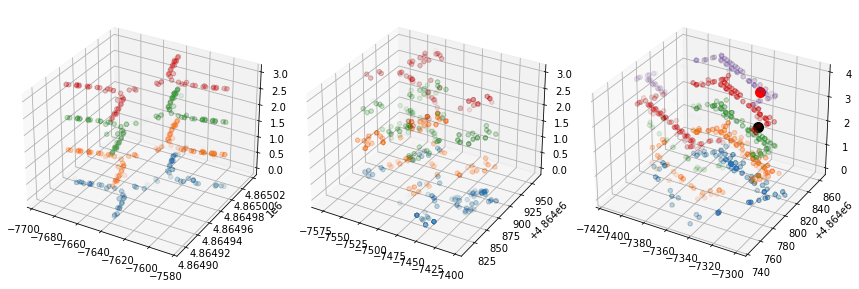

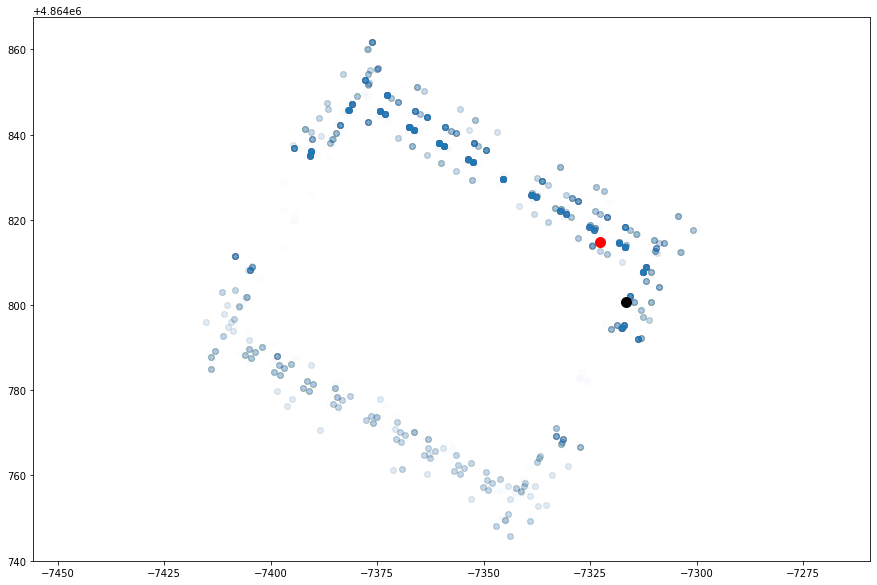

Real point coordinates: lon: -7436.896273802904 lat: 4864863.196136937 floor: 3 building: 1
Predicted point coordinates: lon: -7435.134940000624 lat: 4864868.301840002 floor: 3 building: 1


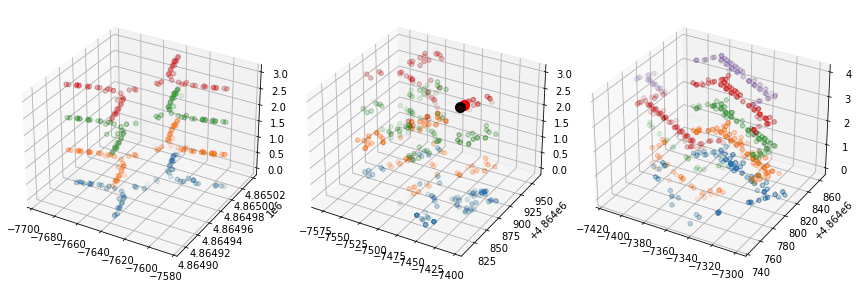

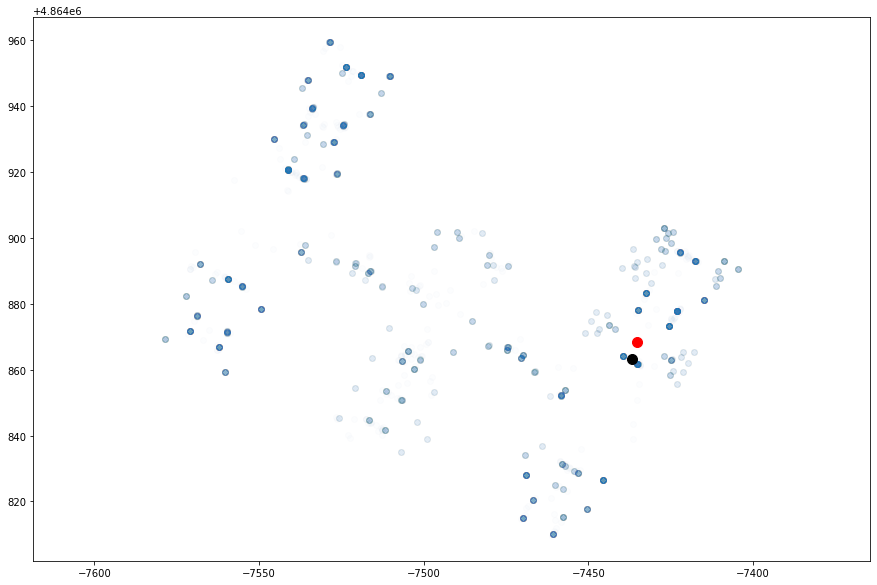

Real point coordinates: lon: -7644.30384668973 lat: 4864948.781008802 floor: 1 building: 0
Predicted point coordinates: lon: -7644.652000001073 lat: 4864948.697159998 floor: 1 building: 0


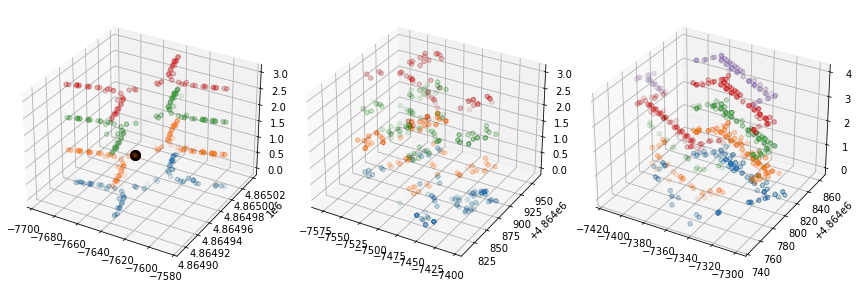

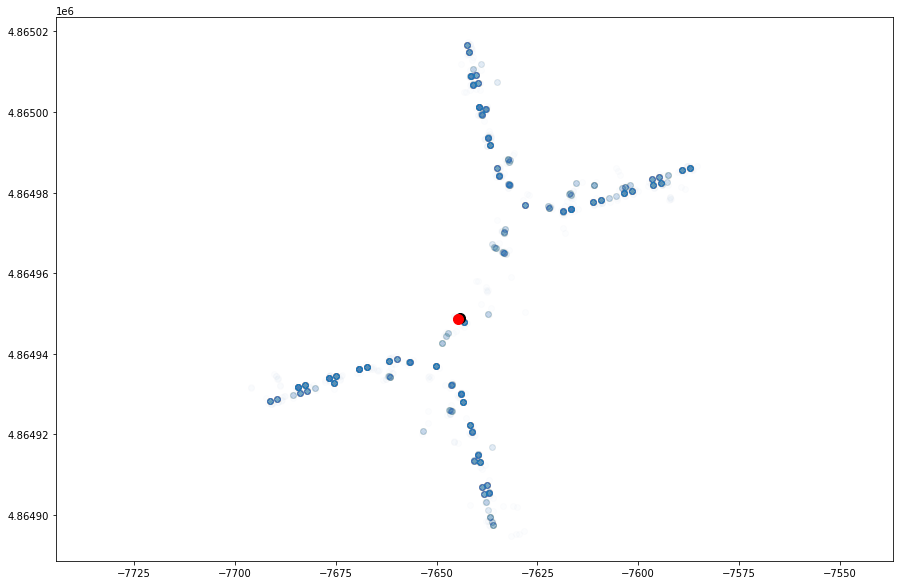

Real point coordinates: lon: -7609.152702315092 lat: 4864978.040423037 floor: 2 building: 0
Predicted point coordinates: lon: -7604.0951200000945 lat: 4864980.271039998 floor: 2 building: 0


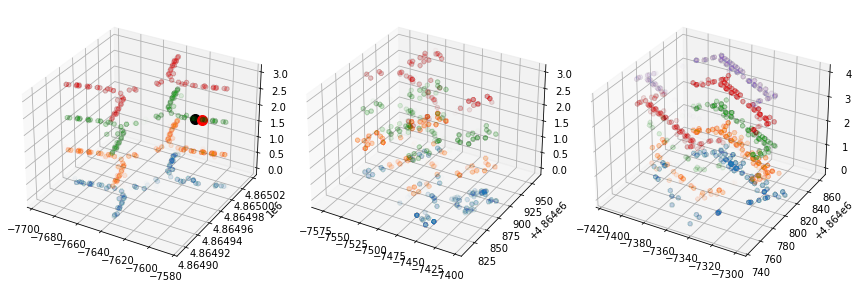

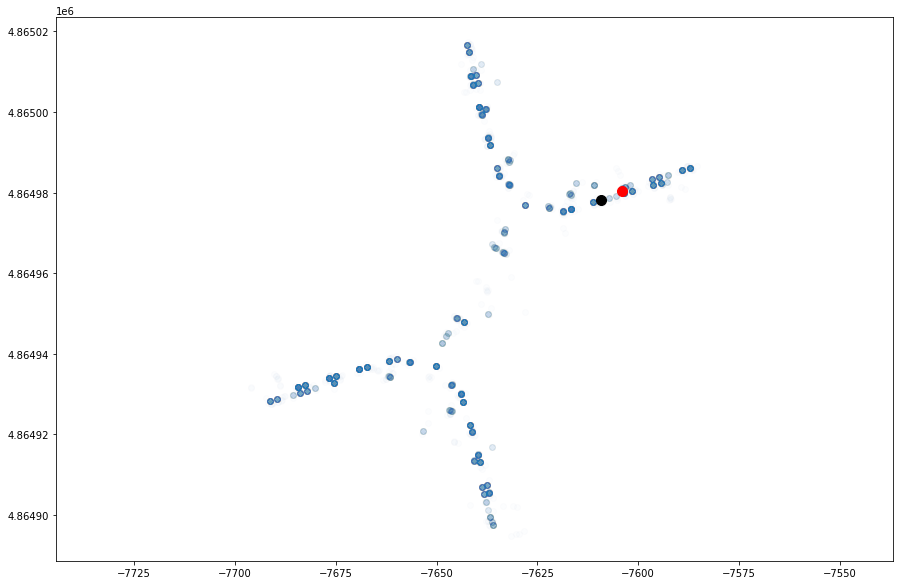

Real point coordinates: lon: -7455.725834169706 lat: 4864830.198260543 floor: 0 building: 1
Predicted point coordinates: lon: -7457.552699999511 lat: 4864847.572960001 floor: 0 building: 1


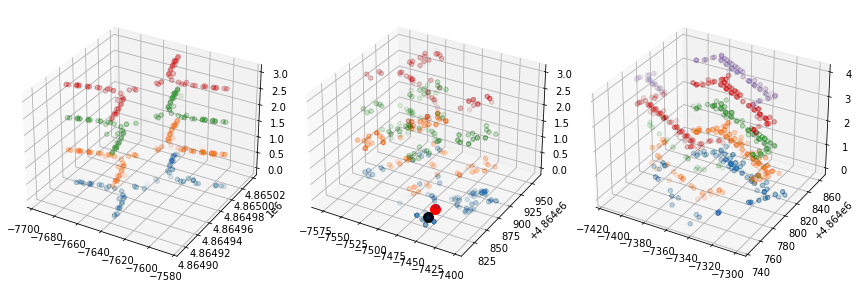

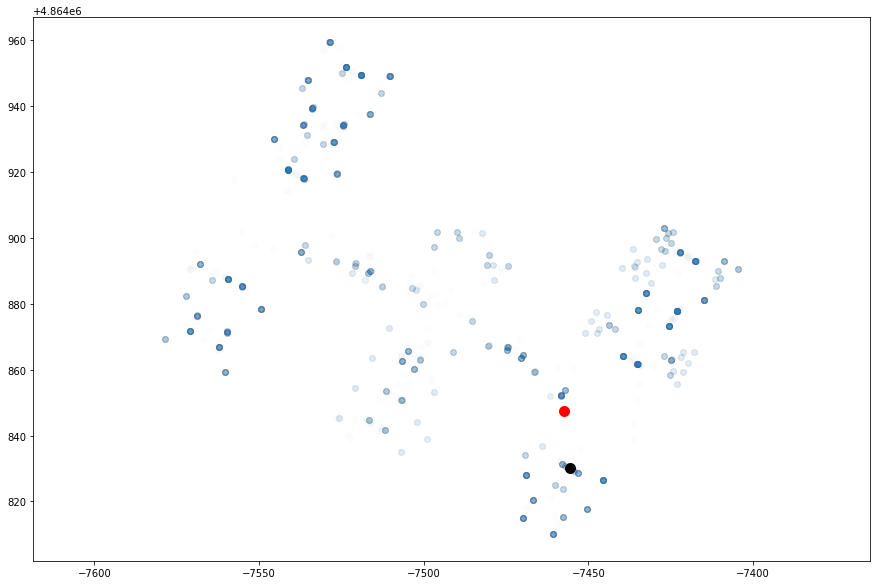

Real point coordinates: lon: -7601.58873392738 lat: 4864980.273296214 floor: 1 building: 0
Predicted point coordinates: lon: -7596.177259999514 lat: 4864983.17334 floor: 1 building: 0


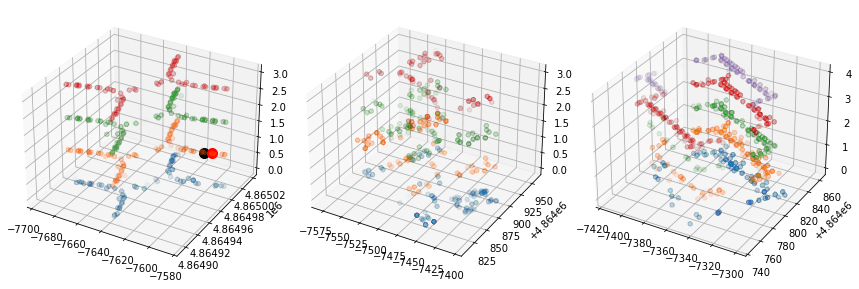

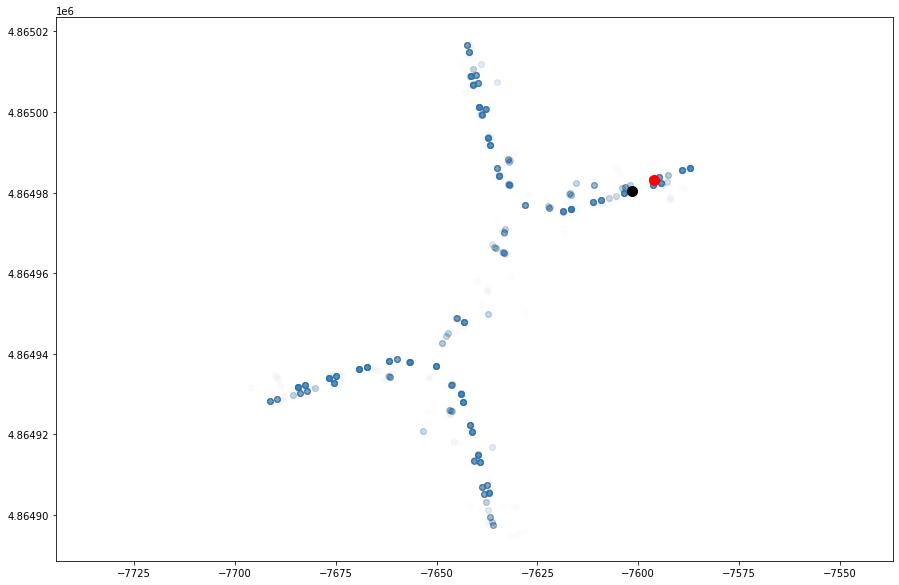

Real point coordinates: lon: -7500.891911364528 lat: 4864864.152655221 floor: 1 building: 1
Predicted point coordinates: lon: -7505.499760000408 lat: 4864860.29934 floor: 2 building: 1


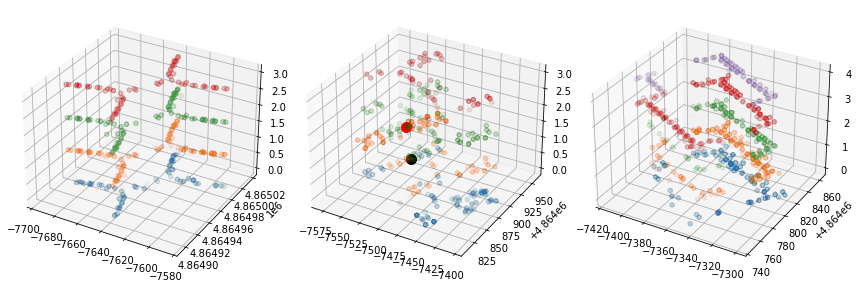

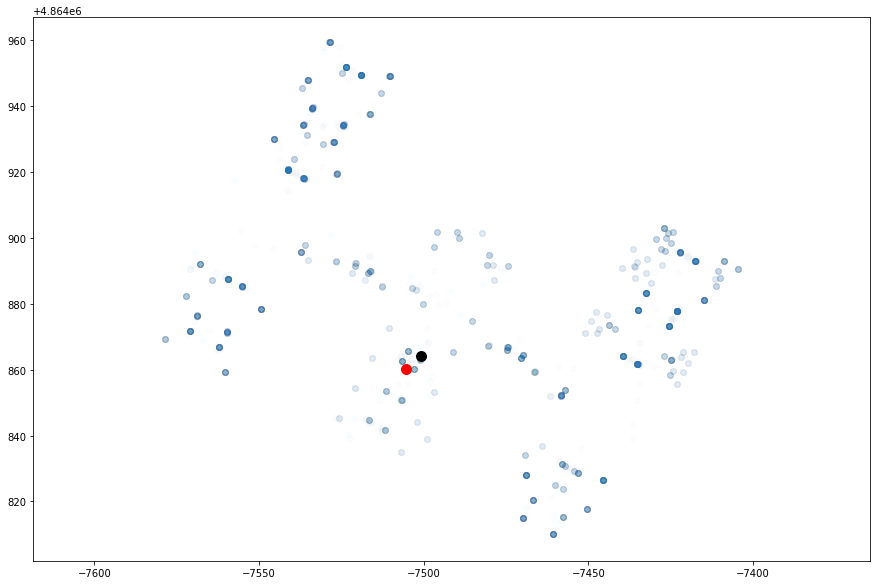

Real point coordinates: lon: -7638.1730634137475 lat: 4864906.766256714 floor: 1 building: 0
Predicted point coordinates: lon: -7638.443379999697 lat: 4864909.602260001 floor: 1 building: 0


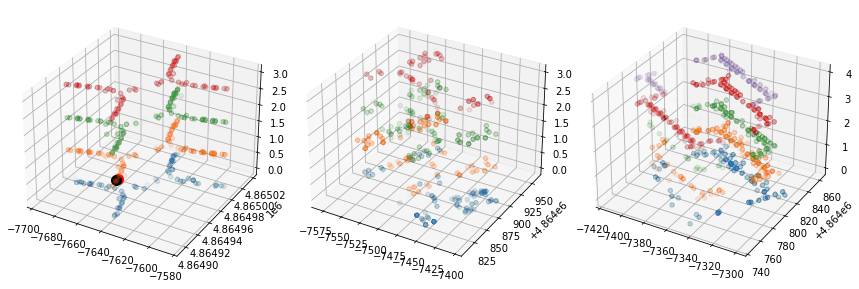

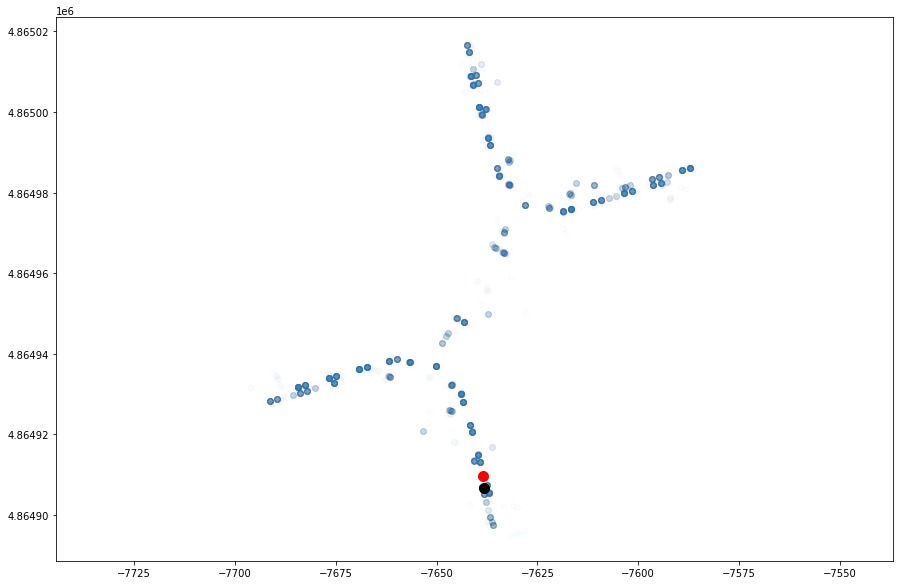

In [46]:
plot_result(clf_model_knc_alt, 
            clf_model_knc_bld, 
            reg_model_knr_lon, 
            reg_model_knr_lat, 
            test_points, plot_data, X_test, y_test)

## Support Vector Machine

In [47]:
print_scores(clf_model_svc_alt, 
             clf_model_svc_bld, 
             reg_model_svr_lon, 
             reg_model_svr_lat, 
             X_train, y_train, X_test, y_test)

Longitude prediction train r2 score:  0.9904752188512544
Longitude prediction test r2 score:  0.9717105162529168
Latitude prediction train r2 score:  0.9865602074032322
Latitude prediction test r2 score:  0.9657045820888391
Floor prediction train accuracy score:  0.9974921001153634
Floor prediction test accuracy score:  0.9027902790279028
Building prediction train accuracy score:  0.9980438380899834
Building prediction test accuracy score:  0.9990999099909991


Real point coordinates: lon: -7616.20041917674 lat: 4864978.720577933 floor: 1 building: 0
Predicted point coordinates: lon: -7611.38573362804 lat: 4864981.614727296 floor: 1 building: 0


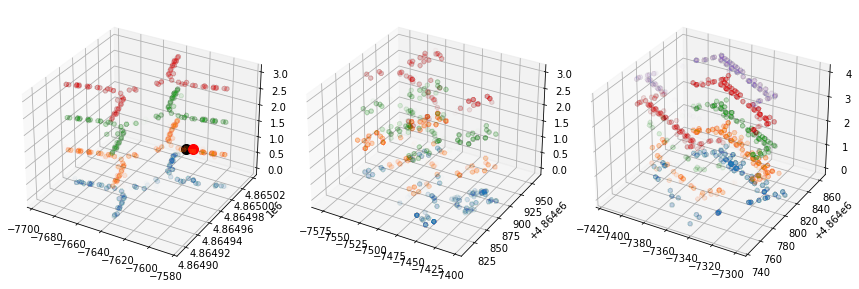

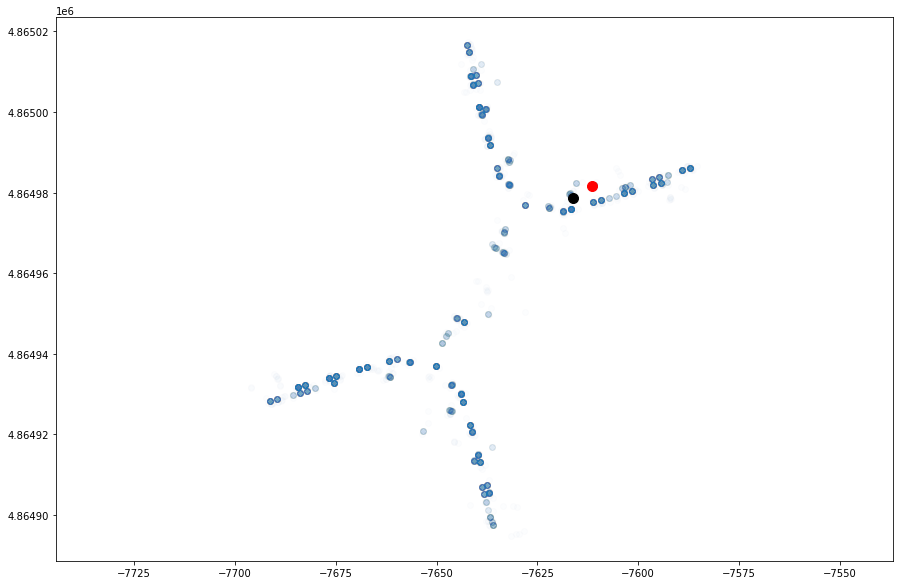

Real point coordinates: lon: -7638.022660439882 lat: 4864903.078029073 floor: 0 building: 0
Predicted point coordinates: lon: -7621.752974623424 lat: 4864903.822053693 floor: 0 building: 0


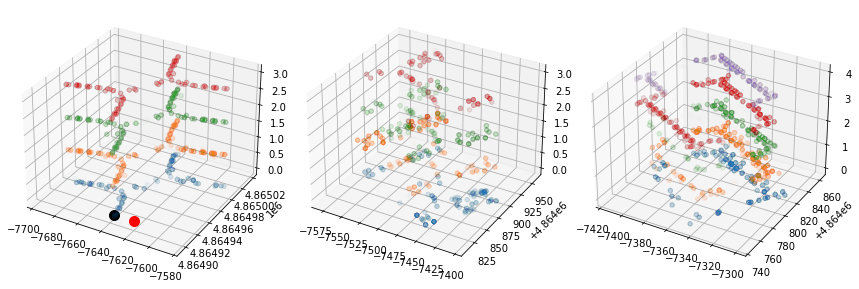

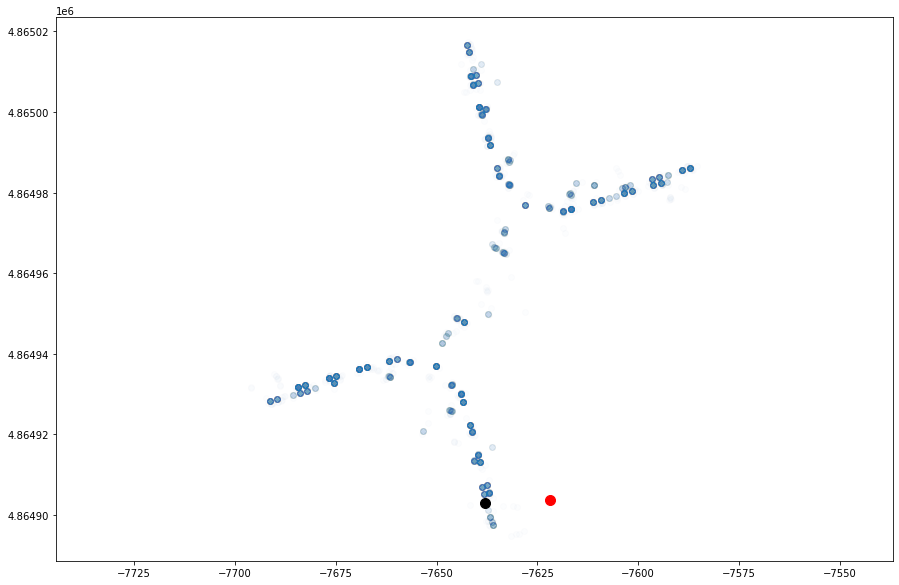

Real point coordinates: lon: -7644.30384668973 lat: 4864948.781008802 floor: 1 building: 0
Predicted point coordinates: lon: -7660.525317406432 lat: 4864958.9124433985 floor: 1 building: 0


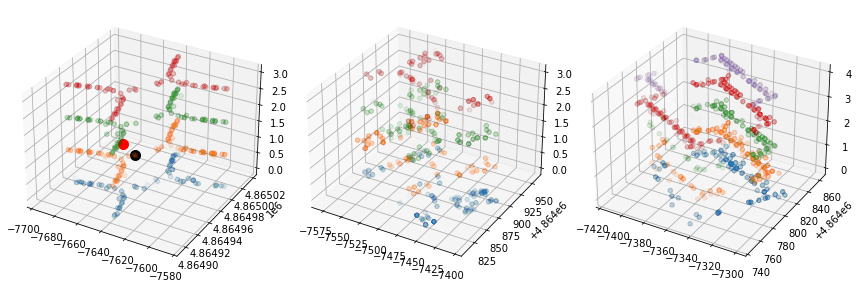

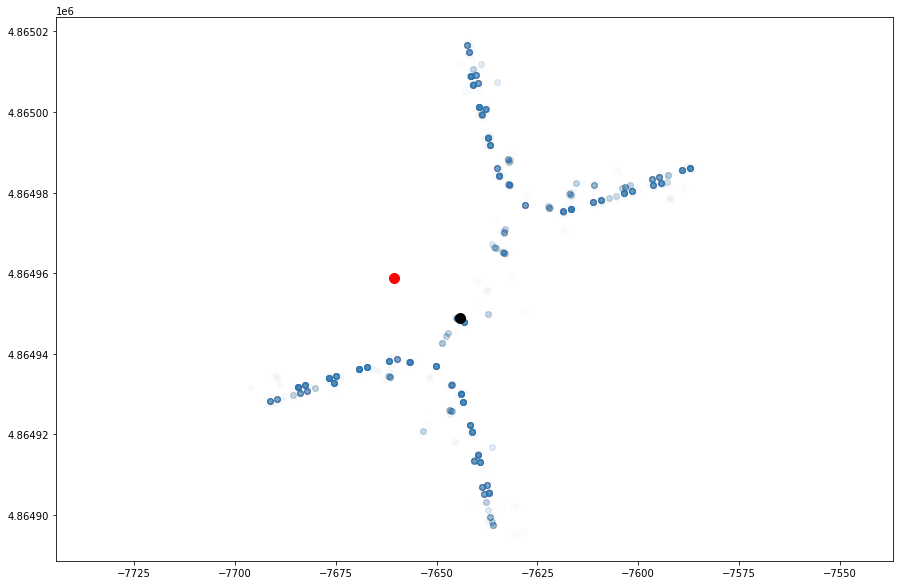

Real point coordinates: lon: -7434.310499999672 lat: 4864861.2802 floor: 1 building: 1
Predicted point coordinates: lon: -7422.701473598621 lat: 4864889.334594436 floor: 1 building: 1


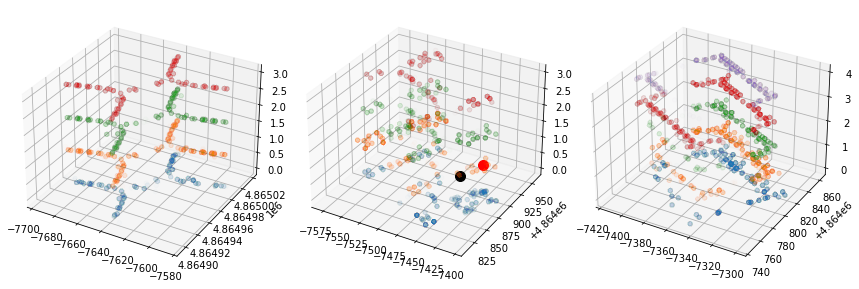

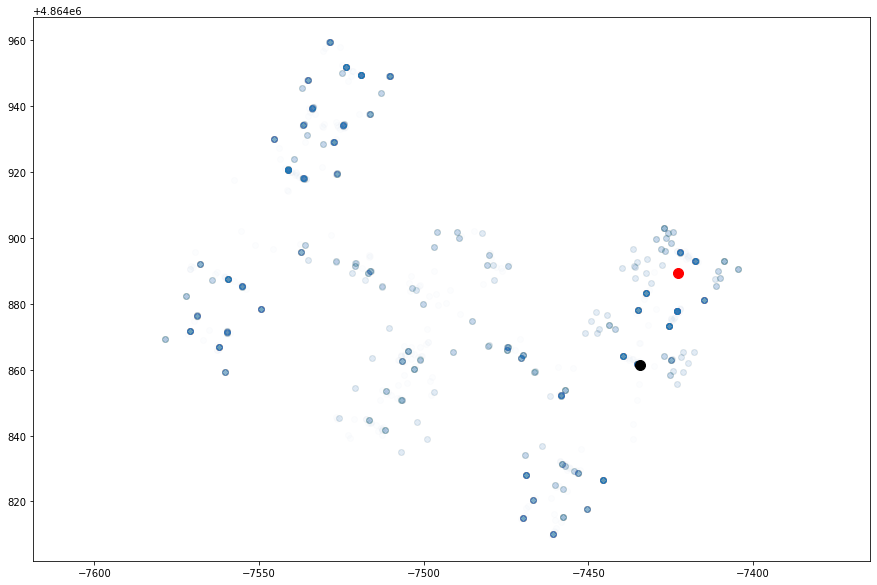

Real point coordinates: lon: -7660.742554721545 lat: 4864935.182176652 floor: 1 building: 0
Predicted point coordinates: lon: -7670.036490015358 lat: 4864937.762926397 floor: 1 building: 0


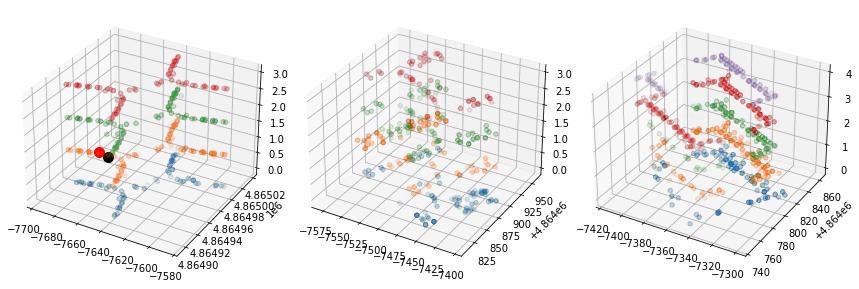

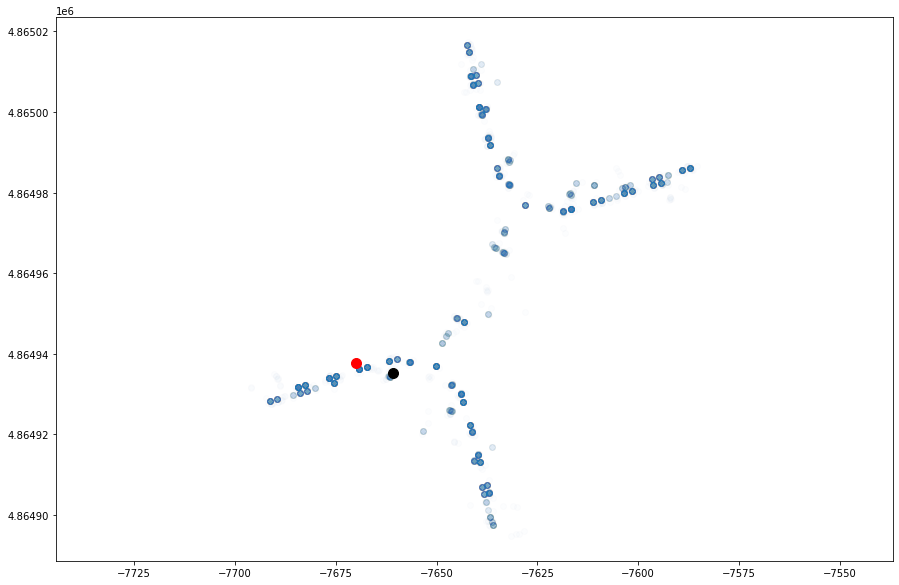

Real point coordinates: lon: -7652.152865217898 lat: 4864925.906269594 floor: 2 building: 0
Predicted point coordinates: lon: -7639.580816102409 lat: 4864921.988763721 floor: 2 building: 0


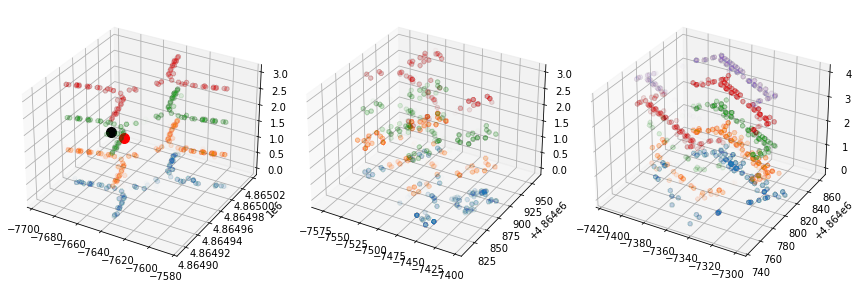

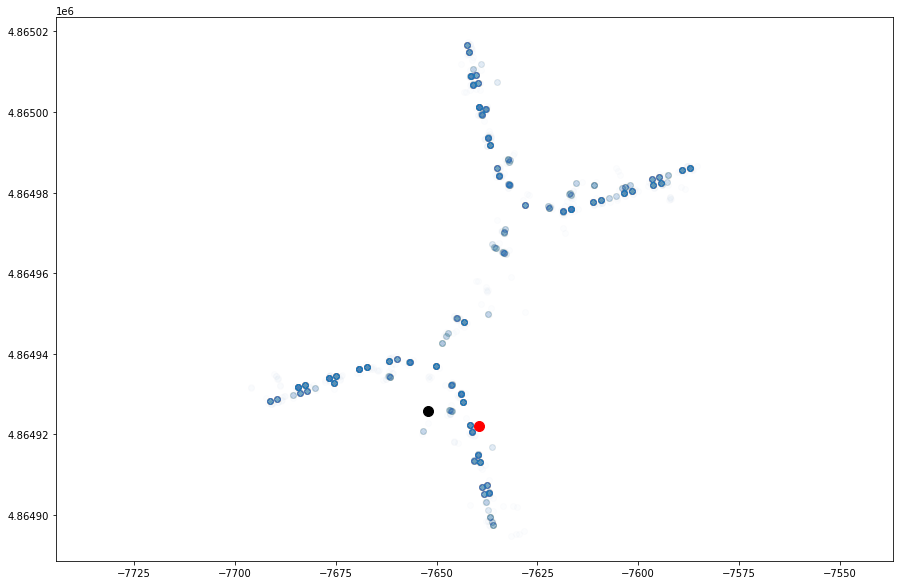

Real point coordinates: lon: -7616.572262020362 lat: 4864979.559708579 floor: 1 building: 0
Predicted point coordinates: lon: -7617.4815558752525 lat: 4864984.941873811 floor: 1 building: 0


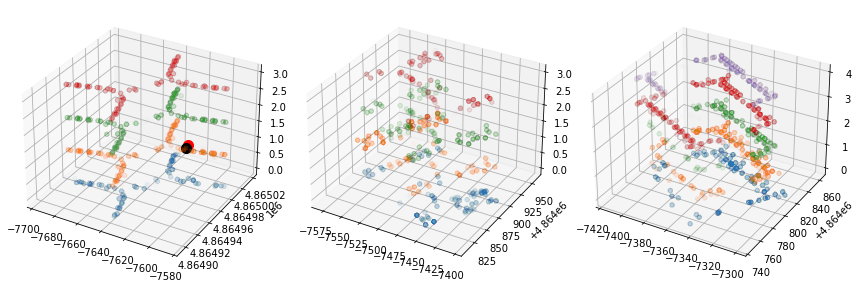

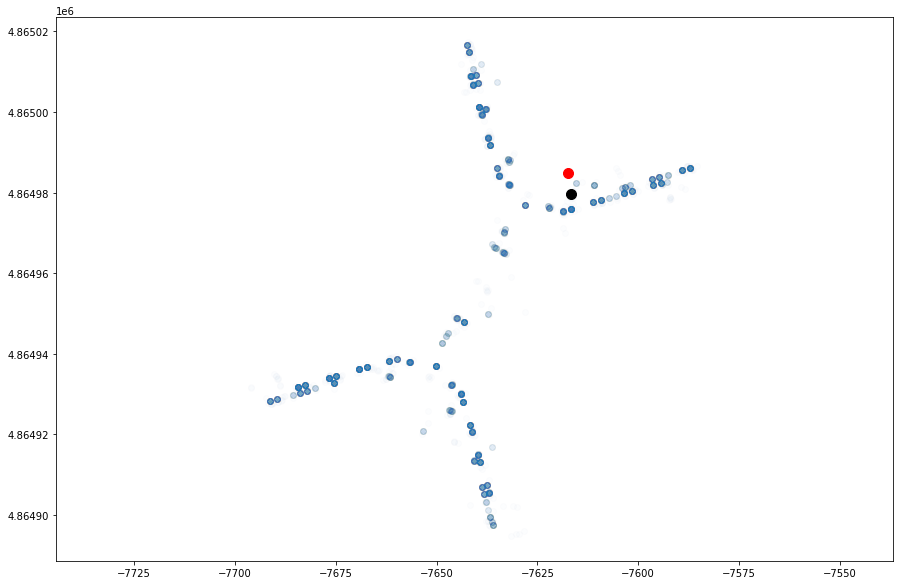

Real point coordinates: lon: -7636.895626662628 lat: 4864905.422739687 floor: 0 building: 0
Predicted point coordinates: lon: -7597.612312974635 lat: 4864904.215522443 floor: 0 building: 0


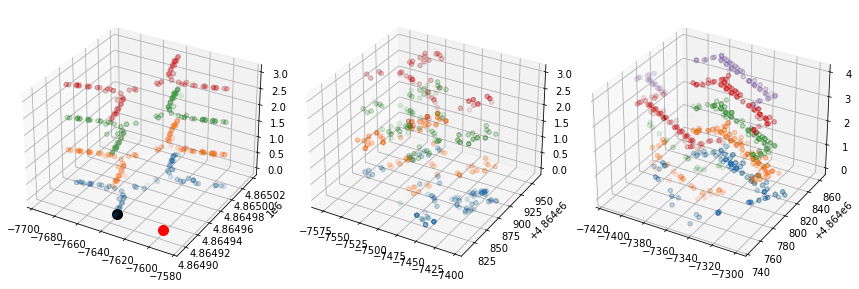

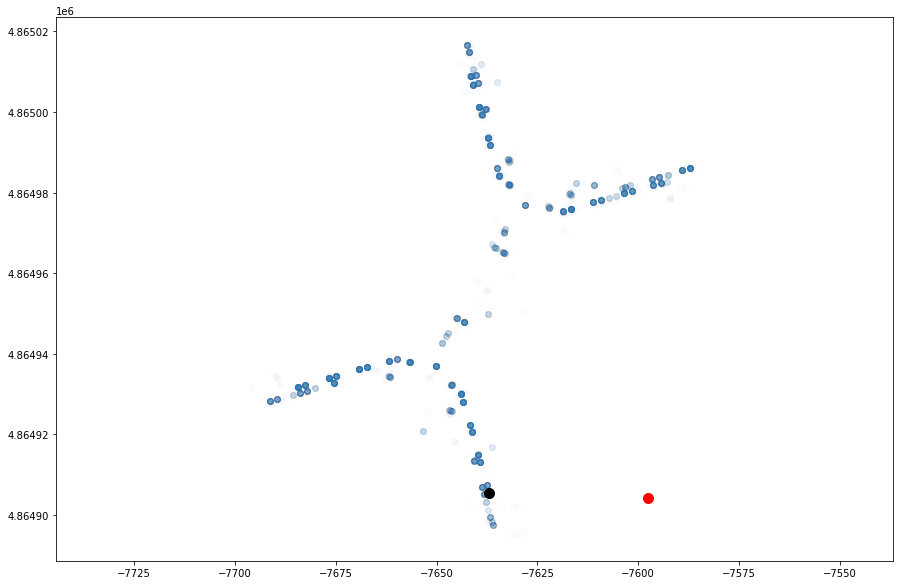

Real point coordinates: lon: -7535.763000000268 lat: 4864917.735200001 floor: 1 building: 1
Predicted point coordinates: lon: -7510.735164033193 lat: 4864920.808577425 floor: 1 building: 1


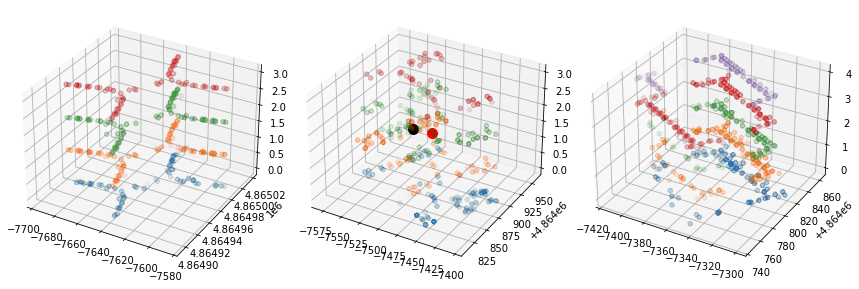

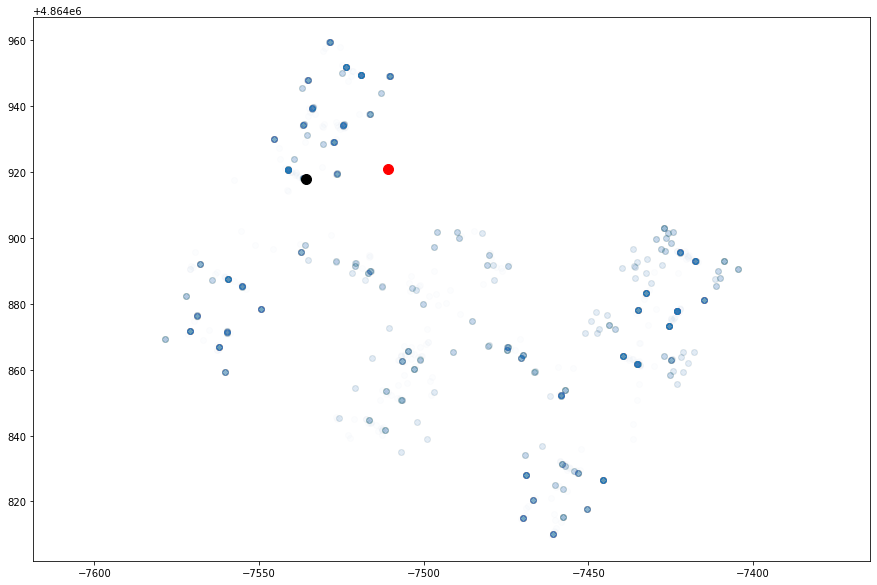

Real point coordinates: lon: -7629.573514667455 lat: 4864895.308918692 floor: 0 building: 0
Predicted point coordinates: lon: -7640.471771224342 lat: 4864896.0608633375 floor: 1 building: 0


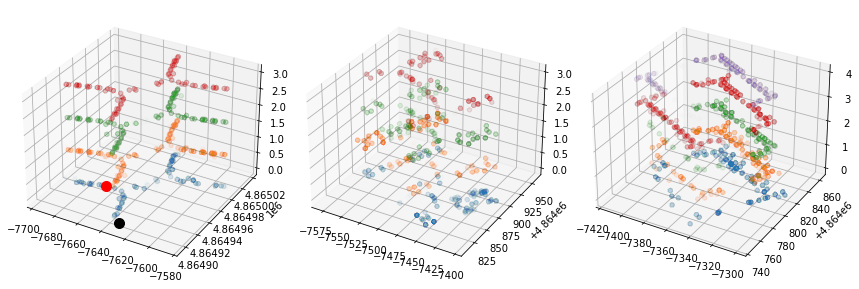

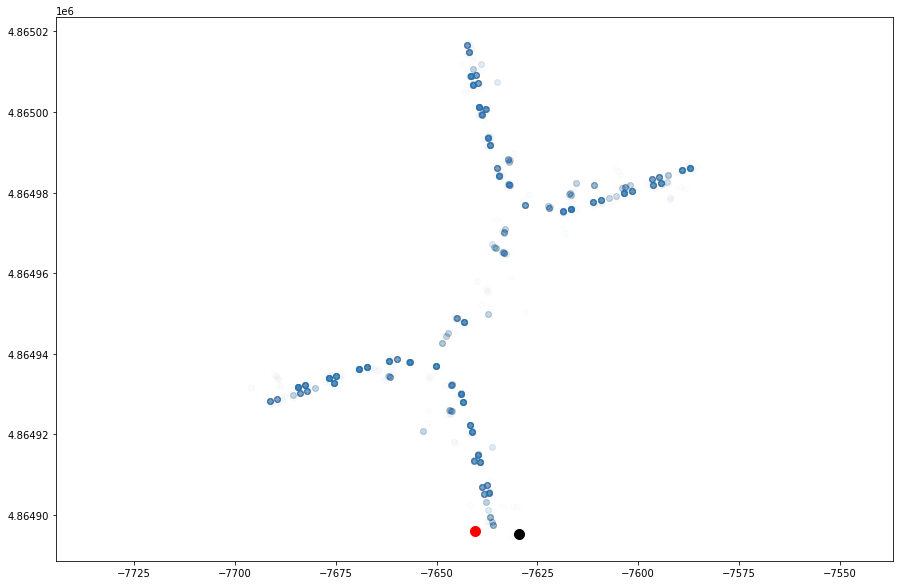

Real point coordinates: lon: -7641.499303368108 lat: 4864922.399177807 floor: 2 building: 0
Predicted point coordinates: lon: -7636.790953583993 lat: 4864916.297572332 floor: 2 building: 0


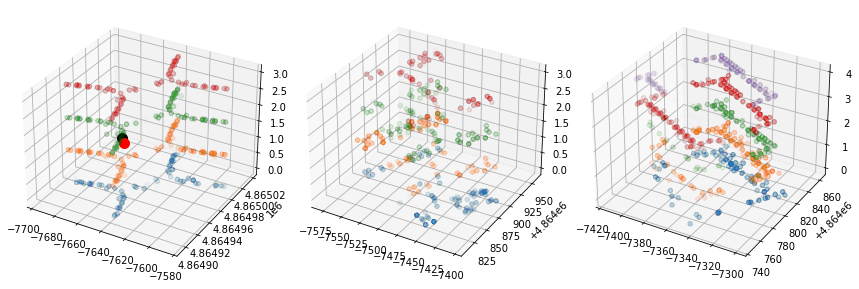

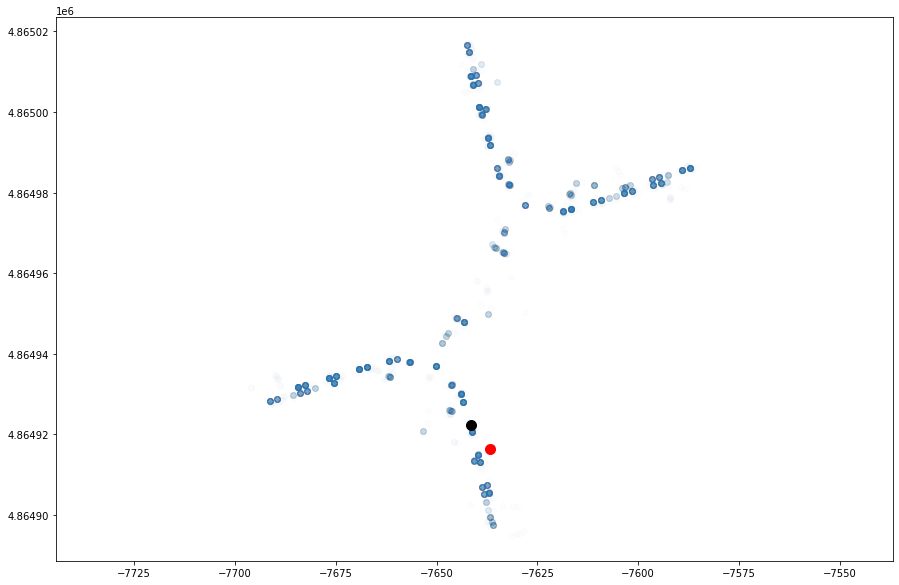

Real point coordinates: lon: -7351.046286474267 lat: 4864833.2908134805 floor: 1 building: 2
Predicted point coordinates: lon: -7349.97113277213 lat: 4864834.2718938235 floor: 1 building: 2


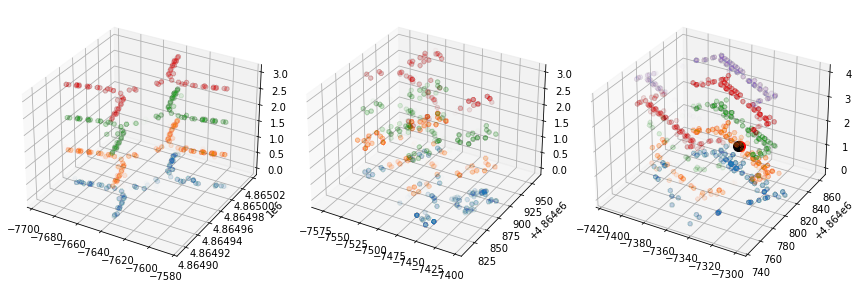

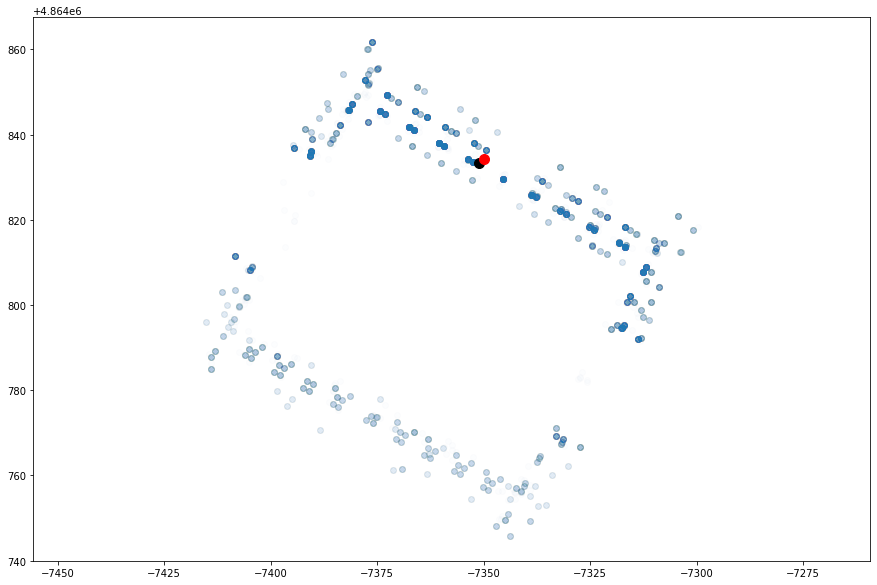

Real point coordinates: lon: -7316.472082156774 lat: 4864800.75959904 floor: 3 building: 2
Predicted point coordinates: lon: -7326.790896045137 lat: 4864817.202439442 floor: 4 building: 2


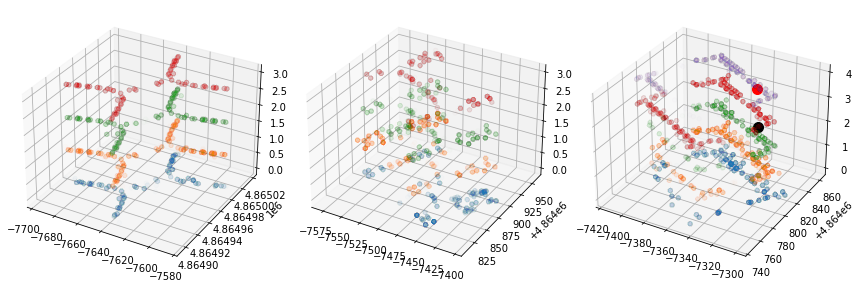

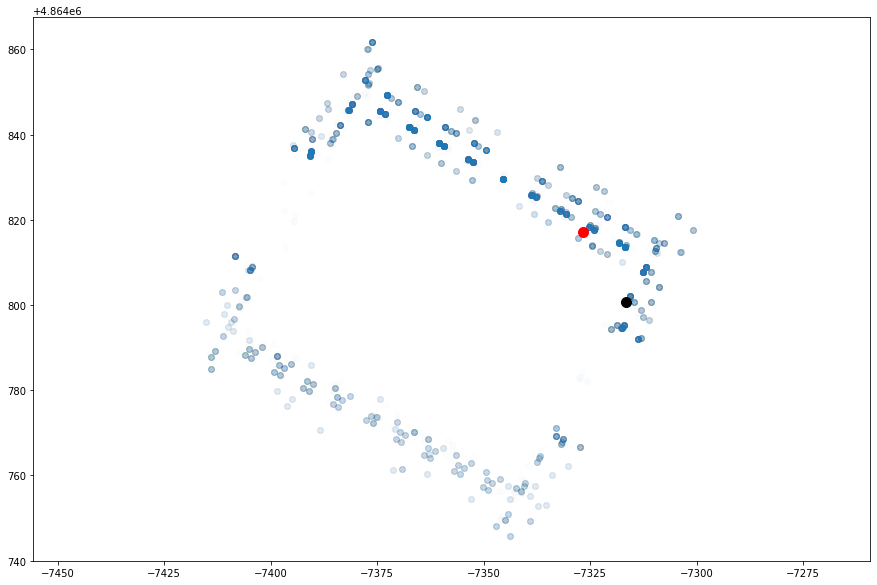

Real point coordinates: lon: -7436.896273802904 lat: 4864863.196136937 floor: 3 building: 1
Predicted point coordinates: lon: -7432.336547853867 lat: 4864877.035110865 floor: 3 building: 1


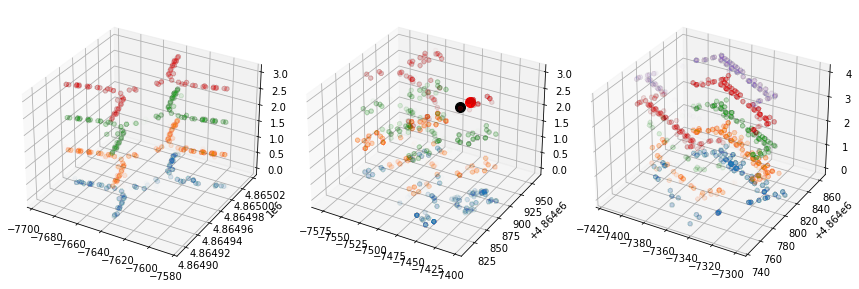

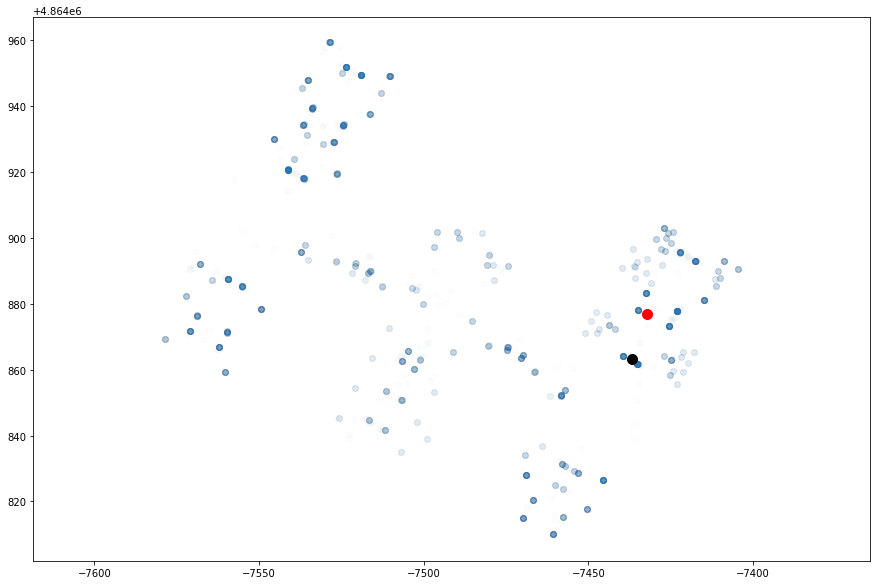

Real point coordinates: lon: -7644.30384668973 lat: 4864948.781008802 floor: 1 building: 0
Predicted point coordinates: lon: -7660.525317406432 lat: 4864958.9124433985 floor: 1 building: 0


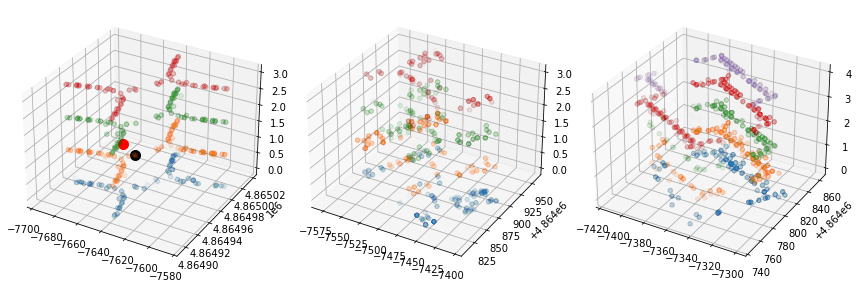

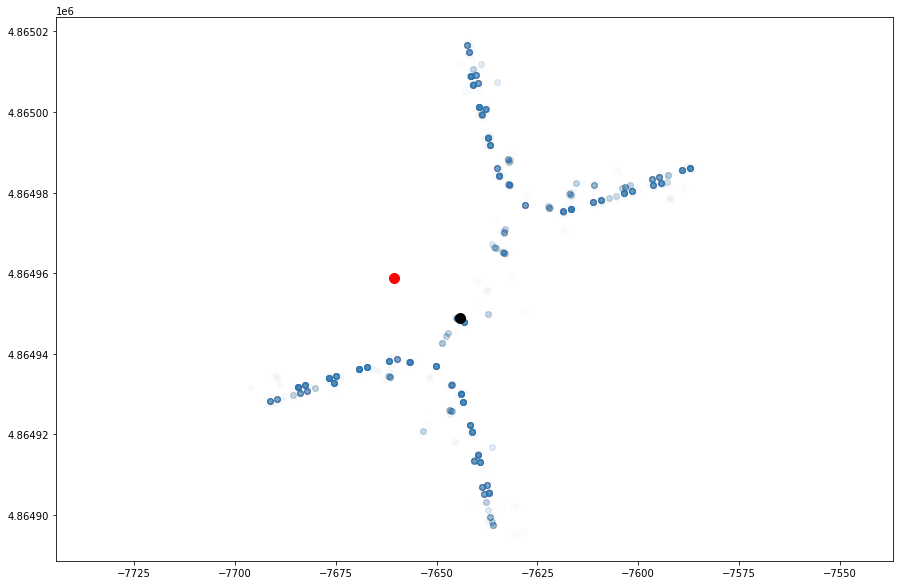

Real point coordinates: lon: -7609.152702315092 lat: 4864978.040423037 floor: 2 building: 0
Predicted point coordinates: lon: -7596.771962458415 lat: 4864978.408471943 floor: 2 building: 0


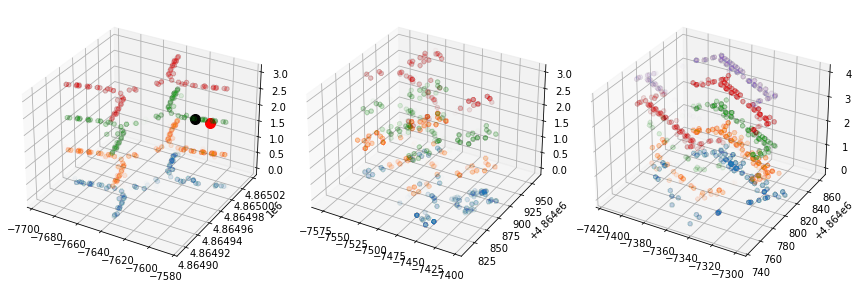

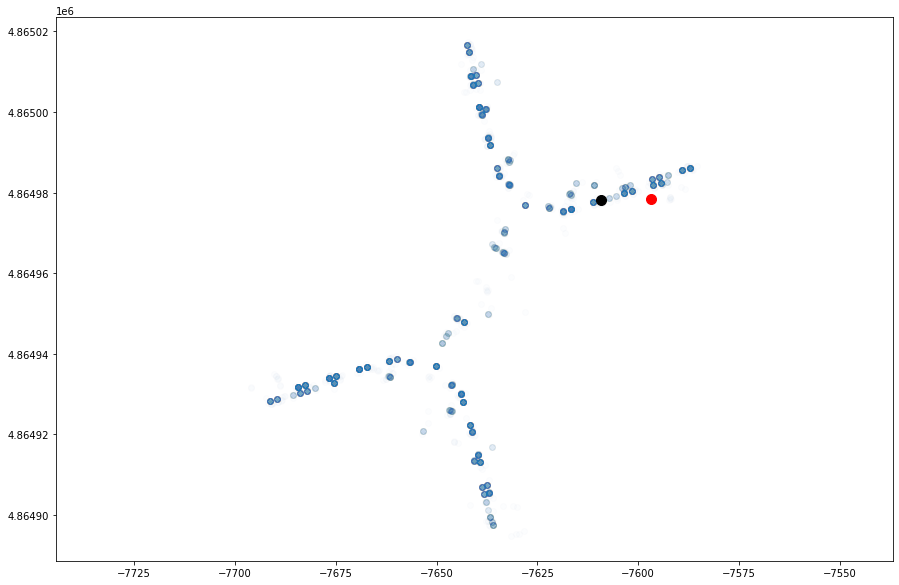

Real point coordinates: lon: -7455.725834169706 lat: 4864830.198260543 floor: 0 building: 1
Predicted point coordinates: lon: -7461.4373294472825 lat: 4864834.668120803 floor: 0 building: 1


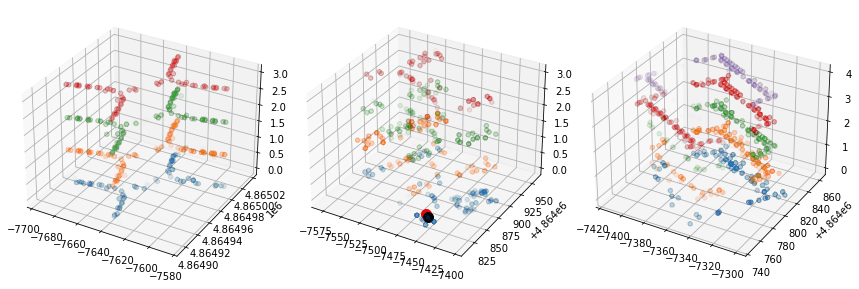

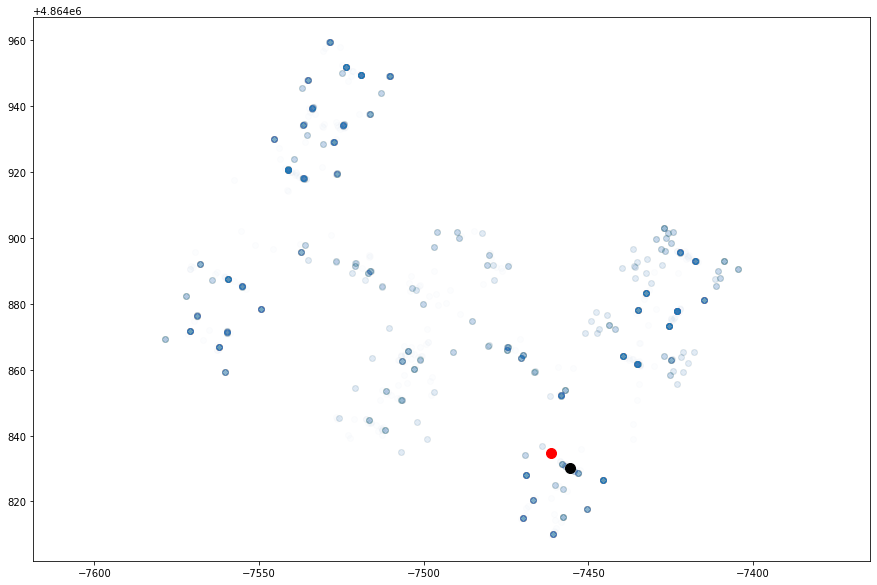

Real point coordinates: lon: -7601.58873392738 lat: 4864980.273296214 floor: 1 building: 0
Predicted point coordinates: lon: -7599.577692366476 lat: 4864981.268957513 floor: 1 building: 0


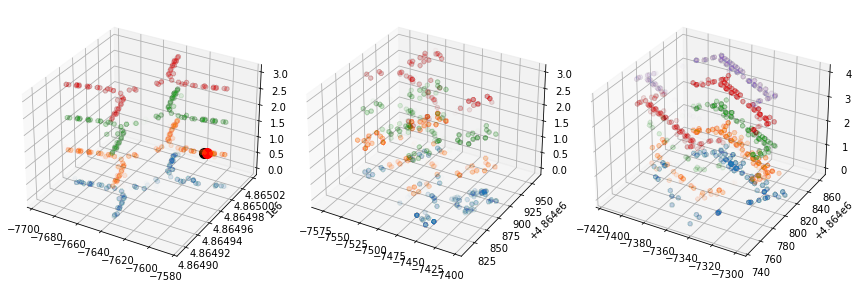

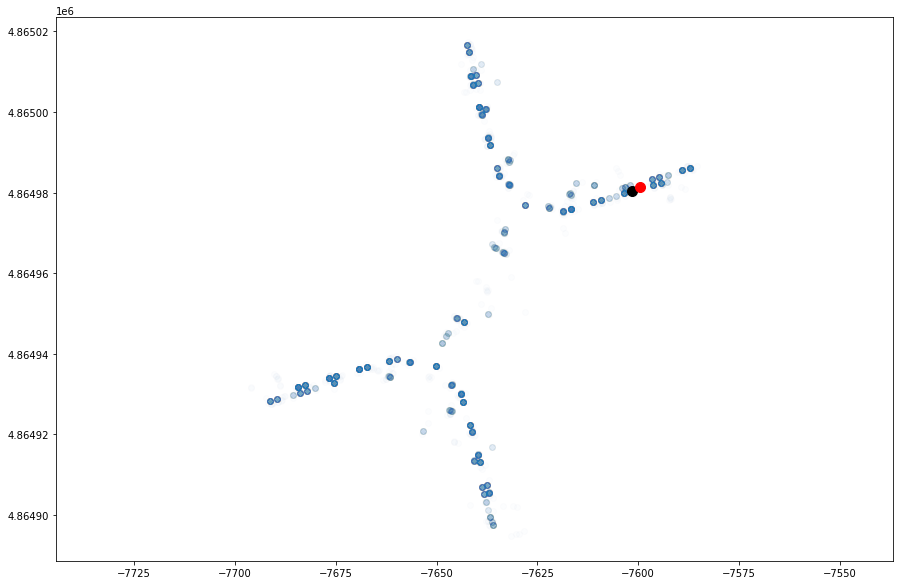

Real point coordinates: lon: -7500.891911364528 lat: 4864864.152655221 floor: 1 building: 1
Predicted point coordinates: lon: -7494.199395433329 lat: 4864854.26220724 floor: 2 building: 1


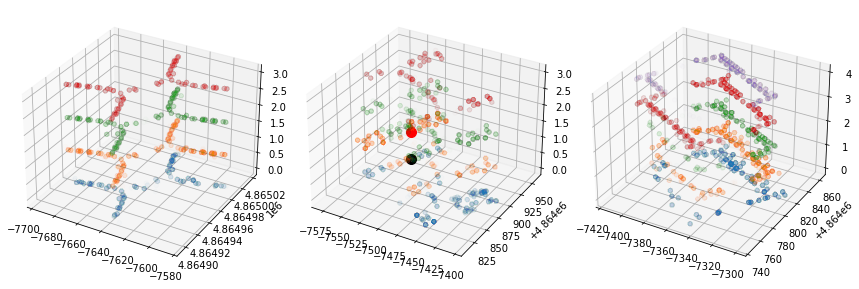

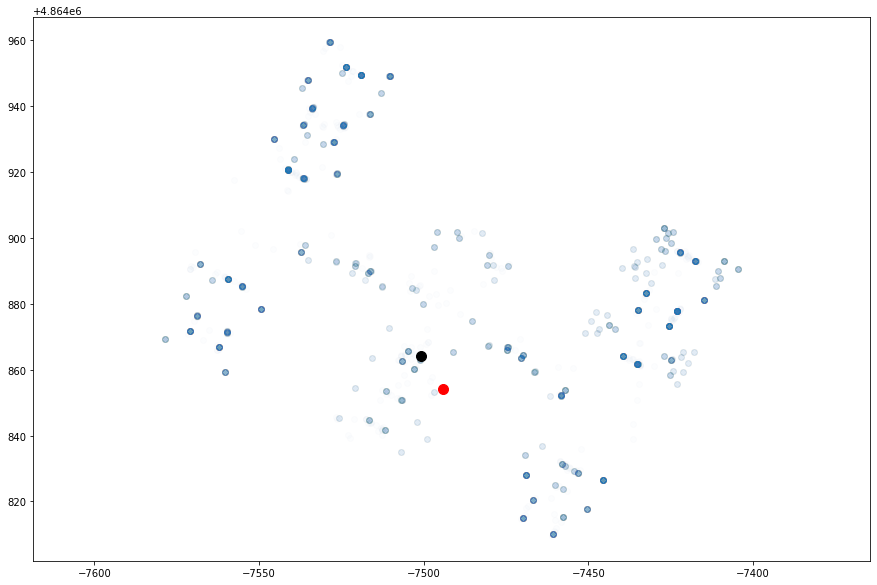

Real point coordinates: lon: -7638.1730634137475 lat: 4864906.766256714 floor: 1 building: 0
Predicted point coordinates: lon: -7629.964796860451 lat: 4864896.248997058 floor: 1 building: 0


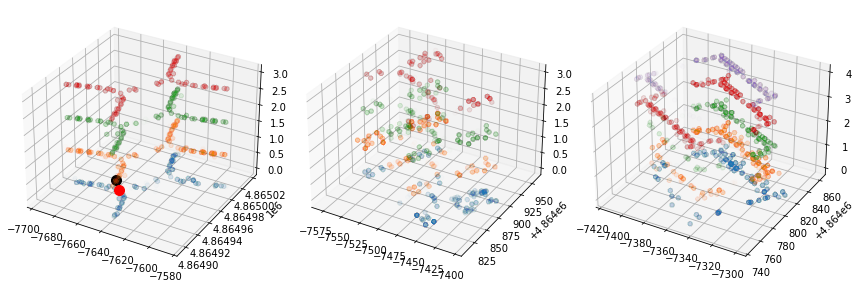

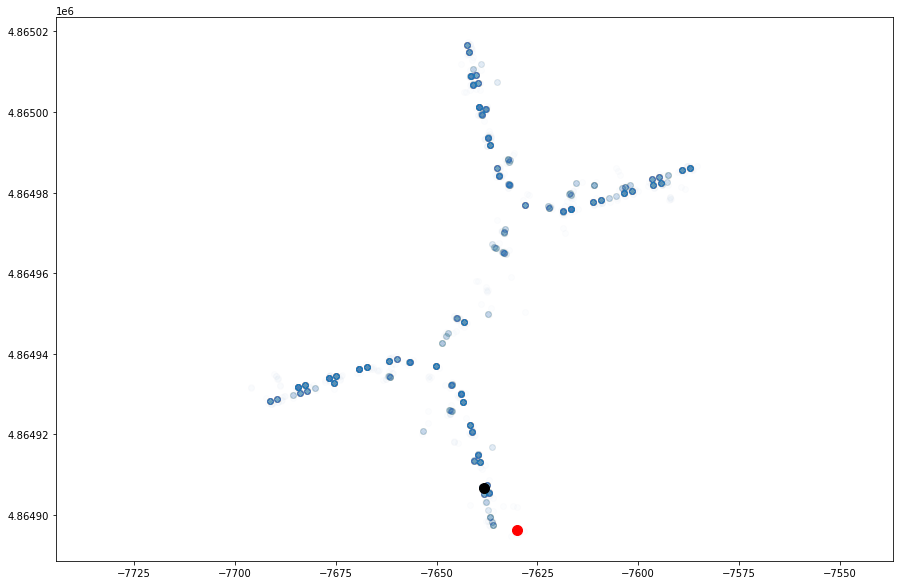

In [48]:
plot_result(clf_model_svc_alt, 
            clf_model_svc_bld, 
            reg_model_svr_lon, 
            reg_model_svr_lat, 
            test_points, plot_data, X_test, y_test)

# Comparison

Below the function printing the heatmap is defined. It will be used for assesment of hyperparameters tuning.

In [ ]:
def heatmap(values, xlabel, ylabel, xticklabels, yticklabels, cmap=None,
            vmin=None, vmax=None, ax=None, fmt="%0.4f"):
    if ax is None:
        ax = plt.gca()
    img = ax.pcolor(values, cmap=cmap, vmin=vmin, vmax=vmax)
    img.update_scalarmappable()
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.set_xticks(np.arange(len(xticklabels)) + .5)
    ax.set_yticks(np.arange(len(yticklabels)) + .5)
    ax.set_xticklabels(xticklabels)
    ax.set_yticklabels(yticklabels)
    ax.set_aspect(1)

    for p, color, value in zip(img.get_paths(), img.get_facecolors(),
                               img.get_array()):
        x, y = p.vertices[:-2, :].mean(0)
        if np.mean(color[:3]) > 0.5:
            c = 'k'
        else:
            c = 'w'
        ax.text(x, y, fmt % value, color=c, ha="center", va="center")
    return img

### Random Forest

In [49]:
print_scores(clf_model_rfc_alt, 
             clf_model_rfc_bld, 
             reg_model_rfr_lon, 
             reg_model_rfr_lat, 
             X_train, y_train, X_test, y_test)

Longitude prediction train r2 score:  0.9958902860378004
Longitude prediction test r2 score:  0.9908834233539446
Latitude prediction train r2 score:  0.9930023694544654
Latitude prediction test r2 score:  0.9823050304245737
Floor prediction train accuracy score:  0.9937804082861013
Floor prediction test accuracy score:  0.873987398739874
Building prediction train accuracy score:  0.9980939960876761
Building prediction test accuracy score:  0.9990999099909991


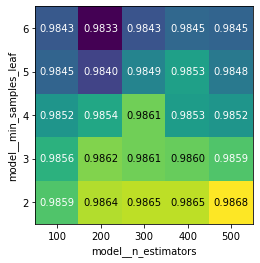

In [77]:
scores = np.array(pd.DataFrame(clf_model_rfc_alt.cv_results_).mean_test_score).reshape(5,5)
heatmap(scores, xlabel='model__n_estimators', xticklabels=param_grid_rfc_alt['model__n_estimators'], ylabel='model__min_samples_leaf', yticklabels=param_grid_rfc_alt['model__min_samples_leaf'], cmap="viridis")
plt.show()

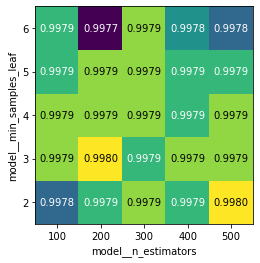

In [78]:
scores = np.array(pd.DataFrame(clf_model_rfc_bld.cv_results_).mean_test_score).reshape(5,5)
heatmap(scores, xlabel='model__n_estimators', xticklabels=param_grid_rfc_bld['model__n_estimators'], ylabel='model__min_samples_leaf', yticklabels=param_grid_rfc_bld['model__min_samples_leaf'], cmap="viridis")
plt.show()

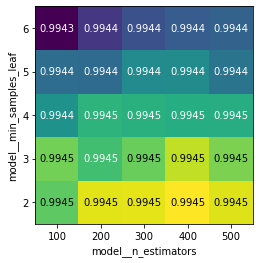

In [79]:
scores = np.array(pd.DataFrame(reg_model_rfr_lon.cv_results_).mean_test_score).reshape(5,5)
heatmap(scores, xlabel='model__n_estimators', xticklabels=param_grid_rfr_lon['model__n_estimators'], ylabel='model__min_samples_leaf', yticklabels=param_grid_rfr_lon['model__min_samples_leaf'], cmap="viridis")
plt.show()

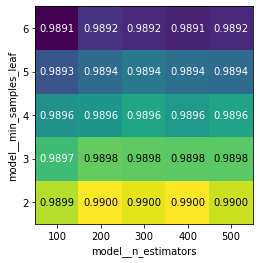

In [80]:
scores = np.array(pd.DataFrame(reg_model_rfr_lat.cv_results_).mean_test_score).reshape(5,5)
heatmap(scores, xlabel='model__n_estimators', xticklabels=param_grid_rfr_lat['model__n_estimators'], ylabel='model__min_samples_leaf', yticklabels=param_grid_rfr_lat['model__min_samples_leaf'], cmap="viridis")
plt.show()

Hyperparameters from RF algorithm family does not form any pattern.

### K-Nearest Neighbours

In [50]:
print_scores(clf_model_knc_alt, 
             clf_model_knc_bld, 
             reg_model_knr_lon, 
             reg_model_knr_lat, 
             X_train, y_train, X_test, y_test)

Longitude prediction train r2 score:  0.9970600601357387
Longitude prediction test r2 score:  0.9885695448372361
Latitude prediction train r2 score:  0.9944816291379881
Latitude prediction test r2 score:  0.9756913923430951
Floor prediction train accuracy score:  0.9966895721522797
Floor prediction test accuracy score:  0.8883888388838884
Building prediction train accuracy score:  0.9979936800922907
Building prediction test accuracy score:  0.9972997299729973


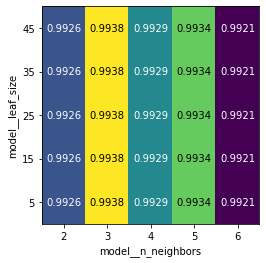

In [81]:
scores = np.array(pd.DataFrame(clf_model_knc_alt.cv_results_).mean_test_score).reshape(5,5)
heatmap(scores, xlabel='model__n_neighbors', xticklabels=param_grid_knc_alt['model__n_neighbors'], ylabel='model__leaf_size', yticklabels=param_grid_knc_alt['model__leaf_size'], cmap="viridis")
plt.show()

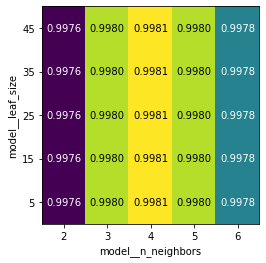

In [82]:
scores = np.array(pd.DataFrame(clf_model_knc_bld.cv_results_).mean_test_score).reshape(5,5)
heatmap(scores, xlabel='model__n_neighbors', xticklabels=param_grid_knc_bld['model__n_neighbors'], ylabel='model__leaf_size', yticklabels=param_grid_knc_bld['model__leaf_size'], cmap="viridis")
plt.show()

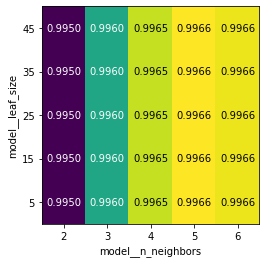

In [83]:
scores = np.array(pd.DataFrame(reg_model_knr_lon.cv_results_).mean_test_score).reshape(5,5)
heatmap(scores, xlabel='model__n_neighbors', xticklabels=param_grid_knr_lon['model__n_neighbors'], ylabel='model__leaf_size', yticklabels=param_grid_knr_lon['model__leaf_size'], cmap="viridis")
plt.show()

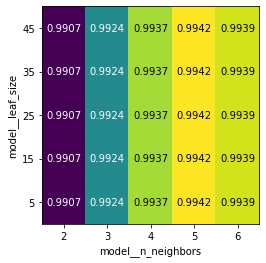

In [84]:
scores = np.array(pd.DataFrame(reg_model_knr_lat.cv_results_).mean_test_score).reshape(5,5)
heatmap(scores, xlabel='model__n_neighbors', xticklabels=param_grid_knr_lat['model__n_neighbors'], ylabel='model__leaf_size', yticklabels=param_grid_knr_lat['model__leaf_size'], cmap="viridis")
plt.show()

According to charts shown above concernig KNN algorithm family model__leaf_size hyperparameter is irrelevant in considered case study.

### Support Vector Mamchine

In [51]:
print_scores(clf_model_svc_alt, 
             clf_model_svc_bld, 
             reg_model_svr_lon, 
             reg_model_svr_lat, 
             X_train, y_train, X_test, y_test)

Longitude prediction train r2 score:  0.9904752188512544
Longitude prediction test r2 score:  0.9717105162529168
Latitude prediction train r2 score:  0.9865602074032322
Latitude prediction test r2 score:  0.9657045820888391
Floor prediction train accuracy score:  0.9974921001153634
Floor prediction test accuracy score:  0.9027902790279028
Building prediction train accuracy score:  0.9980438380899834
Building prediction test accuracy score:  0.9990999099909991


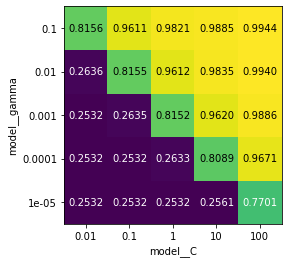

In [85]:
scores = np.array(pd.DataFrame(clf_model_svc_alt.cv_results_).mean_test_score).reshape(5,5)
heatmap(scores, xlabel='model__C', xticklabels=param_grid_svc_alt['model__C'], ylabel='model__gamma', yticklabels=param_grid_svc_alt['model__gamma'], cmap="viridis")
plt.show()

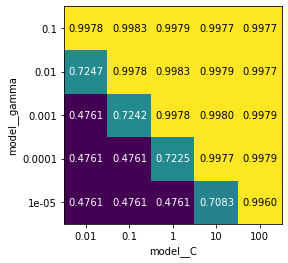

In [86]:
scores = np.array(pd.DataFrame(clf_model_svc_bld.cv_results_).mean_test_score).reshape(5,5)
heatmap(scores, xlabel='model__C', xticklabels=param_grid_svc_bld['model__C'], ylabel='model__gamma', yticklabels=param_grid_svc_bld['model__gamma'], cmap="viridis")
plt.show()

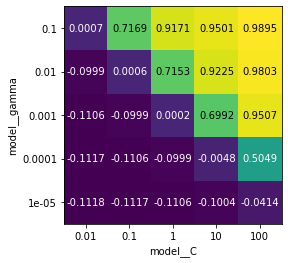

In [87]:
scores = np.array(pd.DataFrame(reg_model_svr_lon.cv_results_).mean_test_score).reshape(5,5)
heatmap(scores, xlabel='model__C', xticklabels=param_grid_svr_lon['model__C'], ylabel='model__gamma', yticklabels=param_grid_svr_lon['model__gamma'], cmap="viridis")
plt.show()

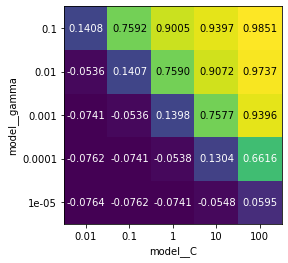

In [88]:
scores = np.array(pd.DataFrame(reg_model_svr_lat.cv_results_).mean_test_score).reshape(5,5)
heatmap(scores, xlabel='model__C', xticklabels=param_grid_svr_lat['model__C'], ylabel='model__gamma', yticklabels=param_grid_svr_lat['model__gamma'], cmap="viridis")
plt.show()

The bigger model__C and model__gamma hyperparameters were the better the score was. As both of hyperparameters were chosen from boundary values in model tuning hyperparameter boundaries should be changed.

# 6. Data and model tuning

In all algorithm families the floor prediction gave the worst result. The reason of that could be different number of floors for particular buildings.

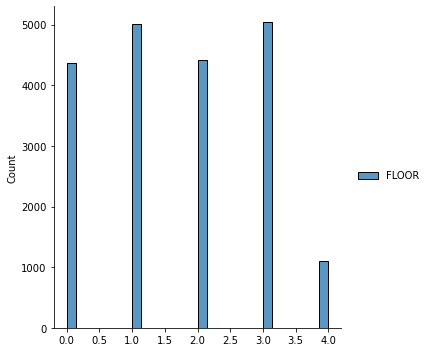

In [18]:
sns.displot(train_data[['FLOOR']])
plt.show()

As shown on chart above the one of categories has significantly less elements than others. To reduce negative effect of this observation the following steps could be done: upsampling and downsampling classes to achieve more similar amount of data in each class or create more classes combining floor and building information so that floor 0 in building no. 1 and building no. 2 are separate classes.

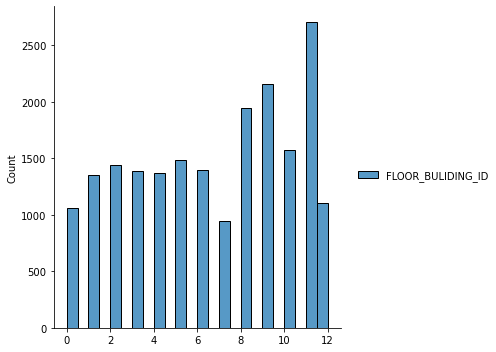

In [19]:
train_data['FLOOR_BULIDING_ID'] = train_data['BUILDINGID']*4+train_data['FLOOR']
test_data['FLOOR_BULIDING_ID'] = test_data['BUILDINGID']*4+test_data['FLOOR']
sns.displot(train_data[['FLOOR_BULIDING_ID']])
plt.show()

Still few classes have significantly different amount of elements, so data sampling to 1400 features in all classes shall be done.

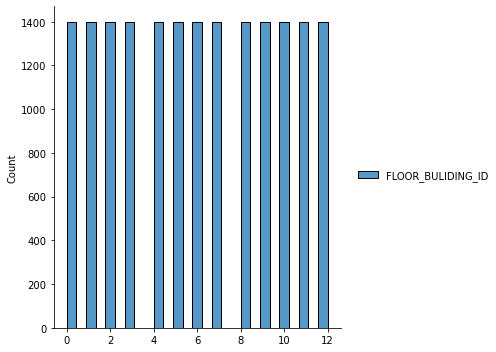

In [20]:
from sklearn.utils import resample

temp_sampling_dict={}
resamlped_train_data = pd.DataFrame()

for floor_id in train_data['FLOOR_BULIDING_ID'].unique():
    key = 'class_'+str(floor_id)+'_resample'
    temp_sampling_dict[key] = train_data[train_data['FLOOR_BULIDING_ID']==floor_id]
    temp_sampling_dict[key] = resample(temp_sampling_dict[key], 
                                       replace=True,              
                                       n_samples=1400,       
                                       random_state=77) 
    resamlped_train_data = pd.concat([resamlped_train_data,temp_sampling_dict[key]])
    
sns.displot(resamlped_train_data[['FLOOR_BULIDING_ID']])
plt.show()

Now division on signal data/location data for train and test data shall be done together with change of WAP signal values from 100 to -111 as before.

In [21]:
X_train = resamlped_train_data[[i for i in resamlped_train_data.columns if 'WAP' in i]]
y_train = resamlped_train_data[[i for i in resamlped_train_data.columns if not 'WAP' in i]]
X_test = test_data[[i for i in test_data.columns if 'WAP' in i]]
y_test = test_data[[i for i in test_data.columns if not 'WAP' in i]]
X_train = X_train.replace(to_replace=100,value=-111)
X_test = X_test.replace(to_replace=100,value=-111)

### Random Forest Classification - attempt 2

In [22]:
preprocessing_pipeline_rfc_alt_bld = Pipeline([
    ('data_scaling', MinMaxScaler()),
    ('feature_selection_1', VarianceThreshold()),
    ('dimension_reduction', PCA(0.85)),
    ('model', RandomForestClassifier())
    ])
param_grid_rfc_alt_bld = {
    'model__max_depth': [10],
    'model__n_estimators': [i for i in range(100,600,100)],
    'model__min_samples_leaf': [i for i in range(2,7,1)]
    }
clf_model_rfc_alt_bld = GridSearchCV(estimator=preprocessing_pipeline_rfc_alt_bld, 
                                 param_grid=param_grid_rfc_alt_bld, 
                                 cv=skfold, 
                                 return_train_score=True,
                                 verbose=3)
clf_model_rfc_alt_bld.fit(X_train, y_train['FLOOR_BULIDING_ID'])
clf_model_rfc_alt_bld.best_params_

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=100; total time=   7.2s
[CV 2/5] END model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=100; total time=   7.3s
[CV 3/5] END model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=100; total time=   7.5s
[CV 4/5] END model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=100; total time=   7.5s
[CV 5/5] END model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=100; total time=   7.4s
[CV 1/5] END model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=200; total time=  13.5s
[CV 2/5] END model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=200; total time=  13.6s
[CV 3/5] END model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=200; total time=  13.6s
[CV 4/5] END model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=200; total time= 

[CV 4/5] END model__max_depth=10, model__min_samples_leaf=5, model__n_estimators=100; total time=   7.0s
[CV 5/5] END model__max_depth=10, model__min_samples_leaf=5, model__n_estimators=100; total time=   6.9s
[CV 1/5] END model__max_depth=10, model__min_samples_leaf=5, model__n_estimators=200; total time=  13.5s
[CV 2/5] END model__max_depth=10, model__min_samples_leaf=5, model__n_estimators=200; total time=  13.4s
[CV 3/5] END model__max_depth=10, model__min_samples_leaf=5, model__n_estimators=200; total time=  13.5s
[CV 4/5] END model__max_depth=10, model__min_samples_leaf=5, model__n_estimators=200; total time=  13.4s
[CV 5/5] END model__max_depth=10, model__min_samples_leaf=5, model__n_estimators=200; total time=  13.6s
[CV 1/5] END model__max_depth=10, model__min_samples_leaf=5, model__n_estimators=300; total time=  19.8s
[CV 2/5] END model__max_depth=10, model__min_samples_leaf=5, model__n_estimators=300; total time=  19.7s
[CV 3/5] END model__max_depth=10, model__min_samples_le

{'model__max_depth': 10,
 'model__min_samples_leaf': 2,
 'model__n_estimators': 400}

### K-Nearest Neighbours Classification - attempt 2

As model__leaf_size hyperparameter was irrelevant thus it shall be omitted.

In [23]:
preprocessing_pipeline_knc_alt_bld = Pipeline([
    ('data_scaling', MinMaxScaler()),
    ('feature_selection_1', VarianceThreshold()),
    ('dimension_reduction', PCA(0.85)),
    ('model', KNeighborsClassifier())
    ])
param_grid_knc_alt_bld = {
    'model__n_neighbors': [i for i in range(2,7,1)]
    }
clf_model_knc_alt_bld = GridSearchCV(estimator=preprocessing_pipeline_knc_alt_bld, 
                                 param_grid=param_grid_knc_alt_bld, 
                                 cv=skfold, 
                                 return_train_score=True,
                                 verbose=3)
clf_model_knc_alt_bld.fit(X_train, y_train['FLOOR_BULIDING_ID'])
clf_model_knc_alt_bld.best_params_

Fitting 5 folds for each of 5 candidates, totalling 25 fits
[CV 1/5] END ...........................model__n_neighbors=2; total time=   1.3s
[CV 2/5] END ...........................model__n_neighbors=2; total time=   1.2s
[CV 3/5] END ...........................model__n_neighbors=2; total time=   1.3s
[CV 4/5] END ...........................model__n_neighbors=2; total time=   1.3s
[CV 5/5] END ...........................model__n_neighbors=2; total time=   1.2s
[CV 1/5] END ...........................model__n_neighbors=3; total time=   1.4s
[CV 2/5] END ...........................model__n_neighbors=3; total time=   1.5s
[CV 3/5] END ...........................model__n_neighbors=3; total time=   1.3s
[CV 4/5] END ...........................model__n_neighbors=3; total time=   1.3s
[CV 5/5] END ...........................model__n_neighbors=3; total time=   1.3s
[CV 1/5] END ...........................model__n_neighbors=4; total time=   1.5s
[CV 2/5] END ...........................model__n_

{'model__n_neighbors': 4}

### Support Vector Classification - attempt 2

The boundaries of hyperparameter search range were changed according to previous comments.

In [24]:
preprocessing_pipeline_svc_alt_bld = Pipeline([
    ('data_scaling', MinMaxScaler()),
    ('feature_selection_1', VarianceThreshold()),
    ('dimension_reduction', PCA(0.85)),
    ('model', SVC())
    ])
param_grid_svc_alt_bld = {
    'model__C': [10**i for i in range(0,5,1)],
    'model__gamma': [10**i for i in range(-3,2,1)]
    }
clf_model_svc_alt_bld = GridSearchCV(estimator=preprocessing_pipeline_svc_alt_bld, 
                                 param_grid=param_grid_svc_alt_bld, 
                                 cv=skfold, 
                                 return_train_score=True,
                                 verbose=3)
clf_model_svc_alt_bld.fit(X_train, y_train['FLOOR_BULIDING_ID'])
clf_model_svc_alt_bld.best_params_

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END .................model__C=1, model__gamma=0.001; total time=  22.2s
[CV 2/5] END .................model__C=1, model__gamma=0.001; total time=  21.7s
[CV 3/5] END .................model__C=1, model__gamma=0.001; total time=  21.8s
[CV 4/5] END .................model__C=1, model__gamma=0.001; total time=  21.7s
[CV 5/5] END .................model__C=1, model__gamma=0.001; total time=  22.0s
[CV 1/5] END ..................model__C=1, model__gamma=0.01; total time=   9.1s
[CV 2/5] END ..................model__C=1, model__gamma=0.01; total time=   8.7s
[CV 3/5] END ..................model__C=1, model__gamma=0.01; total time=   8.8s
[CV 4/5] END ..................model__C=1, model__gamma=0.01; total time=   9.1s
[CV 5/5] END ..................model__C=1, model__gamma=0.01; total time=   8.8s
[CV 1/5] END ...................model__C=1, model__gamma=0.1; total time=   3.6s
[CV 2/5] END ...................model__C=1, mod

[CV 2/5] END .............model__C=10000, model__gamma=0.001; total time=   1.6s
[CV 3/5] END .............model__C=10000, model__gamma=0.001; total time=   1.6s
[CV 4/5] END .............model__C=10000, model__gamma=0.001; total time=   1.6s
[CV 5/5] END .............model__C=10000, model__gamma=0.001; total time=   1.6s
[CV 1/5] END ..............model__C=10000, model__gamma=0.01; total time=   1.5s
[CV 2/5] END ..............model__C=10000, model__gamma=0.01; total time=   1.5s
[CV 3/5] END ..............model__C=10000, model__gamma=0.01; total time=   1.5s
[CV 4/5] END ..............model__C=10000, model__gamma=0.01; total time=   1.5s
[CV 5/5] END ..............model__C=10000, model__gamma=0.01; total time=   1.5s
[CV 1/5] END ...............model__C=10000, model__gamma=0.1; total time=   1.7s
[CV 2/5] END ...............model__C=10000, model__gamma=0.1; total time=   1.6s
[CV 3/5] END ...............model__C=10000, model__gamma=0.1; total time=   1.6s
[CV 4/5] END ...............

{'model__C': 100, 'model__gamma': 1}

### Scores - attempt 2

In [25]:
def print_scores_attempt2(alt_bld_model, X_train, X_test, y_train, y_test):
    print('Floor prediction train accuracy score: ', 
        metrics.accuracy_score(y_train['FLOOR_BULIDING_ID'], alt_bld_model.best_estimator_.predict(X_train)))
    print('Floor prediction test accuracy score: ', 
        metrics.accuracy_score(y_test['FLOOR_BULIDING_ID'], alt_bld_model.best_estimator_.predict(X_test)))

Random Forest

In [26]:
print_scores_attempt2(clf_model_rfc_alt_bld, X_train, X_test, y_train, y_test)

Floor prediction train accuracy score:  0.9963186813186813
Floor prediction test accuracy score:  0.8883888388838884


K-Nearest Neighbours

In [27]:
print_scores_attempt2(clf_model_knc_alt_bld, X_train, X_test, y_train, y_test)

Floor prediction train accuracy score:  0.9964835164835165
Floor prediction test accuracy score:  0.8874887488748875


Support Vector Machine

In [28]:
print_scores_attempt2(clf_model_svc_alt_bld, X_train, X_test, y_train, y_test)

Floor prediction train accuracy score:  0.9982417582417582
Floor prediction test accuracy score:  0.8775877587758776


As it can be seen results from second attempt are more or less similar to previous results. Last approach in this project to improve result would be to check different values of explained variance in PCA algorithm using best hyperparameters from aproach number 2.

### Random Forest Classification - attempt 3

In [31]:
preprocessing_pipeline_rfc_alt_bld_v2 = Pipeline([
    ('data_scaling', MinMaxScaler()),
    ('feature_selection_1', VarianceThreshold()),
    ('dimension_reduction', PCA(0.85)),
    ('model', RandomForestClassifier())
    ])
param_grid_rfc_alt_bld_v2 = {
    'model__max_depth': [10],
    'model__n_estimators': [400],
    'model__min_samples_leaf': [2],
    'dimension_reduction__n_components': [0.875, 0.9, 0.925]
    }
clf_model_rfc_alt_bld_v2 = GridSearchCV(estimator=preprocessing_pipeline_rfc_alt_bld_v2, 
                                 param_grid=param_grid_rfc_alt_bld_v2, 
                                 cv=skfold, 
                                 return_train_score=True,
                                 verbose=3)
clf_model_rfc_alt_bld_v2.fit(X_train, y_train['FLOOR_BULIDING_ID'])
clf_model_rfc_alt_bld_v2.best_params_

Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV 1/5] END dimension_reduction__n_components=0.875, model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=400; total time=  33.5s
[CV 2/5] END dimension_reduction__n_components=0.875, model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=400; total time=  33.2s
[CV 3/5] END dimension_reduction__n_components=0.875, model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=400; total time=  33.6s
[CV 4/5] END dimension_reduction__n_components=0.875, model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=400; total time=  31.3s
[CV 5/5] END dimension_reduction__n_components=0.875, model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=400; total time=  32.7s
[CV 1/5] END dimension_reduction__n_components=0.9, model__max_depth=10, model__min_samples_leaf=2, model__n_estimators=400; total time=  37.7s
[CV 2/5] END dimension_reduction__n_components=0.9, model__max_dep

{'dimension_reduction__n_components': 0.9,
 'model__max_depth': 10,
 'model__min_samples_leaf': 2,
 'model__n_estimators': 400}

### K-Nearest Neighbours Classification - attempt 3

In [33]:
preprocessing_pipeline_knc_alt_bld_v2 = Pipeline([
    ('data_scaling', MinMaxScaler()),
    ('feature_selection_1', VarianceThreshold()),
    ('dimension_reduction', PCA(0.85)),
    ('model', KNeighborsClassifier())
    ])
param_grid_knc_alt_bld_v2 = {
    'model__n_neighbors': [4],
    'dimension_reduction__n_components': [0.875, 0.9, 0.925]
    }
clf_model_knc_alt_bld_v2 = GridSearchCV(estimator=preprocessing_pipeline_knc_alt_bld_v2, 
                                 param_grid=param_grid_knc_alt_bld_v2, 
                                 cv=skfold, 
                                 return_train_score=True,
                                 verbose=3)
clf_model_knc_alt_bld_v2.fit(X_train, y_train['FLOOR_BULIDING_ID'])
clf_model_knc_alt_bld_v2.best_params_

Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV 1/5] END dimension_reduction__n_components=0.875, model__n_neighbors=4; total time=   1.7s
[CV 2/5] END dimension_reduction__n_components=0.875, model__n_neighbors=4; total time=   1.6s
[CV 3/5] END dimension_reduction__n_components=0.875, model__n_neighbors=4; total time=   1.6s
[CV 4/5] END dimension_reduction__n_components=0.875, model__n_neighbors=4; total time=   1.6s
[CV 5/5] END dimension_reduction__n_components=0.875, model__n_neighbors=4; total time=   1.5s
[CV 1/5] END dimension_reduction__n_components=0.9, model__n_neighbors=4; total time=   1.6s
[CV 2/5] END dimension_reduction__n_components=0.9, model__n_neighbors=4; total time=   1.6s
[CV 3/5] END dimension_reduction__n_components=0.9, model__n_neighbors=4; total time=   1.7s
[CV 4/5] END dimension_reduction__n_components=0.9, model__n_neighbors=4; total time=   1.6s
[CV 5/5] END dimension_reduction__n_components=0.9, model__n_neighbors=4; total time=   1.5s


{'dimension_reduction__n_components': 0.925, 'model__n_neighbors': 4}

### Support Vector Classification - attempt 3

In [35]:
preprocessing_pipeline_svc_alt_bld_v2 = Pipeline([
    ('data_scaling', MinMaxScaler()),
    ('feature_selection_1', VarianceThreshold()),
    ('dimension_reduction', PCA(0.85)),
    ('model', SVC())
    ])
param_grid_svc_alt_bld_v2 = {
    'model__C': [100],
    'model__gamma': [1],
    'dimension_reduction__n_components': [0.875, 0.9, 0.925]
    }
clf_model_svc_alt_bld_v2 = GridSearchCV(estimator=preprocessing_pipeline_svc_alt_bld_v2, 
                                 param_grid=param_grid_svc_alt_bld_v2, 
                                 cv=skfold, 
                                 return_train_score=True,
                                 verbose=3)
clf_model_svc_alt_bld_v2.fit(X_train, y_train['FLOOR_BULIDING_ID'])
clf_model_svc_alt_bld_v2.best_params_

Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV 1/5] END dimension_reduction__n_components=0.875, model__C=100, model__gamma=1; total time=   5.2s
[CV 2/5] END dimension_reduction__n_components=0.875, model__C=100, model__gamma=1; total time=   5.5s
[CV 3/5] END dimension_reduction__n_components=0.875, model__C=100, model__gamma=1; total time=   5.5s
[CV 4/5] END dimension_reduction__n_components=0.875, model__C=100, model__gamma=1; total time=   5.2s
[CV 5/5] END dimension_reduction__n_components=0.875, model__C=100, model__gamma=1; total time=   5.3s
[CV 1/5] END dimension_reduction__n_components=0.9, model__C=100, model__gamma=1; total time=   6.3s
[CV 2/5] END dimension_reduction__n_components=0.9, model__C=100, model__gamma=1; total time=   6.2s
[CV 3/5] END dimension_reduction__n_components=0.9, model__C=100, model__gamma=1; total time=   6.3s
[CV 4/5] END dimension_reduction__n_components=0.9, model__C=100, model__gamma=1; total time=   6.2s
[CV 5/5] END dimensio

{'dimension_reduction__n_components': 0.9, 'model__C': 100, 'model__gamma': 1}

### Scores - attempt 3

In [39]:
print_scores_attempt2(clf_model_rfc_alt_bld_v2, X_train, X_test, y_train, y_test)

Floor prediction train accuracy score:  0.996978021978022
Floor prediction test accuracy score:  0.8937893789378938


In [40]:
print_scores_attempt2(clf_model_knc_alt_bld_v2, X_train, X_test, y_train, y_test)

Floor prediction train accuracy score:  0.9963186813186813
Floor prediction test accuracy score:  0.8874887488748875


In [41]:
print_scores_attempt2(clf_model_svc_alt_bld_v2, X_train, X_test, y_train, y_test)

Floor prediction train accuracy score:  0.9982417582417582
Floor prediction test accuracy score:  0.8694869486948695


As it can be seen results from third attempt are more or less similar to previous results.

# 7. Summary

All algorithm familes gave similar results for particular regression and classification cases. To further improve the performances of the models different hyperparameters combinations could be checked. For instance for KNN algorithms leaf_size hyperparameter turned out to be irrelevant in this case study. But to perform this probably more computing power would be needed (all above results were counted on single computing unit - personal laptop).

# 8. References

1. https://archive.ics.uci.edu/ml/datasets/ujiindoorloc
2. https://satelita.mapa.info.pl/